# Make Stats And Figs

A dedicated notebook for generating statistics and figures from sorting data.

Run after executing core modules. Will pull information from cached sorting and recording files in `sortings/`

In [148]:
!jupyter nbconvert --to script marshmakestatsandfigs-class.ipynb --TagRemovePreprocessor.remove_cell_tags='{"note"}' --output-dir /mnt/isilon/marsh_single_unit/MarshMountainSort/pys-class/mms --output figures

[NbConvertApp] Converting notebook marshmakestatsandfigs-class.ipynb to script
[NbConvertApp] Writing 34517 bytes to /mnt/isilon/marsh_single_unit/MarshMountainSort/pys-class/mms/figures.py


In [149]:
import os
import sys

# sys.path.append(os.path.abspath(".."))
sys.path.insert(0, os.path.abspath('..'))

# os.path.abspath("../")
# from mms import core, parser, constants


In [150]:
import glob
import shutil
import os
import csv
import gzip
from pathlib import Path
import datetime
from warnings import warn
from abc import ABC, abstractmethod
import re
import dateutil.parser as dparser
from textwrap import wrap
from functools import reduce
from typing import Literal

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
# import probeinterface as pi
import pandas as pd
# import openpyxl
from statannotations.Annotator import Annotator
# import starbars
# from probeinterface.plotting import plot_probe
# import tempfile
# from tempfile import TemporaryDirectory
from scipy.optimize import curve_fit
from scipy.stats import skewnorm, norm, zscore
from scipy.signal import savgol_filter, savgol_coeffs, convolve, windows
import scipy.cluster.hierarchy as shc
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances

import mountainsort5 as ms5
from mountainsort5.util import create_cached_recording
import spikeinterface.core as si
import spikeinterface.extractors as se
# import spikeinterface.preprocessing as spre
# import spikeinterface.sorters as ss
import spikeinterface.postprocessing as spost
import spikeinterface.qualitymetrics as sqm
# import spikeinterface.exporters as sexp
# import spikeinterface.comparison as scmp
# import spikeinterface.curation as scur
# import spikeinterface.sortingcomponents as sc
import spikeinterface.widgets as sw

from mms import core
# from mms.constants import GENOTYPE_ALIASES, REGIONS, FAST_JOB_KWARGS
from mms import constants
from mms.parser import FolderPathParser

In [151]:
class DepthSheetReader():
    # REVIEW this can kind of just be a static class with states
    # But it is used as an instance class

    df_depths:pd.DataFrame = None
    df_optdepth:pd.DataFrame = None

    def __init__(self, base_folder: str, sortdir_name: str = 'sortings', truncate: bool = False, verbose: bool = True, omit: list[str] = []) -> None:
        self.base_folder = Path(base_folder)
        self.sortdir_name = sortdir_name
        self.sort_folder = self.base_folder / sortdir_name
        self.truncate = truncate
        self.verbose = verbose
        self.omit = omit

        self.sort_folders = self._glob_all_folders(self.sortdir_name)
        self.sort_all_ids = self._get_all_ids()

    # Theres some overlap in function implementation with core.IAnimalAnalyer,
    # but functionality > maintainability
    def _glob_all_folders(self, base_subdir_name:str):
        searchstring = self.base_folder / base_subdir_name / '*'
        subfolders = glob.glob(str(searchstring))
        subfolders = list(set(subfolders))
        subfolders = [x for x in subfolders if os.path.isdir(x)]
        subfolders = [x for x in subfolders if not any(substring in x for substring in self.omit)]
        subfolders.sort()
        return subfolders

    def make_filenametodepth_xlsx(self, xlsx_name:str='filename-to-depth.xlsx', xlsx_dir_name:str='xlsxs', read_old:bool=True):
        # self.sort_folders = self._glob_all_folders(self.sortdir_name)
        names = [FolderPathParser.parse_name(f) for f in self.sort_folders]
        ids = [FolderPathParser.parse_id(f, as_int=True) for f in self.sort_folders]
        genotypes = [FolderPathParser.parse_genotype(f) for f in self.sort_folders]
        dates = [FolderPathParser.parse_date(f) for f in self.sort_folders]
        df = pd.DataFrame({'folder' : self.sort_folders,
                           'name' : names,
                           'id' : ids,
                           'genotype' : genotypes,
                           'date' : dates,
                           'depth' : np.nan * len(self.sort_folders)})
        # df['id'] = df['id'].astype(str)
        today = datetime.date.today().strftime(r'%m-%d-%Y')
        out_path = self.base_folder / xlsx_dir_name / xlsx_name

        if read_old:
            # Merge all old spreadsheets
            cols = df.columns.drop(['depth']).tolist() # Without dropping depth this would just be concat
            dfs_old = pd.read_excel(out_path, sheet_name=None, index_col=0)
            dfs_old = list(dfs_old.values())
            dfs = [df] + dfs_old
            df_merge = reduce(lambda left,right: pd.merge(left, right, on=cols, how='outer', suffixes=('', '_y')), 
                              dfs)
            # Pull last value updated in the spreadsheet for each recording
            mapping = {'depth':'depth', 'depth_y':'depth'}
            mapping.update({k:v for k,v in zip(cols, cols)})
            df_last:pd.DataFrame = df_merge.set_index('name').T.groupby(mapping).last()
            df_last = df_last.T.reset_index().fillna(value=np.NaN)
            df_out = df_last[df.columns]
            
            df = df_out
            
        with pd.ExcelWriter(out_path, engine='openpyxl', mode='a', if_sheet_exists='new') as writer:
            df.to_excel(writer, sheet_name=today)
    
    def read_filenametodepth_xlsx(self, xlsx_name:str='filename-to-depth.xlsx', xlsx_dir_name:str='xlsxs', sheet_name=-1):
        sheet_path = self.base_folder / xlsx_dir_name / xlsx_name
        if sheet_name is None:
            df = pd.read_excel(sheet_path, sheet_name=-1, index_col=0)
        else:
            df = pd.read_excel(sheet_path, sheet_name=sheet_name, index_col=0)
        DepthSheetReader.df_depths = df
        return df
    
    @staticmethod
    def get_row_from_depth_df(identifier:int, region:str, depth:float=None, name:str=None):
        # def _load_sortinganalyzer(self, ):
        if depth is None and name is None:
            raise TypeError("Cannot have both depth and name as None")
        mask = DepthSheetReader.df_depths['id'] == identifier
        if depth is not None and depth == depth:
            mask = mask & (DepthSheetReader.df_depths['depth'] == depth)
        if name is not None and name == name:
            mask = mask & (DepthSheetReader.df_depths['name'] == name)

        df_mask = DepthSheetReader.df_depths[mask]
        if len(df_mask.index) == 0:
            warn("No match found for criteria")
            return None
        elif len(df_mask.index) >= 2:
            raise ValueError("Too many matches found for criteria")

        return df_mask.iloc[0]

    @staticmethod
    def __validate_and_get_dfdepth() -> pd.DataFrame:
        if DepthSheetReader.df_depths is None:
            raise TypeError('df_depths was not generated yet')
        return DepthSheetReader.df_depths

    @staticmethod
    def parse_depth(path:str):
        df = DepthSheetReader.__validate_and_get_dfdepth()
        name = FolderPathParser.parse_name(path)
        value = df.loc[df['name'] == name, 'depth']
        if len(value.index) == 0:
            raise IndexError('Path not found: {path}')
        elif len(value.index) >= 2:
            raise ValueError('Too many depths found for path: {path}')
        return value.iloc[0]

    def plot_all_depths_regions(self, identifier:int, output_subdir:str, sort_by_depth=True, save_figs=True, 
                                location_method: Literal['monopolar_triangulation', 'center_of_mass'] = 'monopolar_triangulation', **kwargs):
        df = DepthSheetReader.__validate_and_get_dfdepth()
        df = df[df['id'] == identifier]
        if sort_by_depth:
            if len(df.index) == 0:
                raise KeyError(f'ID {identifier} not found in depth short spreadsheet. sort_by_depth=True')
            df = df.sort_values(['depth', 'date', 'name'], ascending=[True, True, True])
            order = df['name'].tolist()
        else:
            order = None
        
        asl = core.AnimalSortLoader(self.base_folder, identifier=identifier, sortdir_name=self.sortdir_name)    
        
        for region in constants.REGIONS:
            asl.load_sortings_df()
            asl.extract_analyzers_df()

            asl.compute_extension_df(extension='random_spikes', region=region, max_spikes_per_unit=1000, **kwargs)
            asl.compute_extension_df(extension='waveforms', region=region, ms_before=1.0, ms_after=2.0, **kwargs)
            asl.compute_extension_df(extension='templates', region=region, ms_before=1.0, ms_after=2.0, **kwargs)
            asl.compute_extension_df(extension='spike_locations', region=region, ms_before=1.0, ms_after=2.0, method=location_method, **kwargs)
            # asl.compute_extension_df(extension='spike_locations', region=region, ms_before=0.5, ms_after=0.5, method='center_of_mass')

            tempsavepath = asl.base_folder / Path(output_subdir) / str(asl.identifier) / region
            if sort_by_depth:
                titles = df.apply(self.__get_title_from_row, axis=1, region=region).tolist()
            else:
                titles = None
            plot_params = {'region' : region,
                           'max_cols' : 10,
                           'order' : order,
                           'titles' : titles}
            asl.plot_units_oneregion(xybound_location=(-30, 30), plot_type='location', save_path=tempsavepath / 'location' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_heatmap=(-200, 100), plot_type='heatmap', save_path=tempsavepath / 'heatmap' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_wavetemp=(-40, 40), plot_type='waveform', save_path=tempsavepath / 'waveform' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_wavetemp=(-40, 40), plot_type='template', save_path=tempsavepath / 'template' if save_figs else None, **plot_params)

            
    def __get_title_from_row(self, x:pd.Series, region:str):
        name = x['name']
        name = '\n'.join(wrap(name, 40))
        return f"{name}\n{x.id} | {x.genotype} | {x.depth} turns | {x.date.strftime(r'%m/%d/%Y')} | {region}"

    def _get_all_ids(self):
        ids = [FolderPathParser.parse_id(f, as_int=True) for f in self.sort_folders]
        ids = list(set(ids))
        ids.sort()
        return ids

    def make_animaltobestdepth_xlsx(self, xlsx_name:str='animal-to-bestdepth.xlsx', xlsx_dir_name:str='xlsxs', read_old:bool=True):
        
        sort_regs = sorted(constants.REGIONS)
        df = pd.DataFrame(
            {'id' : self.sort_all_ids,
            'region' : [sort_regs] * len(self.sort_all_ids),
            'best_depth' : [None] * len(self.sort_all_ids),
            'name' : [None] * len(self.sort_all_ids)}
        )
        df = df.explode(column='region')
        df = df.reset_index(drop=True)
        today = datetime.date.today().strftime(r'%m-%d-%Y')
        out_path = self.base_folder / xlsx_dir_name / xlsx_name

        if read_old:
            # Merge all old spreadsheets
            cols = df.columns.drop(['best_depth', 'name']).tolist()
            dfs_old = pd.read_excel(out_path, sheet_name=None, index_col=0)
            dfs_old = list(dfs_old.values())
            dfs = [df] + dfs_old
            df_merge = reduce(lambda left,right: pd.merge(left, right, on=cols, how='outer', suffixes=('', '_y')), 
                              dfs)

            # Pull last value updated in the spreadsheet for each recording
            mapping = {'best_depth':'best_depth', 'best_depth_y':'best_depth',
                       'name':'name', 'name_y':'name'}
            mapping.update({k:v for k,v in zip(cols, cols)})
            df_last:pd.DataFrame = df_merge.set_index(['id', 'region']).T.groupby(mapping).last()
            df_last = df_last.T.reset_index().fillna(value=np.NaN)
            df_out = df_last[df.columns]
            
            df = df_out

        with pd.ExcelWriter(out_path, engine='openpyxl', mode='a', if_sheet_exists='new') as writer:
            df.to_excel(writer, sheet_name=today)
    

    def read_animaltobestdepth_xlsx(self, xlsx_name:str='animal-to-bestdepth.xlsx', xlsx_dir_name:str='xlsxs', sheet_name=-1, drop_na:bool=True):
        sheet_path = self.base_folder / xlsx_dir_name / xlsx_name
        if sheet_name is None:
            df = pd.read_excel(sheet_path, sheet_name=-1, index_col=0)
        else:
            df = pd.read_excel(sheet_path, sheet_name=sheet_name, index_col=0)
            
        if drop_na:
            df = df.dropna(how='all', subset=['best_depth', 'name'])
            df = df.reset_index(drop=True)
        
        DepthSheetReader.df_optdepth = df
        return df
    

In [152]:
%%script true
dsr = DepthSheetReader('/mnt/isilon/marsh_single_unit/MarshMountainSort')
dsr.read_filenametodepth_xlsx()
# new_recs_ids = [x for x in dsr.sort_all_ids if 525 <= x < 600]
new_recs_ids = [1133]
# print(new_recs_ids)
for identifier in new_recs_ids:
    dsr.plot_all_depths_regions(identifier, output_subdir='output-depthsort/New Anims 12-2-24', sort_by_depth=False, save_figs=False,
                                location_method='center_of_mass', **constants.FAST_JOB_KWARGS)


In [153]:
class IExperimentAnalyzer(ABC):
    EXTENSION_PARAMS = {
        'random_spikes' : {'max_spikes_per_unit':1000},
        # 'waveforms' : dict({'ms_before':1.0, 'ms_after':2.0}, **constants.FAST_JOB_KWARGS),
        'waveforms' : {'ms_before':1.0, 'ms_after':2.0},
        'templates' : {'ms_before':1.0, 'ms_after':2.0},
        # 'spike_locations' : {'ms_before':1.0, 'ms_after':2.0, 'method':'center_of_mass'},
        # 'spike_locations' : {'ms_before':1.0, 'ms_after':2.0, 'method':'monopolar_triangulation'},
        # 'principal_components' : {'mode':'concatenated'},
        'principal_components' : {'mode':'by_channel_local'},
        # 'spike_amplitudes' : constants.FAST_JOB_KWARGS,
        'spike_amplitudes' : {},
        'noise_levels' : {},
    }
    # QUALITY_METRIC_FEATURES = sqm.get_quality_metric_list() + sqm.get_quality_pca_metric_list()
    # TEMPLATE_METRIC_FEATURES = spost.get_template_metric_names()
    QUALITY_METRIC_FEATURES = ['num_spikes', 'firing_rate', 'presence_ratio', 'snr',
       'isi_violations_ratio', 'isi_violations_count', 'rp_contamination',
       'rp_violations', 'sliding_rp_violation', 'amplitude_cutoff',
       'amplitude_median', 'amplitude_cv_median', 'amplitude_cv_range',
       'sync_spike_2', 'sync_spike_4', 'sync_spike_8', 'firing_range',
       'sd_ratio', 'isolation_distance', 'l_ratio', 'd_prime', 'silhouette',
       'nn_hit_rate', 'nn_miss_rate']
    TEMPLATE_METRIC_FEATURES = ['peak_to_valley', 'peak_trough_ratio',
       'half_width', 'repolarization_slope', 'recovery_slope',
       'num_positive_peaks', 'num_negative_peaks', 'velocity_above',
       'velocity_below', 'exp_decay', 'spread']
    DO_NOT_EXPLODE_FEATURES = ['id', 'region', 'best_depth', 'name', 'sa', 'n_units', 'waveform']
    UNIT_UNIQUE_FEATURES = ['id', 'region', 'best_depth', 'name', 'sa', 'n_units', 'unit', 'waveform']
    BAD_FEATURES = ['sliding_rp_violation', 'velocity_above', 'velocity_below',
                        'amplitude_cutoff', 'amplitude_cv_median', 'amplitude_cv_range']
    
    @abstractmethod
    def __init__(self):
        super().__init__()
        self.df_all_units: pd.DataFrame = None
    
    def get_df(self, drop_nan_rows=False, drop_nan_ignorecols:list[str]=[], 
               drop_bad_cols=True, drop_unit_unique_cols=False, drop_extra_cols:list[str]=None, drop_extra_cols_substr:list[str]=None,
               only_get_cols:list[str]=None):
        df = self.df_all_units.copy()
        if only_get_cols is not None:
            df = df.loc[:, only_get_cols]
        else:
            dropcols = []
            if drop_bad_cols:
                dropcols.extend(self.BAD_FEATURES)
            if drop_unit_unique_cols:
                dropcols.extend(self.UNIT_UNIQUE_FEATURES)
            if drop_extra_cols is not None:
                dropcols.extend(drop_extra_cols)
            if drop_extra_cols_substr is not None:
                matches = [[x for x in df.columns if substr in x] for substr in drop_extra_cols_substr]
                matches = [x for xs in matches for x in xs]
                # matches = np.array(matches)
                # matches = matches.flatten('C')
                dropcols.extend(matches)

            df = df.drop(dropcols, axis=1, errors='ignore')

        if drop_nan_rows:
            df = df.dropna(axis=0, subset=df.columns.difference(self.UNIT_UNIQUE_FEATURES + drop_nan_ignorecols))

        return df


class ExperimentFeatureExtractor(core.IAnimalAnalyzer, IExperimentAnalyzer):

    # FIXME sliding_rp_violation seems like a good stat, but returns many many np.Nans. See documentation to avoid this
    # FIXME i have a feeling these other stats are also good, but the spikeinterface settings need changing    

    def __init__(self, base_folder: str, dsr:DepthSheetReader, sortdir_name: str = 'sortings', 
                 truncate: bool = False, verbose: bool = True, omit: list[str] = ...,
                 **job_kwargs) -> None:
        
        super().__init__(base_folder, '', '', sortdir_name, truncate, verbose, omit)
        self._dsr = dsr
        self.__filename_to_depth_df = self._dsr.read_filenametodepth_xlsx()
        self.__animal_to_best_depth_df = self._dsr.read_animaltobestdepth_xlsx()

        self.df_all_units = self.__animal_to_best_depth_df.copy()
        if truncate:
            self.df_all_units = self.df_all_units.sample(5, random_state=42)

        self.df_all_units['sa'] = \
            self.df_all_units.apply(
                lambda row: self._load_sortinganalyzer(identifier=row.id,
                                                       region=row.region,
                                                       depth=row.best_depth,
                                                       name=row['name']), 
                axis=1
            )
        for k,kwargs in ExperimentFeatureExtractor.EXTENSION_PARAMS.items():
            self.df_all_units.apply(
                lambda row: row['sa'].compute_one_extension(extension_name=k, **(kwargs | job_kwargs)) if row['sa'] is not None else None,
                axis=1
            )
        self.df_all_units['n_units'] = self.df_all_units.apply(
            lambda row: row['sa'].get_num_units() if row['sa'] is not None else np.nan, axis=1)
        self.df_all_units['unit'] = self.df_all_units.apply(
            lambda row: list(range(1, row['sa'].get_num_units() + 1)) if row['sa'] is not None else np.nan, axis=1)
        
    def _load_sortinganalyzer(self, identifier:int, region:str, depth:float=None, name:str=None):
        row = DepthSheetReader.get_row_from_depth_df(identifier=identifier, region=region, depth=depth, name=name)
        return core.AnimalSortLoader.load_sortinganalyzer(row.folder, region=region)
    
    def remove_no_sa_rows(self, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        df = df.dropna(subset=['sa'])
        if in_place:
            self.df_all_units = df
        return df

    def compute_quality_metrics(self, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        df = df.apply(self.__compute_qm_row, axis=1)
        if in_place:
            self.df_all_units = df
        return df

    def __compute_qm_row(self, row: pd.Series):
        sa:si.SortingAnalyzer = row['sa']
        qm_ext = sa.compute('quality_metrics', skip_pc_metrics=False, **constants.FAST_JOB_KWARGS)
        metrics = qm_ext.get_data()
        for col in metrics.columns:
            row[col] = metrics[col]
        return row
    
    def compute_template_metrics(self, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        df = df.apply(self.__compute_tm_row, axis=1)
        if in_place:
            self.df_all_units = df
        return df

    def __compute_tm_row(self, row:pd.Series):
        sa:si.SortingAnalyzer = row['sa']
        tm_ext = sa.compute('template_metrics', 
                            include_multi_channel_metrics=True, 
                            **constants.FAST_JOB_KWARGS)
        metrics = tm_ext.get_data()
        for col in metrics.columns:
            row[col] = metrics[col]
        return row
    
    def compute_mds_wave_features(self, n_components=4, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        df = df.apply(self.__compute_mds_wave_row, axis=1)
        
        # Apply MDS
        X_waves = df['waveform']
        X_waves = np.array(X_waves.tolist())
        dist_waves = euclidean_distances(X_waves)
        mds = MDS(n_components=n_components, dissimilarity='precomputed')
        X_transform = mds.fit_transform(dist_waves)

        X_dict = {f'mds_wave_{i}' : X_transform[:, i] for i in range(X_transform.shape[1])}
        df = df.assign(**X_dict)
        
        if in_place:
            self.df_all_units = df
        return df
    
    def __compute_mds_wave_row(self, row: pd.Series):
        sa: si.SortingAnalyzer = row['sa']
        if sa is None:
            row['waveform'] = None
        else:
            unit = row['unit']
            ext_tmp: si.AnalyzerExtension = sa.get_extension('templates')
            # Kind of a hacky solution, unfortunately SA doesn't have a get_template function
            data = ext_tmp.get_data()
            extremum_ch = si.get_template_extremum_channel(sa, outputs='index')[unit]
            wave = data[unit - 1, :, extremum_ch]
            wave = (wave - wave.mean()) / wave.std() # NOTE standardizing the waveform
            row['waveform'] = wave
        return row

    # NOTE run this after quality or template metrics. You need to set the output to df_all_units manually
    def explode_dataframe(self, in_place=True, df=None):
        # explodecols = ExperimentFeatureExtractor.TEMPLATE_METRIC_FEATURES + \
        #     ExperimentFeatureExtractor.QUALITY_METRIC_FEATURES + ['unit']
        df = self.df_all_units if df is None else df
        explodecols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES, sort=False)
        explodecols = [x for x in explodecols if x in df.columns]
        df = df.explode(explodecols)
        if in_place:
            self.df_all_units = df
        return df

    def convert_datatypes(self, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        datacols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES, sort=False)
        replace_dict = {'<NA>':np.nan, 'NA':np.nan, pd.NA:np.nan, None:np.nan}
        replace_dict = {x : replace_dict for x in datacols}
        df = df.replace(replace_dict)
        df = df.convert_dtypes()
        if in_place:
            self.df_all_units = df
        return df
    
    def remove_outliers(self, mode: Literal['iqr', 'std'] = 'iqr', iqr_mult:float = 1.5, std_mult:float = 3, 
                        ignore_cols: list[str]=['num_spikes', 'isi_violations_count', 'rp_violations'], 
                        ignore_cols_substr: list[str]=['num_', 'mds_wave_'], 
                        plot_rejects:bool = True,
                        in_place=True, df: pd.DataFrame=None):
        
        # unit: 0 outliers
        # num_spikes: 2 outliers
        # firing_rate: 0 outliers
        # presence_ratio: 1 outliers
        # snr: 1 outliers # REVIEW should this be taken out?
        # isi_violations_ratio: 1 outliers
        # isi_violations_count: 1 outliers
        # rp_contamination: 1 outliers
        # rp_violations: 0 outliers
        # amplitude_median: 1 outliers
        # sync_spike_2: 0 outliers
        # sync_spike_4: 0 outliers
        # sync_spike_8: 0 outliers
        # firing_range: 0 outliers
        # sd_ratio: 0 outliers
        # isolation_distance: 0 outliers
        # l_ratio: 0 outliers
        # d_prime: 0 outliers
        # silhouette: 0 outliers
        # nn_hit_rate: 0 outliers
        # nn_miss_rate: 0 outliers
        # peak_to_valley: 0 outliers
        # peak_trough_ratio: 0 outliers
        # half_width: 1 outliers
        # repolarization_slope: 0 outliers
        # recovery_slope: 0 outliers
        # num_positive_peaks: 4 outliers # REVIEW should this be considered for outlier rejection?
        # num_negative_peaks: 0 outliers # REVIEW same here
        # exp_decay: 0 outliers
        # spread: 0 outliers
        # mds_wave_0: 0 outliers
        # mds_wave_1: 0 outliers
        # mds_wave_2: 0 outliers
        # mds_wave_3: 0 outliers

        df = self.df_all_units if df is None else df
        
        ignore_cols = [] if ignore_cols is None else ignore_cols
        # datacols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES + self.BAD_FEATURES + ignore_cols, sort=False)
        # print(datacols)
        datacols = self.get_df(drop_unit_unique_cols=True, drop_extra_cols=ignore_cols, drop_extra_cols_substr=ignore_cols_substr).columns

        match mode:
            case 'iqr':
                dfiqr = df[datacols].quantile([0.25, 0.75])
                dfiqr.loc['iqr'] = dfiqr.iloc[1] - dfiqr.iloc[0]
                dfiqr.loc['min_bound'] = dfiqr.iloc[0] - iqr_mult * dfiqr.loc['iqr']
                dfiqr.loc['max_bound'] = dfiqr.iloc[1] + iqr_mult * dfiqr.loc['iqr']
                dfrange = dfiqr
            case 'std':
                std = df[datacols].std()
                mean = df[datacols].mean()
                dfrange = pd.concat([std, mean], axis=1)
                dfrange.loc['min_bound'] = dfrange['mean'] - std_mult * dfrange['std']
                dfrange.loc['max_bound'] = dfrange['mean'] + std_mult * dfrange['std']
            case _:
                raise ValueError(f'Invalid mode {mode}')
            
        df['reject'] = False
        for col in datacols:
            min_val = dfrange.loc['min_bound'][col]
            max_val = dfrange.loc['max_bound'][col]
            
            prev_reject = df['reject']
            df['reject'] = df['reject'] | (df[col] < min_val) | (df[col] > max_val)
            n_new_reject = df['reject'].sum() - prev_reject.sum()
            print(f'{col}: {n_new_reject} outliers')

            # ANCHOR fixing this
            if plot_rejects and n_new_reject > 0:
                sas = df.loc[df['reject'] != prev_reject, ['sa', 'unit']]
                fig, ax = plt.subplots(1, n_new_reject, figsize=(n_new_reject, 1), squeeze=False)
                for i, (index, row) in enumerate(sas.iterrows()):
                    sw.plot_unit_waveforms_density_map(row['sa'], use_max_channel=True, unit_ids=[row['unit']], ax=ax[0, i])
                    ax[0, i].set_facecolor('black')
                    ax[0, i].set_ylabel('')
                    ax[0, i].set_ylabel("uV")
                    # ax[i].set_ybound(ybound_heatmap[0], ybound_heatmap[1])
                fig.suptitle(col, y=1.05)
            
        if in_place:
            self.df_all_units = df
        return df


    def compute_clusters(self, feature_substrs: list[str] = None, threshold=0.7, plot_tree=True, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        
        features = df.columns.difference(self.BAD_FEATURES)
        if feature_substrs is not None:
            allfeats = []
            for f in feature_substrs:
                allfeats.extend([x for x in features if f in x])
            print(f"Features used for clustering: {allfeats}")
            features = allfeats + self.UNIT_UNIQUE_FEATURES + ['reject']
        df2 = df.drop(df.columns.difference(features), axis=1, errors='ignore')
        df2 = df2.dropna(axis=0, subset=df2.columns.difference(self.DO_NOT_EXPLODE_FEATURES))
        if 'reject' in df2.columns:
            df2 = df2[~df2['reject']]

        df3 = df2.drop(self.UNIT_UNIQUE_FEATURES, axis=1, errors='ignore')
        df3_std = StandardScaler().fit_transform(df3)

        clusters = shc.linkage(df3_std, method='ward', metric='euclidean', optimal_ordering=True)
        self.Z_linkage = clusters
        threshold = threshold * max(clusters[:,2])
        cluster_labels = shc.fcluster(Z=clusters, t=threshold, criterion='distance')

        df2 = df2.assign(cluster=cluster_labels)
        df2['cluster'] = pd.to_numeric(df2['cluster'])
        df2 = df2.drop(df2.columns.difference(list(set(self.UNIT_UNIQUE_FEATURES) - set(['waveform'])) + ['cluster']), axis=1)
        df = df.merge(df2, how='left', on=list(set(self.UNIT_UNIQUE_FEATURES) - set(['waveform'])))
        
        if plot_tree:
            fig, ax = plt.subplots(1, 1, figsize=(10, 6))
            shc.dendrogram(Z=clusters, ax=ax, color_threshold=threshold)
            ax.axhline(threshold, c='black', ls='--')
            plt.show()

        if in_place:
            self.df_all_units = df
        return df



In [154]:
class ExperimentPlotter(core.IAnimalAnalyzer, IExperimentAnalyzer):

    def __init__(self, base_folder:str, efe:ExperimentFeatureExtractor = None,
                 dsr:DepthSheetReader = None, sortdir_name:str = 'sortings', 
                 truncate: bool = False, verbose: bool = True):
        super().__init__(base_folder, '', '', sortdir_name, truncate, verbose, omit=None)
        self.df_all_units = efe.get_df(drop_bad_cols=False)
        self._dsr = dsr if dsr is not None else efe._dsr
        self.__filename_to_depth_df = self._dsr.read_filenametodepth_xlsx()
        self.__animal_to_best_depth_df = self._dsr.read_animaltobestdepth_xlsx()
        if truncate:
            self.df_all_units = self.df_all_units.sample(10)


    def __get_clusterdf_clusterids_colorvec(self, features:list[str]=None, random_state:int=None):
        df = self.get_df(drop_nan_rows=True, drop_unit_unique_cols=True, drop_extra_cols=['cluster'])
        if features is not None:
            df = df.drop(df.columns.difference(features), axis=1)
        if 'reject' in df.columns:
            df = df[~df['reject']]
            
        df_clusters = self.get_df(drop_nan_rows=True)
        cluster_ids = df_clusters["cluster"].to_numpy(int)
        colorvec = [f'C{int(x)}' for x in df_clusters['cluster']]
        return df, cluster_ids, colorvec

    def __aggregate_and_show_legend(self, ax):
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=[1.05, 0.5], loc='center left')

    def plot_pca(self, features:list[str]=None):
        df_pca, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_pca = StandardScaler().fit_transform(df_pca)
        pca = PCA(n_components=2)
        X_transform = pca.fit_transform(df_pca)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('PCA Plot')
        plt.show()

    def plot_mds(self, features:list[str]=None, random_state:int=None):
        df_mds, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_mds = StandardScaler().fit_transform(df_mds)
        mds = MDS(n_components=2, random_state=random_state)
        X_transform = mds.fit_transform(df_mds)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('MDS Plot')
        plt.show()

    def plot_mds_waveforms(self, features:list[str]=None, width=2, height_mult=0.1, random_state:int=None):
        df_mds, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        waveforms = np.array(self.get_df(drop_nan_rows=True)['waveform'].tolist())
        waveforms *= height_mult
        xvals = np.linspace(-width/2, width/2, waveforms.shape[1])

        df_mds = StandardScaler().fit_transform(df_mds)
        mds = MDS(n_components=2, random_state=random_state)
        X_transform = mds.fit_transform(df_mds)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.plot(xvals + X_transform[i, 0], waveforms[i, :] + X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')
            
        self.__aggregate_and_show_legend(ax)

        plt.title('MDS Plot with Waveforms')
        plt.show()

    def plot_cluster_waveforms(self):
        df_waves = self.get_df(drop_nan_rows=True, drop_nan_ignorecols=['cluster'])
        df_waves.groupby('cluster', dropna=False).apply(self.__df_cluster_groupby_func)

    def __df_cluster_groupby_func(self, df: pd.DataFrame):
        n = df.index.size
        n_col = 10
        n_row = n // n_col + 1
        fig, axes = plt.subplots(n_row, n_col, figsize=(n_col*2, n_row*2), sharex=True, sharey=True, squeeze=False)
        axes[0, 0].set_aspect('equal')
        axes[0, 0].set_ylim(-20, 20)
        for i, (index, row) in enumerate(df.iterrows()):
            ax = axes[i // n_col, i % n_col]
            sa: si.SortingAnalyzer = row['sa']
            sw.plot_unit_waveforms(sa,
                                    unit_ids=[row['unit']],
                                    templates_percentile_shading=None,
                                    alpha_waveforms=0.1,
                                    set_title=False,
                                    scale=1e16,
                                    same_axis=True,
                                    plot_legend=False,
                                    ax=ax)
            if row['reject']:
                ax.set_facecolor('xkcd:red orange')
            ax.set_title(f"{row['id']} {row['region']} #{row['unit']}")
            ax.text(0.05, 0.05, f"n={row['num_spikes']} / {round(row['num_spikes']/sa.get_total_duration(), 2)} Hz", 
                    transform=ax.transAxes, 
                    ha='left', va='bottom', c='black', fontsize='small', fontweight='bold')
        fig.suptitle(f"Cluster {df.name} waveforms", y=1.05, fontsize='xx-large')
        plt.show()


    def plot_feature_boxplots(self, by: Literal['cluster', 'region']='cluster', features:list[str]=None):
        
        df_box = self.get_df(drop_nan_rows=True, drop_unit_unique_cols=True)
        if features is not None:
            df_box = df_box.drop(df_box.columns.difference(features), axis=1)

        df_box.boxplot(by=by, **{'sharey':False, 'figsize':(20, 20)})
        plt.show()



    # def plot_region_boxplots(self):
    #     # Group by region, plot the values of each column
    #     pass
    

In [155]:
dsr = DepthSheetReader('/mnt/isilon/marsh_single_unit/MarshMountainSort')
# efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
#                                  truncate=True)


calculate_pc_metrics: 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
calculate_pc_metrics: 100%|██████████| 4/4 [00:01<00:00,  3.33it/s]
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/spikeinterface/postprocessing/template_metrics.py:292: UserWarning: With less than 10 channels, multi-channel metrics might not be reliable.
  

firing_rate: 2 outliers
presence_ratio: 1 outliers
snr: 1 outliers
isi_violations_ratio: 1 outliers
rp_contamination: 1 outliers
amplitude_median: 1 outliers
sync_spike_2: 0 outliers
sync_spike_4: 0 outliers
sync_spike_8: 0 outliers
firing_range: 0 outliers
sd_ratio: 0 outliers
isolation_distance: 0 outliers
l_ratio: 1 outliers
d_prime: 0 outliers
silhouette: 0 outliers
nn_hit_rate: 0 outliers
nn_miss_rate: 0 outliers
peak_to_valley: 0 outliers
peak_trough_ratio: 0 outliers
half_width: 1 outliers
repolarization_slope: 0 outliers
recovery_slope: 0 outliers
exp_decay: 0 outliers
spread: 0 outliers


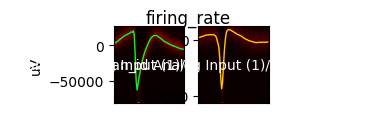

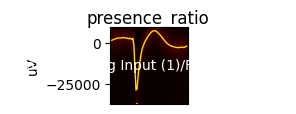

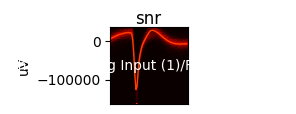

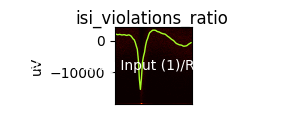

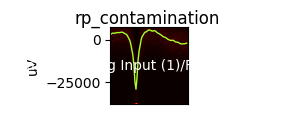

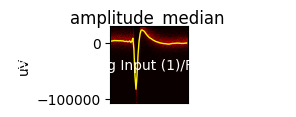

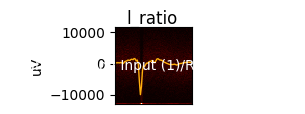

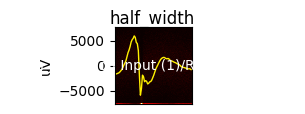

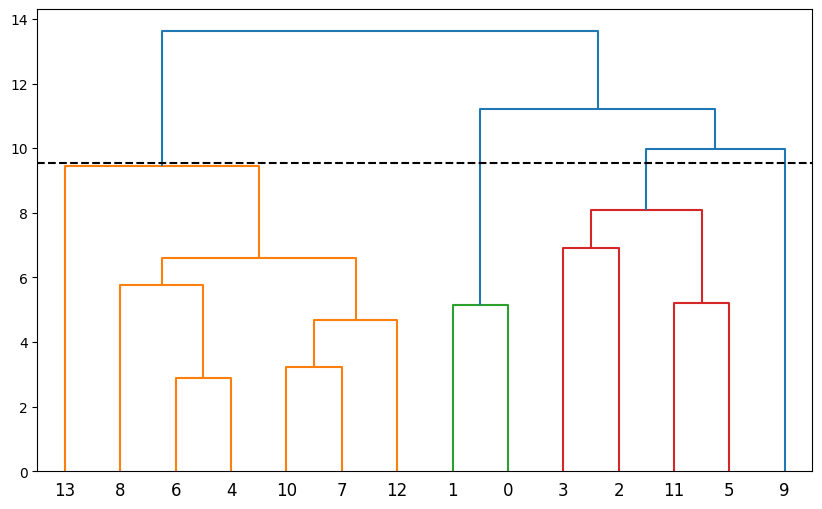

In [156]:
# efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
#                                  truncate=True)
# efe.remove_no_sa_rows()
# efe.compute_quality_metrics()
# efe.compute_template_metrics()
# efe.explode_dataframe()
# efe.compute_mds_wave_features()
# efe.convert_datatypes()
# efe.compute_clusters(threshold=0.5)
# efe1_df = efe.df_all_units.copy()

# si.set_global_job_kwargs(**constants.FAST_JOB_KWARGS)
efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
                                 truncate=True, **constants.FAST_JOB_KWARGS)
                                #  truncate=False, **constants.FAST_JOB_KWARGS)
efe.remove_no_sa_rows()
efe.compute_quality_metrics()
efe.compute_template_metrics()
efe.explode_dataframe()
efe.compute_mds_wave_features()
efe.convert_datatypes()
efe.remove_outliers(iqr_mult=3) # REVIEW this is the new row
efe.compute_clusters(threshold=0.7)
efe2_df = efe.df_all_units.copy()


# dftemp = efe.df_all_units.copy()
# display(dftemp.head())
# dftemp = efe.remove_no_sa_rows(in_place=False, df=dftemp)
# dftemp = efe.compute_quality_metrics(in_place=False, df=dftemp)
# dftemp = efe.compute_template_metrics(in_place=False, df=dftemp)
# dftemp = efe.explode_dataframe(in_place=False, df=dftemp)
# dftemp = efe.compute_mds_wave_features(in_place=False, df=dftemp)
# dftemp = efe.convert_NA_to_nan(in_place=False, df=dftemp) # will make col object if item is nan


In [157]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(efe2_df.head(3))

,id,region,best_depth,name,sa,n_units,unit,num_spikes,firing_rate,presence_ratio,snr,isi_violations_ratio,isi_violations_count,rp_contamination,rp_violations,sliding_rp_violation,amplitude_cutoff,amplitude_median,amplitude_cv_median,amplitude_cv_range,sync_spike_2,sync_spike_4,sync_spike_8,firing_range,sd_ratio,isolation_distance,l_ratio,d_prime,silhouette,nn_hit_rate,nn_miss_rate,peak_to_valley,peak_trough_ratio,half_width,repolarization_slope,recovery_slope,num_positive_peaks,num_negative_peaks,velocity_above,velocity_below,exp_decay,spread,waveform,mds_wave_0,mds_wave_1,mds_wave_2,mds_wave_3,reject,cluster
0,1236,ca1s,3.0,1236_Exp_6 half turn after turning_Day1 mornin...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,1,6863,3.800111,1.0,3.219539,2.147226,168,1.0,56,<NA>,0.001507,-15347.681641,0.326449,1.371383,0,0,0,6.4,1.378494,17.598993,1.310017,2.658556,0.078743,0.62925,0.07925,0.000496,-0.218107,0.00014,63017017.266276,-3876918.112198,1,1,<NA>,<NA>,1.988472,20,"[0.6168440848362194, 0.6172624767286481, 0.582...",-1.338396,0.690869,2.082348,-0.339304,True,NaN
1,1236,ca1s,3.0,1236_Exp_6 half turn after turning_Day1 mornin...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,2,1367,0.756921,1.0,1.44722,0.322151,1,0.0,0,<NA>,0.000388,-6258.942871,1.1729,2.196756,0,0,0,1.2,1.253163,30.366798,0.335437,3.024837,0.032245,0.457,0.20425,0.000356,-0.317036,0.0001,82414248.141825,-3626309.150565,1,1,<NA>,<NA>,0.202288,20,"[0.4497461196854904, 0.5331270032999288, 0.532...",-0.210129,0.956554,1.187555,5.361078,False,2.0
2,1236,ca1s,3.0,1236_Exp_6 half turn after turning_Day1 mornin...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,3,1235,0.683832,1.0,1.861342,0.0,0,0.0,0,<NA>,0.000672,-6535.297852,0.731341,1.355699,0,0,0,1.2,1.37709,30.392701,0.335498,3.08039,0.01652,0.461,0.20875,0.000716,-0.269926,0.000112,17820750.612906,-4222462.951573,2,1,<NA>,<NA>,1.818718,20,"[0.3983890998688765, 0.4383713920674854, 0.505...",-2.524087,0.689776,0.844274,-2.023729,False,2.0


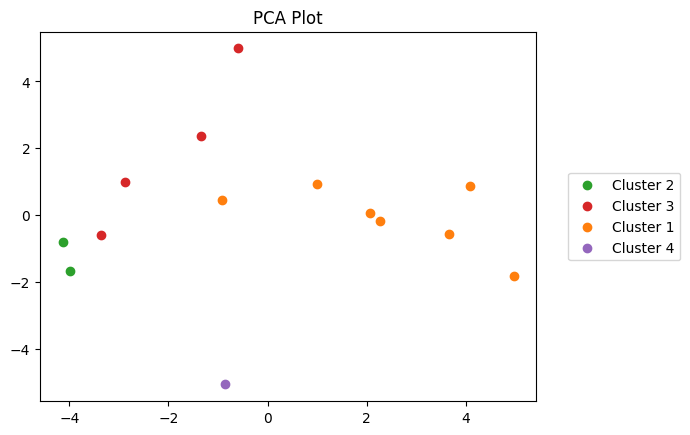

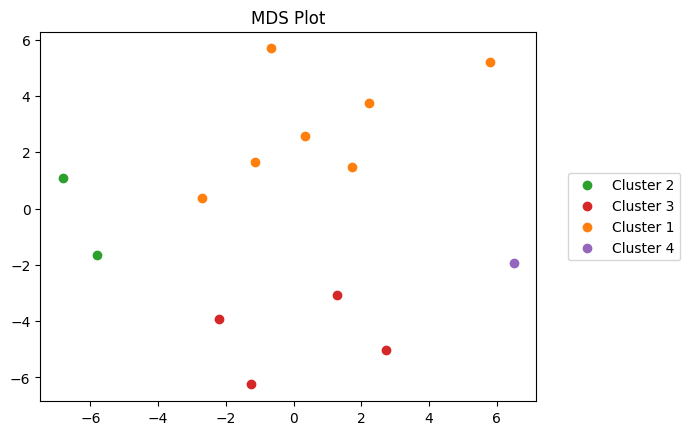

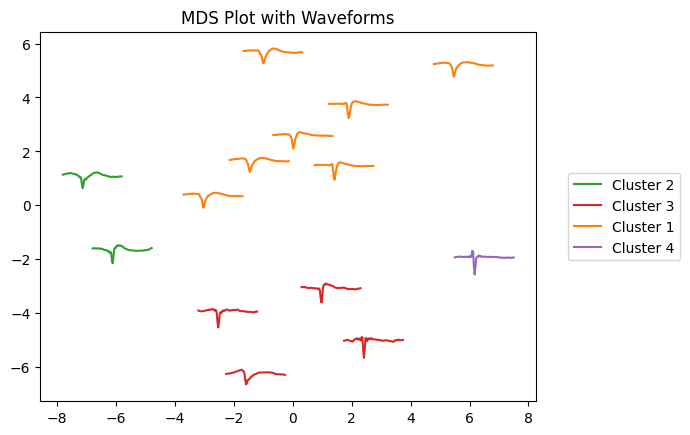

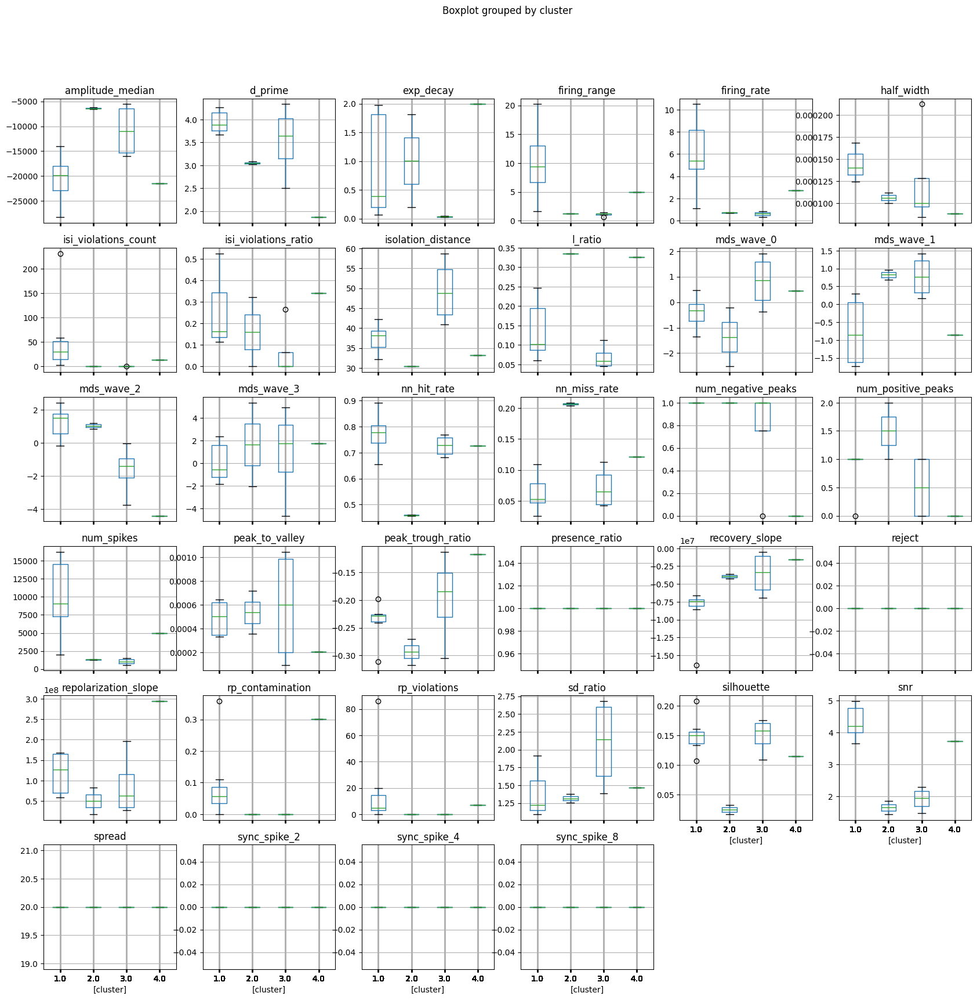

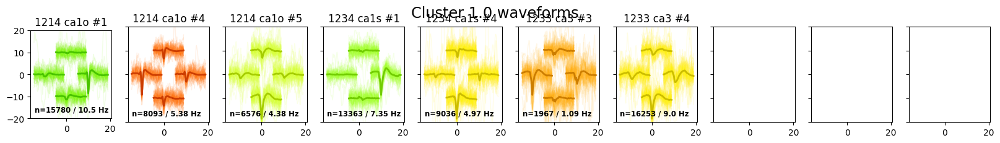

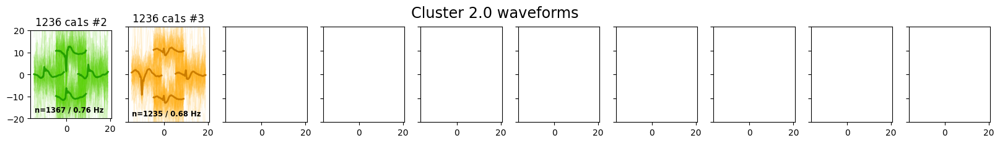

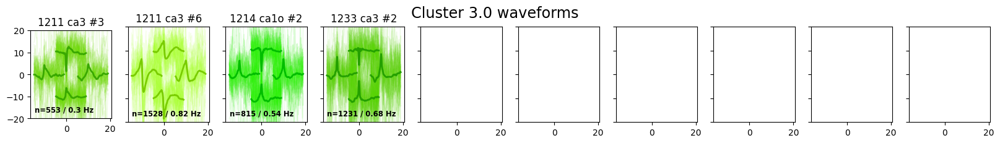

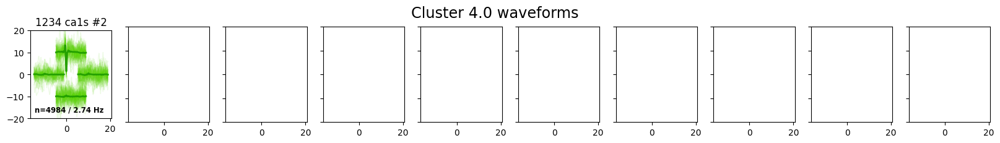

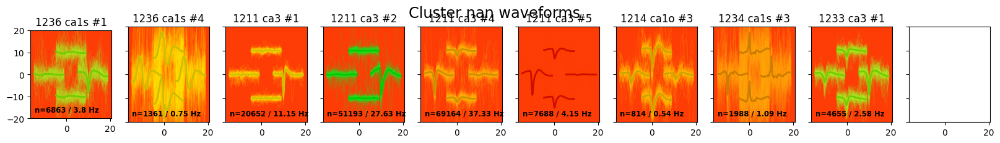

In [158]:
ep = ExperimentPlotter('/mnt/isilon/marsh_single_unit/MarshMountainSort', efe=efe, dsr=dsr)
# display(ep.df_all_units)
# display(efe.df_all_units)

ep.plot_pca()
rs = np.random.default_rng().integers(np.iinfo(np.uint32).max)
ep.plot_mds(random_state=rs)
ep.plot_mds_waveforms(random_state=rs)
ep.plot_feature_boxplots()
ep.plot_cluster_waveforms()

In [159]:
%%script true
dftemp2 = dftemp.copy()
dftemp2 = dftemp2.drop(ExperimentFeatureExtractor.BAD_FEATURES + ExperimentFeatureExtractor.TEMPLATE_METRIC_FEATURES, axis=1)
# display(dftemp2)
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     display(dftemp2)
dftemp2 = dftemp2.dropna(axis=0, subset=dftemp2.columns.difference(ExperimentFeatureExtractor.DO_NOT_EXPLODE_FEATURES))
dftemp2.info()

dftemp_pca = dftemp2.drop(ExperimentFeatureExtractor.UNIT_UNIQUE_FEATURES + ExperimentFeatureExtractor.DO_NOT_EXPLODE_FEATURES + ['unit'], axis=1, errors='ignore')
display(dftemp_pca.head())


dftemp_pca_std = StandardScaler().fit_transform(dftemp_pca)


In [160]:
%%script true
# REVIEW PCA TESTING
pca = PCA(n_components=20)
pca.fit_transform(dftemp_pca_std)
print(pca.explained_variance_ratio_.cumsum())

pca2 = PCA(n_components=2)
pcs = pca2.fit_transform(dftemp_pca_std)
# print(pcs.explained_variance_ratio_.cumsum())
pc1_vals = pcs[:, 0]
pc2_vals = pcs[:, 1]
plt.scatter(pc1_vals, pc2_vals)


In [161]:
%%script true
# REVIEW Another dendrogram, but clustering by RMS diff btwn max channels (instead of all quality metrics)
dftemp_wavelookup = dftemp2.copy()

def __temporary_series_sa_to_wave_func(s: pd.Series):
    sa: si.SortingAnalyzer = s['sa']
    unit = s['unit']
    ext_tmp: si.AnalyzerExtension = sa.get_extension('templates')
    
    # Kind of a hacky solution, unfortunately SA doesn't have a get_template function
    data = ext_tmp.get_data()
    extremum_ch = si.get_template_extremum_channel(sa, outputs='index')[unit]
    # print(data.shape) # units x samples x channels
    # print(extremum_ch)
    wave = data[unit - 1, :, extremum_ch]
    wave = (wave - wave.mean()) / wave.std() # NOTE standardizing the waveform. Maybe compare later if removing this makes clustering better

    return wave

dftemp_wavelookup['waveform'] = dftemp_wavelookup.apply(__temporary_series_sa_to_wave_func, axis=1)

# display(dftemp_wavelookup)
# __temporary_series_sa_to_wave_func(dftemp_wavelookup.iloc[3])

def __temporary_waveform_lookup_dist_func(idx1, idx2):
    # NOTE this might break if there are inconsistent f_s. Will need to interpolate waveforms if so
    if isinstance(idx1, np.ndarray):
        idx1 = int(idx1.item())
    if isinstance(idx2, np.ndarray):
        idx2 = int(idx2.item())
    wave1 = dftemp_wavelookup.iloc[idx1]['waveform']
    wave2 = dftemp_wavelookup.iloc[idx2]['waveform']
    return np.sqrt(np.sum((wave1 - wave2) ** 2))

dummy_X = np.arange(dftemp_wavelookup.index.size).reshape((-1, 1))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
clusters = shc.linkage(dummy_X, method='average', metric=__temporary_waveform_lookup_dist_func, optimal_ordering=True)
threshold = 0.5*max(clusters[:,2])
cluster_labels = shc.fcluster(Z=clusters, t=threshold, criterion='distance')

shc.dendrogram(Z=clusters, ax=ax, color_threshold=threshold)
ax.axhline(threshold, c='black', ls='--')
plt.show()
print(cluster_labels)


In [162]:
%%script true
X_waves = dftemp['waveform']
X_waves = np.array(X_waves.tolist())
# mds.stress_

dist_waves = euclidean_distances(X_waves)

stresses = []
for i in range(1, 10):
    mds = MDS(n_components=i, dissimilarity='precomputed')
    X_transform = mds.fit_transform(dist_waves)
    stresses.append(mds.stress_)
plt.plot(range(1, 10), stresses, marker='o')
plt.show()

# mds = MDS(n_components=2, dissimilarity='precomputed')
# X_transform = mds.fit_transform(dist_waves)

# plt.scatter(X_transform[:,0], X_transform[:,1])

(13, 4)


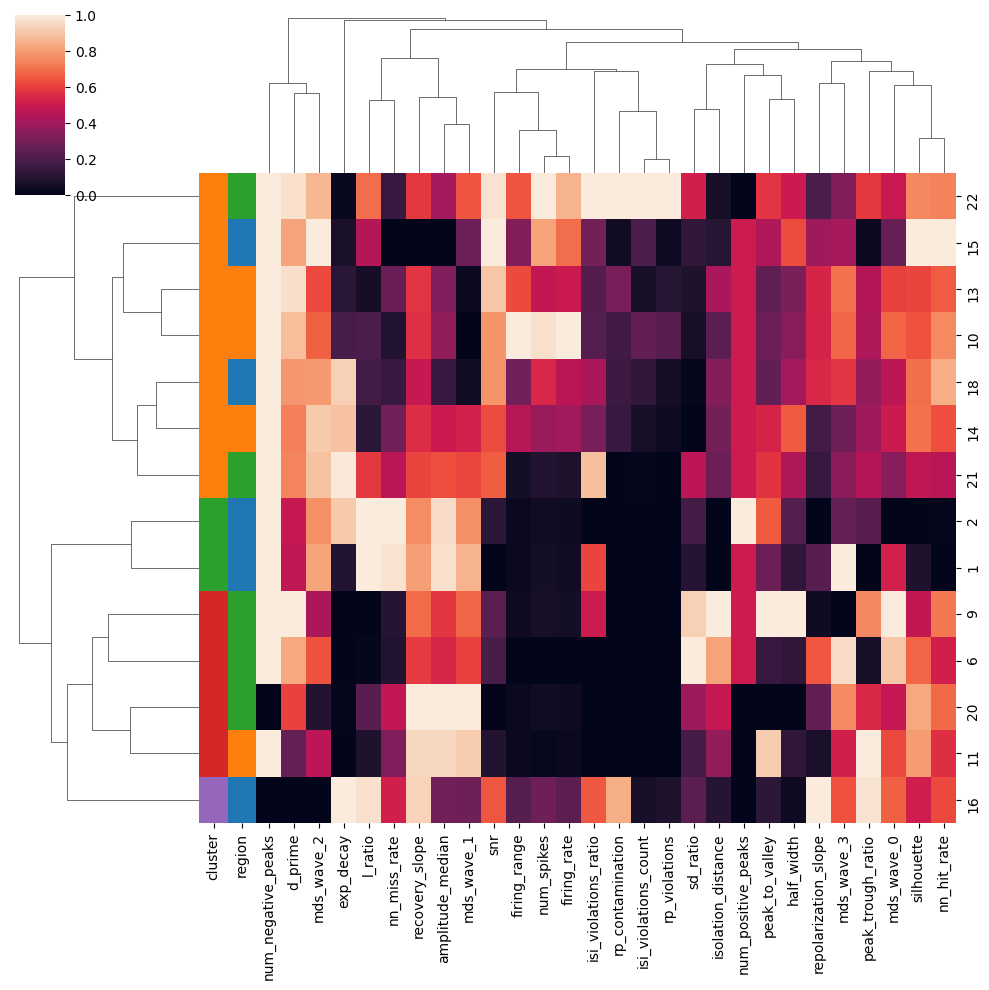

In [163]:
df = efe.get_df(drop_nan_rows=True, drop_unit_unique_cols=True)
# NOTE Necessary to  drop all zero variance columns, otherwise standard_scale breaks
keepcols = df.std() > 0.0
df = df.loc[:, keepcols.reindex(df.columns, axis=1, fill_value=False)]

# df = efe.get_df(drop_nan_rows=True, drop_unit_unique_cols=True, drop_extra_cols=['cluster'])
# df = df.loc[:, ['num_spikes', 'snr']]
# df = df.apply(pd, errors='coerce')
df = df.astype('float')
# display(df)
row_colors_1 = df['cluster'].apply(lambda x: f'C{int(x)}')
region_to_color = {'ca1s':'C0', 'ca1o':'C1', 'ca3':'C2', 'ca3o':'C3'}

row_colors_2 = efe.get_df(drop_nan_rows=True)['region'].apply(lambda x: region_to_color[x])

row_colors = pd.concat([row_colors_1, row_colors_2], axis=1)
# row_colors = [f'C{int(x)}' for x in df['cluster']]
# row_colors = pd.Series(row_colors, name='cluster')
print(efe.Z_linkage.shape)
# sns.clustermap(df, metric='euclidean', z_score=1)
# sns.clustermap(df, metric='euclidean', row_linkage=efe.Z_linkage)
# sns.clustermap(df, metric='euclidean', z_score=1, row_linkage=efe.Z_linkage, cmap='vlag', center=0)
# sns.clustermap(df, metric='euclidean', standard_scale=1, row_linkage=efe.Z_linkage)
sns.clustermap(df.drop('cluster', axis=1), standard_scale=1, row_linkage=efe.Z_linkage, row_colors=row_colors) # REVIEW this might be the final version?
# sns.clustermap(df.drop('cluster', axis=1), z_score=1, row_linkage=efe.Z_linkage, row_colors=row_colors, cmap='vlag', center=0, vmin=-3, vmax=3) # REVIEW this might be the final version?


# df_no_out = df[(np.abs(zscore(df)) < 3).all(axis=1)]
# keepcols = df_no_out.std() > 0.0
# df_no_out = df_no_out.loc[:, keepcols.reindex(df_no_out.columns, axis=1, fill_value=False)]
# print(df.index.size, df_no_out.index.size)
# sns.clustermap(df_no_out, metric='euclidean', z_score=1, cmap='vlag', center=0)


,id,region,best_depth,name,sa,n_units,unit,num_spikes,firing_rate,presence_ratio,snr,isi_violations_ratio,isi_violations_count,rp_contamination,rp_violations,amplitude_median,sync_spike_2,sync_spike_4,sync_spike_8,firing_range,sd_ratio,isolation_distance,l_ratio,d_prime,silhouette,nn_hit_rate,nn_miss_rate,peak_to_valley,peak_trough_ratio,half_width,repolarization_slope,recovery_slope,num_positive_peaks,num_negative_peaks,exp_decay,spread,waveform,mds_wave_0,mds_wave_1,mds_wave_2,mds_wave_3,reject,cluster,log_firing_rate,is_new_data,is_gcg,is_ca1
22,1233,ca3,3.0,1233_Bl6 WT_6 half turns_after turning_Day 1 m...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,4,16253,9.004432,1.0,4.896394,0.526139,231,0.357844,86,-19029.105469,0,0,0,13.2,1.915573,32.115899,0.246612,4.262429,0.160565,0.779,0.053083,0.000644,-0.197861,0.000148,72409384.12646,-7112948.121381,0,1,0.069194,20,"[0.21099033882032742, 0.23425712790696343, 0.2...",-0.332957,0.294065,1.492295,-1.363762,False,1.0,0.954456,False,False,False
15,1234,ca1s,3.0,1234_Bl6 WT_6 half turns_after recovery_Day 2 ...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,1,13363,7.35443,1.0,4.979893,0.156021,46,0.015381,3,-28263.326172,0,0,0,6.98,1.299869,33.344975,0.174543,3.887691,0.208242,0.8925,0.026,0.000504,-0.310973,0.000164,126435487.651912,-16364083.606681,1,1,0.161092,20,"[0.3131688581746183, 0.33240094171843615, 0.38...",-1.350043,-0.865008,2.423201,-0.526995,False,1.0,0.866549,False,False,False
14,1214,ca1o,2.5,<NA>,SortingAnalyzer: 4 channels - 5 units - 1 segm...,5,5,6576,4.37525,1.0,3.66201,0.162197,14,0.05357,3,-16918.109375,0,0,0,9.42,1.092789,38.88119,0.079199,3.67215,0.151111,0.73175,0.08005,0.0006,-0.235933,0.000168,66811319.523194,-7553713.036254,1,1,1.778331,20,"[0.21837501510868515, 0.23925413619980795, 0.2...",-0.307123,-0.093804,1.812545,-1.850237,False,1.0,0.641003,False,False,True
2,1236,ca1s,3.0,1236_Exp_6 half turn after turning_Day1 mornin...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,3,1235,0.683832,1.0,1.861342,0.0,0,0.0,0,-6535.297852,0,0,0,1.2,1.37709,30.392701,0.335498,3.08039,0.01652,0.461,0.20875,0.000716,-0.269926,0.000112,17820750.612906,-4222462.951573,2,1,1.818718,20,"[0.3983890998688765, 0.4383713920674854, 0.505...",-2.524087,0.689776,0.844274,-2.023729,False,2.0,-0.165051,False,True,False
21,1233,ca3,3.0,1233_Bl6 WT_6 half turns_after turning_Day 1 m...,SortingAnalyzer: 4 channels - 4 units - 1 segm...,4,3,1967,1.089751,1.0,3.791977,0.466518,3,0.0,0,-13984.37793,0,0,0,1.6,1.828596,38.20051,0.214516,3.70059,0.106907,0.656,0.109167,0.00064,-0.225751,0.00014,58451716.127145,-6656398.918498,1,1,1.979901,20,"[0.2812434761535871, 0.3825348012098096, 0.422...",-1.008076,0.199338,1.692618,-1.08509,False,1.0,0.037327,False,False,False


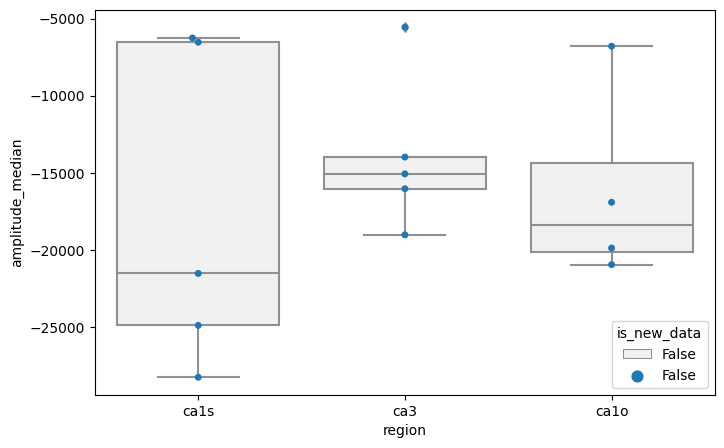

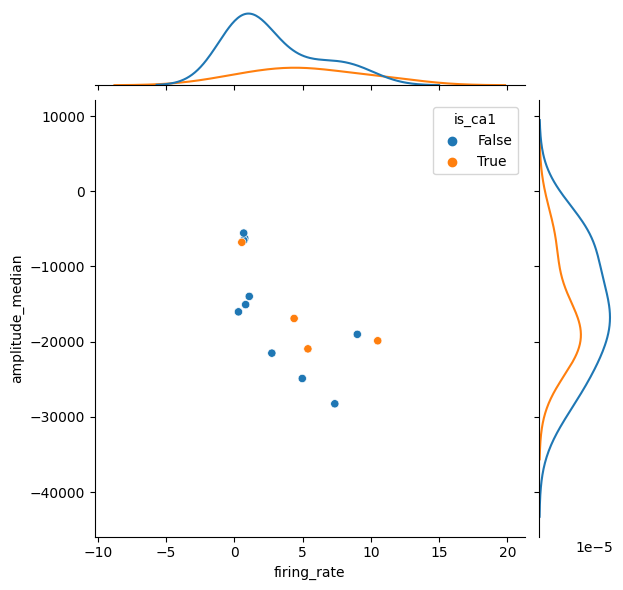

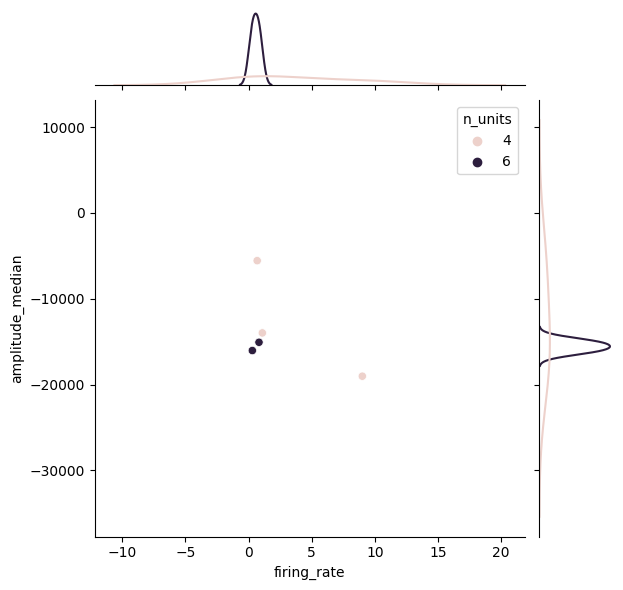

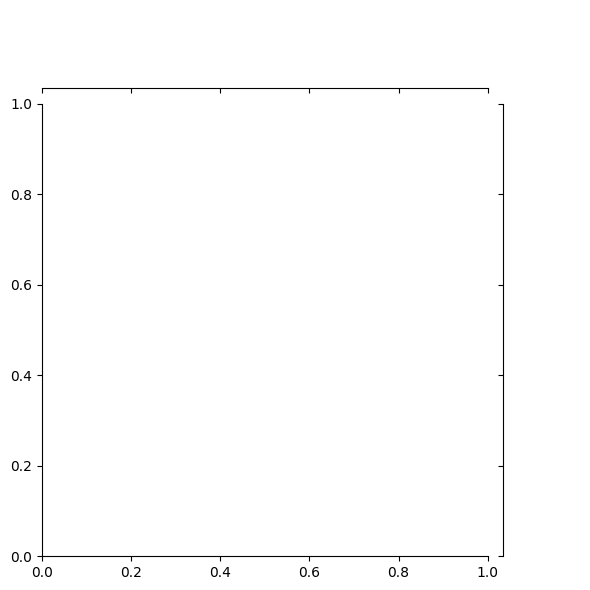

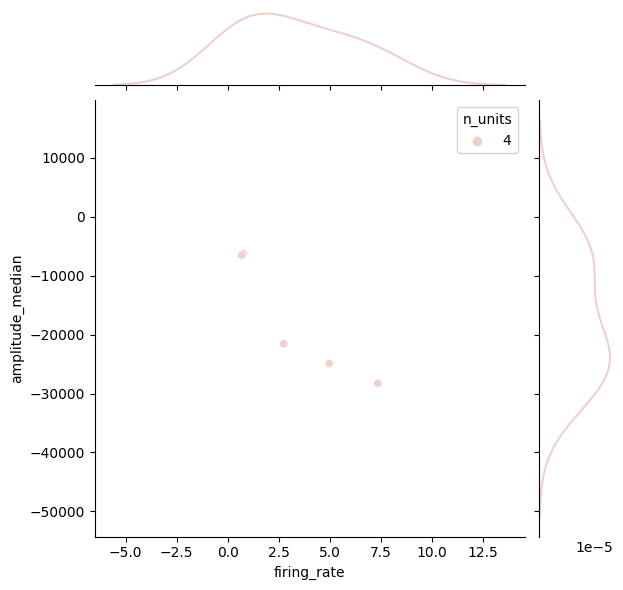

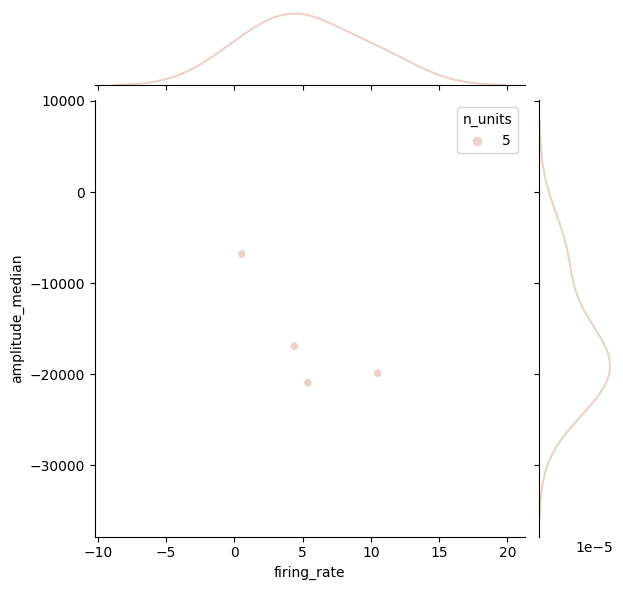

In [164]:
df = efe.get_df(drop_nan_rows=True)

df = df.assign(log_firing_rate=np.log10(df['firing_rate'], dtype=np.float32))


# aggregate from small n into big N and do the same plots
# df = df.drop(['name', 'sa'], axis=1)
# df = df.groupby(['id', 'region']).mean().reset_index() # NOTE this converts from small n to big N

df = df.assign(is_new_data=(df['id'] < 600))
df = df.assign(is_gcg=(df['id'].isin([1185, 1236, 1238, 1269]))) # NOTE really hacky but works for now
df = df.assign(is_ca1=(df['region'].isin(['ca1', 'ca1o']))) # NOTE really hacky but works for now

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df.sample(5))


fig, ax = plt.subplots(figsize=(8, 5))
# firing_rate, log_firing_rate, half_width, repolarization_slope, recovery_slope, peak_to_valley, region, n_units, is_gcg, is_new_data
tempfeat = 'amplitude_median'
sns.boxplot(data=df, x='region', hue='is_new_data', y=tempfeat, ax=ax, color='white')
sns.swarmplot(data=df, x='region', hue='is_new_data', y=tempfeat, ax=ax, dodge=True)
plt.show()

g = sns.JointGrid(data=df, x='firing_rate', y=tempfeat, hue='is_ca1')
g.plot_joint(sns.scatterplot)
g.plot_marginals(sns.kdeplot)



for region in constants.REGIONS:
    df_plot = df.loc[df['region'] == region]
    # g = sns.JointGrid(data=df_plot, x='repolarization_slope', y='recovery_slope', hue='n_units')
    g = sns.JointGrid(data=df_plot, x='firing_rate', y=tempfeat, hue='n_units')
    # g = sns.JointGrid(data=df, x='mds_wave_1', y='mds_wave_2', hue='n_units')
    
    g.plot_joint(sns.scatterplot)
    # g.plot_joint(sns.kdeplot)
    g.plot_marginals(sns.kdeplot)
    # g.plot_marginals(sns.histplot)

In [165]:
raise Exception("Firewall")

Exception: Firewall

[1 2]


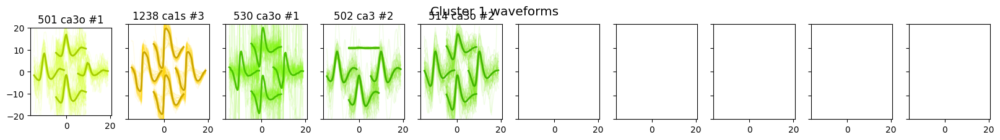

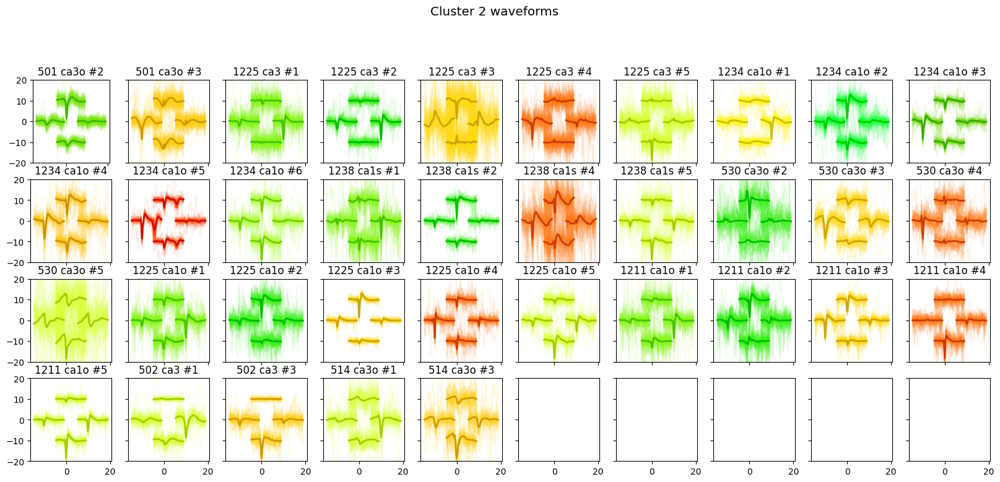

""


In [74]:
def __df_cluster_groupby_func(df: pd.DataFrame):
    n = df.index.size
    n_col = 10
    n_row = n // n_col + 1
    fig, axes = plt.subplots(n_row, n_col, figsize=(n_col*2, n_row*2), sharex=True, sharey=True, squeeze=False)
    axes[0,0].set_aspect('equal')
    axes[0,0].set_ylim(-20, 20)
    for i, (index, row) in enumerate(df.iterrows()):
        ax = axes[i // n_col, i % n_col]
        sa: si.SortingAnalyzer = row['sa']
        # break
        sw.plot_unit_waveforms(sa,
                                unit_ids=[row['unit']],
                                templates_percentile_shading=None,
                                alpha_waveforms=0.1,
                                set_title=False,
                                scale=1e16,
                                same_axis=True,
                                plot_legend=False,
                                ax=ax)
        ax.set_title(f"{row['id']} {row['region']} #{row['unit']}")

        # if i == 20:
        #     break

    fig.suptitle(f"Cluster {df.name} waveforms", y=1.03, fontsize='x-large')
    plt.show()


dftemp_clusts = dftemp2.assign(cluster = dftemp['cluster'])
# display(dftemp_clusts[['id', 'region', 'sa', 'cluster']])
print(dftemp_clusts['cluster'].unique())
dftemp_clusts.groupby('cluster').apply(__df_cluster_groupby_func)



In [75]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(dftemp_clusts.groupby(['cluster']).mean())

/tmp/ipykernel_3600435/3762106656.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  display(dftemp_clusts.groupby(['cluster']).mean())


,id,best_depth,n_units,unit,num_spikes,firing_rate,presence_ratio,snr,isi_violations_ratio,isi_violations_count,rp_contamination,rp_violations,amplitude_median,sync_spike_2,sync_spike_4,sync_spike_8,firing_range,sd_ratio,isolation_distance,l_ratio,d_prime,silhouette,nn_hit_rate,nn_miss_rate,mds_wave_0,mds_wave_1,mds_wave_2,mds_wave_3
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,657.0,6.35,3.8,1.8,48066.6,7.171515,0.961137,11.994633,5.789715,5597.8,0.72999,1333.2,-128.287445,0.001546,0.0,0.0,35.236,5.133608,28.239658,0.919929,3.911219,0.100964,0.833842,0.023312,3.728903,-6.027599,6.590631,5.401661
2,1023.285714,4.35,4.828571,3.0,20255.628571,13.536118,1.0,5.69101,1.282393,583.628571,0.335669,129.4,-52.438122,0.000017,0.0,0.0,16.676857,1.489954,44.258715,0.338778,3.430384,0.104503,0.694364,0.088919,-0.5327,0.861086,-0.941519,-0.771666


Index(['amplitude_median', 'cluster', 'd_prime', 'firing_range', 'firing_rate',
       'isi_violations_count', 'isi_violations_ratio', 'isolation_distance',
       'l_ratio', 'mds_wave_0', 'mds_wave_1', 'mds_wave_2', 'mds_wave_3',
       'nn_hit_rate', 'nn_miss_rate', 'num_spikes', 'presence_ratio',
       'rp_contamination', 'rp_violations', 'sd_ratio', 'silhouette', 'snr',
       'sync_spike_2', 'sync_spike_4', 'sync_spike_8'],
      dtype='object')

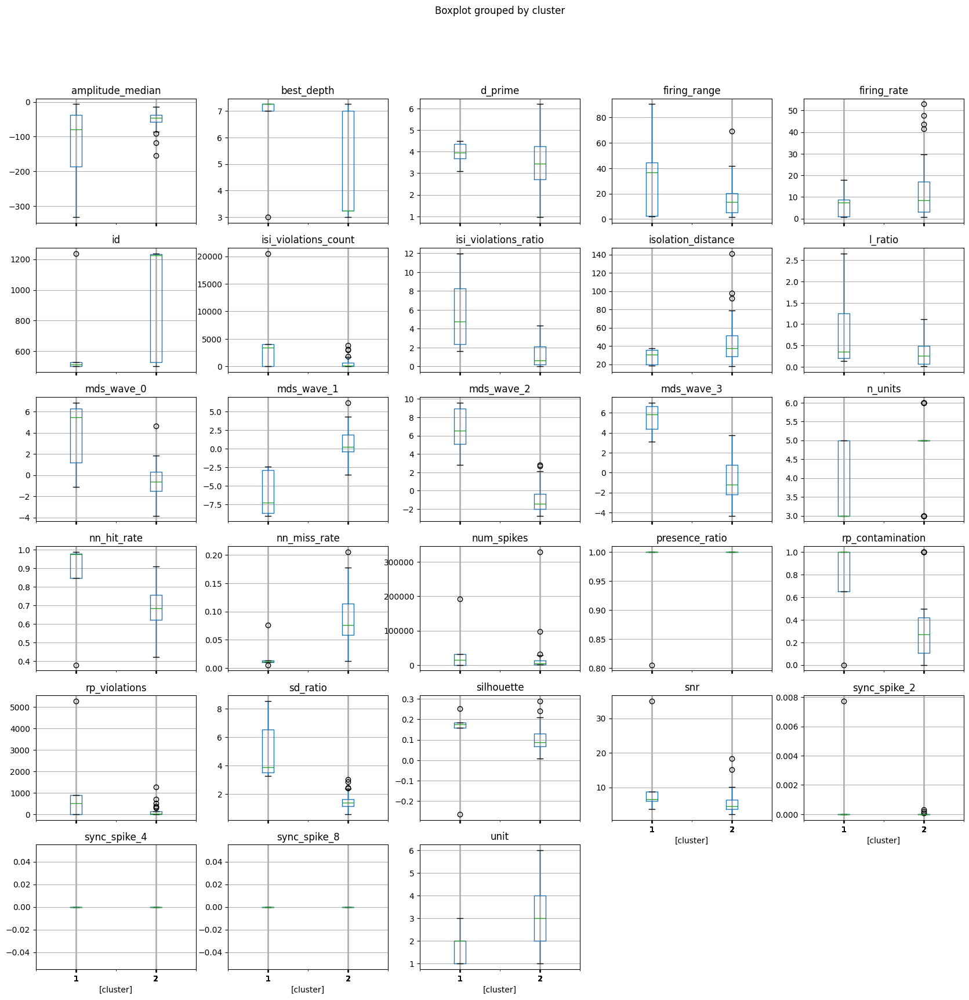

In [76]:
# dftemp_clust_mean = dftemp_clusts.groupby(['cluster'])
# display(dftemp_clust_mean)
# dftemp_clusts.groupby(['cluster']).plot(kind='box', x='cluster', logy=True, rot=90)
tempcols = display(dftemp_clusts.columns.difference(ExperimentFeatureExtractor.DO_NOT_EXPLODE_FEATURES + ['unit']))
dftemp_clusts.boxplot(column=tempcols, by='cluster', **{'sharey':False, 'figsize':(20, 20)})
plt.show()

In [77]:
%%script true
for col in dftemp2.columns:
    if col not in efe.DO_NOT_EXPLODE_FEATURES:
        series = dftemp2[col]
        series = series.replace(['<NA>'], np.nan)
        
        fig, ax = plt.subplots(1, 1, figsize=(3, 1))
        series.dropna().hist(ax=ax)
        ax.set_title(col)
        plt.show()
        # print(series)

## Read in Optimal Depths

In [3]:
# # Get dictionary of series identifiers to optimal depth recording from .XLSX file
# df = pd.read_excel(base_folder_path / excel_optimals_name, optimals_sheet_name)
# df['Series'] = df.apply(lambda row: f"{row['ID']}-{row['Genotype']}-{row['Region']}", axis=1)
# df = df.set_index('Series')
# display(df.head())
# series_dict = df.to_dict()['Filename']
# df_opts = df

# # Get dictionary of filename to depth from .XLSX file
# df = pd.read_excel(base_folder_path / excel_fnametodepths_name, fnametodepths_sheet_name)
# fname_dict = df.set_index('Filename').to_dict()['Halfturns']
# depths = list(set(fname_dict.values()))
# depths.sort()
# depths_dict = dict(zip(depths, np.arange(len(depths))))

# print(depths)


,ID,Genotype,Region,Naive Optimal Depth,Filename,Cortex Optimal Depth
Series,,,,,,
1133-WT-ca1o,1133,WT,ca1o,5.50,1133_WT_5 half turns + 1-4th of full turn_righ...,NaN
1133-WT-ca1s,1133,WT,ca1s,0.00,NaN,NaN
1133-WT-ca3,1133,WT,ca3,5.50,1133_WT_5 half turns + 1-4th of full turn_righ...,NaN
1176-WT-ca1o,1176,WT,ca1o,6.25,1176_WT Bl6_6 half turns + 1-8th of full turn_...,NaN
1176-WT-ca1s,1176,WT,ca1s,0.00,NaN,NaN


[0.0, 1.0, 2.0, 3.0, 3.5, 4.0, 4.5, 4.75, 5.0, 5.25, 5.5, 5.75, 6.0, 6.25, 6.5, 6.75, 7.0, 7.5]


## Load Saved Recordings and Sortings

In [4]:
# Load in sortings, generate a dataframe for the waveform extractors
# for i, series in enumerate(series_dict.keys()):

#     if series_dict[series] is np.nan:
#         print(f"Invalid spikes for {series}, skipping..")
#         continue

#     print(f"Loading {series} ({i+1}/{len(series_dict)})..")
#     series_split = series.split('-')
#     region = series_split[2]
#     series_opt = series_dict[series]
#     series_opt_depth = fname_dict[series_opt]
#     sort_folder_name = f"{series_opt}_{region}"

#     recording = si.load_extractor(sort_folder_path / sort_folder_name / f"{sort_folder_name}{recording_suffix}")
#     sorting = se.NpzSortingExtractor(sort_folder_path / sort_folder_name / f"{sort_folder_name}{sorting_suffix}")
    
#     n_chan = recording.get_property('gain_to_uV').shape
#     recording.set_property('offset_to_uV', np.full(n_chan, 0))
    
#     we = si.extract_waveforms(recording=recording,
#                               sorting=sorting, 
#                               folder=sort_folder_path / sort_folder_name / f"{sort_folder_name}{waveform_suffix}", 
#                               sparse=False, 
#                               overwrite=True,
#                               max_spikes_per_unit=None,
#                               allow_unfiltered=True)
    
#     df_opts.loc[series, 'Waveforms'] = we
#     df_opts.loc[series, 'Units'] = sorting.get_num_units()

# df_opts = df_opts.drop('Cortex Optimal Depth', axis=1)


Loading 1133-WT-ca1o (1/57)..


extract waveforms memmap multi buffer: 100%|#######| 1840/1840 [00:06<00:00, 300.33it/s]


Invalid spikes for 1133-WT-ca1s, skipping..
Loading 1133-WT-ca3 (3/57)..


extract waveforms memmap multi buffer: 100%|#########| 568/568 [00:03<00:00, 187.68it/s]


Loading 1176-WT-ca1o (4/57)..


extract waveforms memmap multi buffer: 100%|##########| 364/364 [00:07<00:00, 48.74it/s]


Invalid spikes for 1176-WT-ca1s, skipping..
Loading 1176-WT-ca3 (6/57)..


extract waveforms memmap multi buffer: 100%|#######| 1513/1513 [00:03<00:00, 464.10it/s]


Invalid spikes for 1177-WT-ca1o, skipping..
Invalid spikes for 1177-WT-ca1s, skipping..
Invalid spikes for 1177-WT-ca3, skipping..
Invalid spikes for 1178-WT-ca1o, skipping..
Loading 1178-WT-ca1s (11/57)..


extract waveforms memmap multi buffer: 100%|#######| 1408/1408 [00:08<00:00, 171.85it/s]


Invalid spikes for 1178-WT-ca3, skipping..
Invalid spikes for 1185-Exp-ca1o, skipping..
Invalid spikes for 1185-Exp-ca1s, skipping..
Invalid spikes for 1185-Exp-ca3, skipping..
Loading 1203-WT-ca1o (16/57)..


extract waveforms memmap multi buffer: 100%|#######| 1311/1311 [00:01<00:00, 829.77it/s]


Invalid spikes for 1203-WT-ca1s, skipping..
Invalid spikes for 1203-WT-ca3, skipping..
Loading 1211-WT-ca1o (19/57)..


extract waveforms memmap multi buffer: 100%|########| 1835/1835 [00:45<00:00, 39.92it/s]


Loading 1211-WT-ca1s (20/57)..


extract waveforms memmap multi buffer: 100%|#######| 1874/1874 [00:16<00:00, 111.96it/s]


Loading 1211-WT-ca3 (21/57)..


extract waveforms memmap multi buffer: 100%|#######| 1835/1835 [00:13<00:00, 136.62it/s]


Invalid spikes for 1214-WT-ca1o, skipping..
Invalid spikes for 1214-WT-ca1s, skipping..
Invalid spikes for 1214-WT-ca3, skipping..
Loading 1225-WT-ca1o (25/57)..


extract waveforms memmap multi buffer: 100%|########| 1200/1200 [00:15<00:00, 77.84it/s]


Loading 1225-WT-ca1s (26/57)..


extract waveforms memmap multi buffer: 100%|#######| 1407/1407 [00:04<00:00, 325.91it/s]


Loading 1225-WT-ca3 (27/57)..


extract waveforms memmap multi buffer: 100%|#######| 1200/1200 [00:05<00:00, 219.41it/s]


Loading 1226-WT-ca1o (28/57)..


extract waveforms memmap multi buffer: 100%|######| 1800/1800 [00:01<00:00, 1151.72it/s]


Loading 1226-WT-ca1s (29/57)..


extract waveforms memmap multi buffer: 100%|#######| 1801/1801 [00:16<00:00, 106.25it/s]


Loading 1226-WT-ca3 (30/57)..


extract waveforms memmap multi buffer: 100%|#######| 1815/1815 [00:13<00:00, 139.44it/s]


Loading 1227-WT-ca1o (31/57)..


extract waveforms memmap multi buffer: 100%|#######| 1801/1801 [00:14<00:00, 122.77it/s]


Loading 1227-WT-ca1s (32/57)..


extract waveforms memmap multi buffer: 100%|#######| 1801/1801 [00:06<00:00, 298.81it/s]


Invalid spikes for 1227-WT-ca3, skipping..
Invalid spikes for 1231-WT-ca1o, skipping..
Loading 1231-WT-ca1s (35/57)..


extract waveforms memmap multi buffer: 100%|#####| 1890/1890 [00:00<00:00, 11959.68it/s]


Loading 1231-WT-ca3 (36/57)..


extract waveforms memmap multi buffer: 100%|######| 1890/1890 [00:00<00:00, 2547.93it/s]


Loading 1233-WT-ca1o (37/57)..


extract waveforms memmap multi buffer: 100%|######| 1805/1805 [00:00<00:00, 7317.86it/s]


Invalid spikes for 1233-WT-ca1s, skipping..
Loading 1233-WT-ca3 (39/57)..


extract waveforms memmap multi buffer: 100%|#######| 1805/1805 [00:02<00:00, 734.23it/s]


Loading 1234-WT-ca1o (40/57)..


extract waveforms memmap multi buffer: 100%|########| 1806/1806 [00:53<00:00, 33.58it/s]


Loading 1234-WT-ca1s (41/57)..


extract waveforms memmap multi buffer: 100%|#######| 1802/1802 [00:04<00:00, 446.66it/s]


Loading 1234-WT-ca3 (42/57)..


extract waveforms memmap multi buffer: 100%|#######| 1802/1802 [00:06<00:00, 271.00it/s]


Loading 1236-Exp-ca1o (43/57)..


extract waveforms memmap multi buffer: 100%|######| 1806/1806 [00:00<00:00, 2439.48it/s]


Invalid spikes for 1236-Exp-ca1s, skipping..
Loading 1236-Exp-ca3 (45/57)..


extract waveforms memmap multi buffer: 100%|#######| 1806/1806 [00:17<00:00, 102.43it/s]


Loading 1238-Exp-ca1o (46/57)..


extract waveforms memmap multi buffer: 100%|######| 1808/1808 [00:01<00:00, 1667.24it/s]


Loading 1238-Exp-ca1s (47/57)..


extract waveforms memmap multi buffer: 100%|########| 1804/1804 [00:19<00:00, 94.59it/s]


Invalid spikes for 1238-Exp-ca3, skipping..
Invalid spikes for 1244-WT-ca1o, skipping..
Invalid spikes for 1244-WT-ca1s, skipping..
Invalid spikes for 1244-WT-ca3, skipping..
Loading 1269-Exp-ca1o (52/57)..


extract waveforms memmap multi buffer: 100%|#######| 1999/1999 [00:08<00:00, 244.10it/s]


Loading 1269-Exp-ca1s (53/57)..


extract waveforms memmap multi buffer: 100%|#######| 1999/1999 [00:15<00:00, 131.82it/s]


Invalid spikes for 1269-Exp-ca3, skipping..
Invalid spikes for 766-WT-ca1o, skipping..
Invalid spikes for 766-WT-ca1s, skipping..
Invalid spikes for 766-WT-ca3, skipping..


In [5]:
# wavetest = si.WaveformExtractor(recording, sorting)
# wavetest.sorting.get_num_units()

# Build larger dataframe with individual units
# df_opts_valid = df_opts[df_opts['Filename'].notna()]
# df_units = pd.DataFrame(columns=df_opts_valid.columns)

# for idx, row in df_opts_valid.iterrows():

#     n_units = int(row['Waveforms'].sorting.get_num_units())
    
#     for j in range(n_units):
#         df_units.loc[f"{idx}-{j+1}"] = row
#         # df_units.loc[f"{idx}-{j+1}", 'N_units'] = n_units

# display(df_units.head())
# display(df_opts_valid.head())


,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0


,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units
Series,,,,,,,
1133-WT-ca1o,1133,WT,ca1o,5.50,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0
1133-WT-ca3,1133,WT,ca3,5.50,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0
1176-WT-ca1o,1176,WT,ca1o,6.25,1176_WT Bl6_6 half turns + 1-8th of full turn_...,WaveformExtractor: 4 channels - 5 units - 1 se...,5.0
1176-WT-ca3,1176,WT,ca3,5.00,1176_WT Bl6_5 half turns_after turning_02-1-17,WaveformExtractor: 4 channels - 2 units - 1 se...,2.0
1178-WT-ca1s,1178,WT,ca1s,6.00,1178_WT Bl6_6 half turns_after turning_02-14-17,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0


## Calculate Spike Statistics

extract amplitudes: 100%|#########################| 1840/1840 [00:01<00:00, 1489.27it/s]


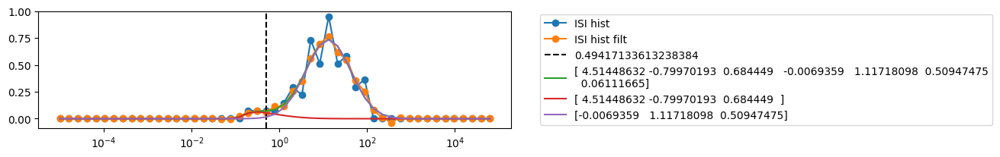

extract amplitudes: 100%|########################| 1840/1840 [00:00<00:00, 13971.65it/s]


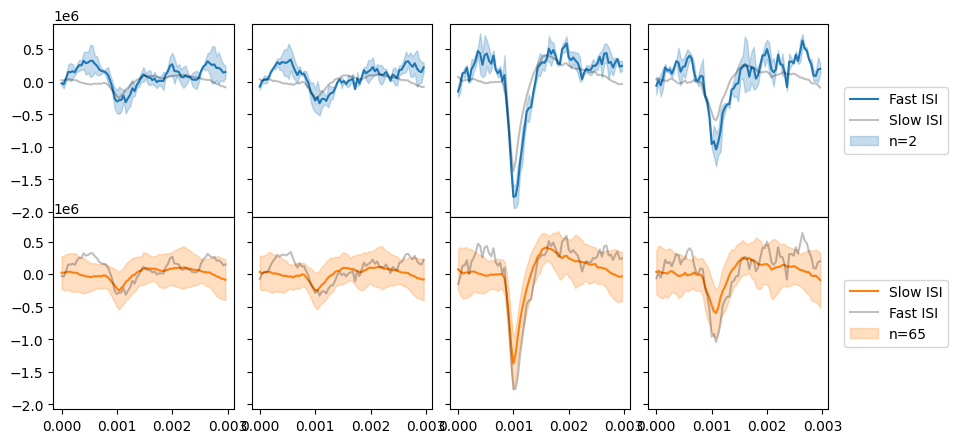

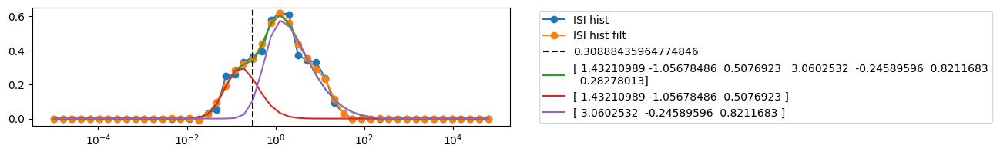

extract amplitudes: 100%|########################| 1840/1840 [00:00<00:00, 14133.33it/s]


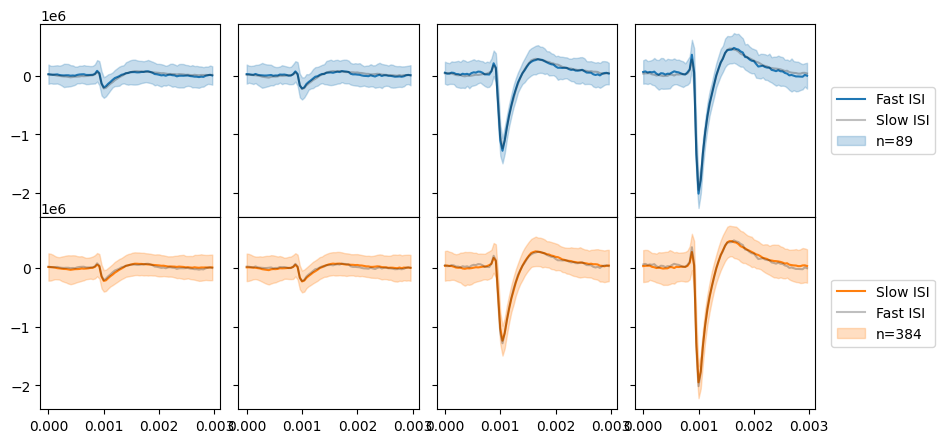

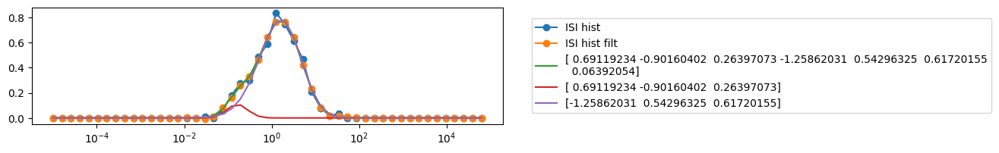

extract amplitudes: 100%|###########################| 568/568 [00:00<00:00, 1307.80it/s]


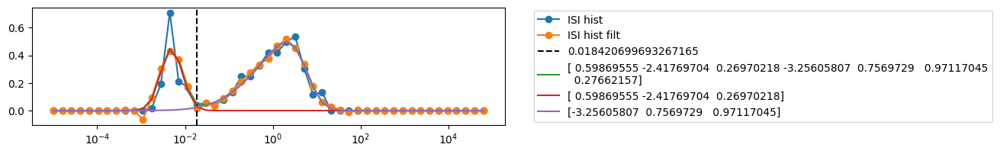

extract amplitudes: 100%|###########################| 568/568 [00:00<00:00, 8285.62it/s]


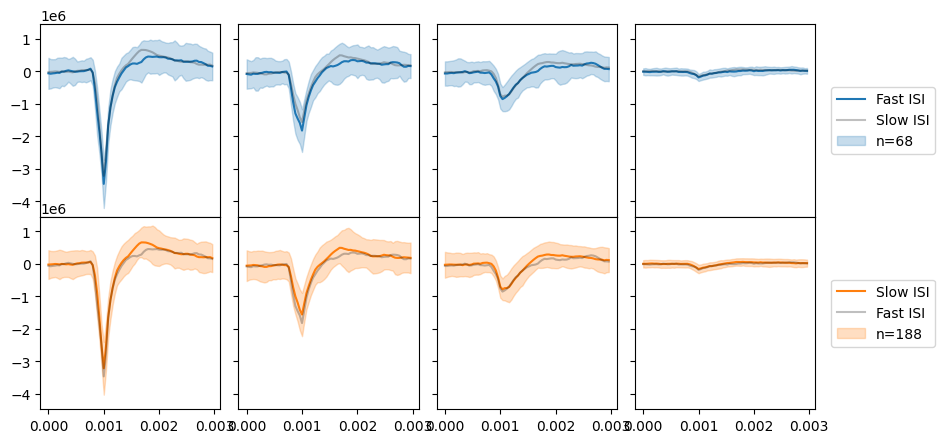

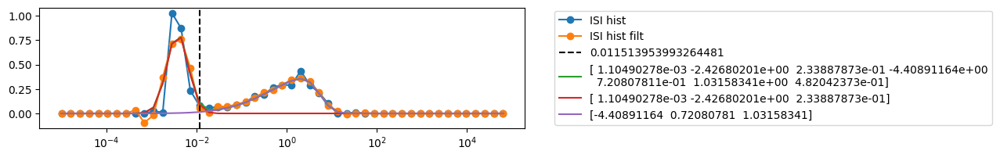

extract amplitudes: 100%|##########################| 568/568 [00:00<00:00, 10305.99it/s]


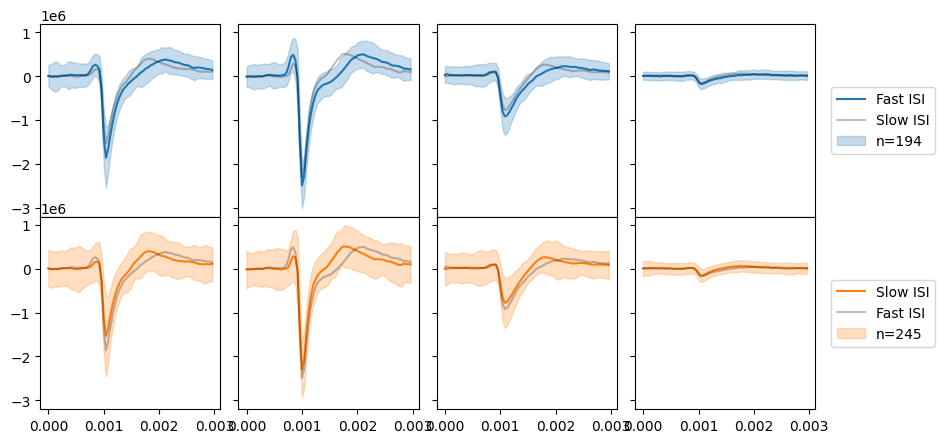

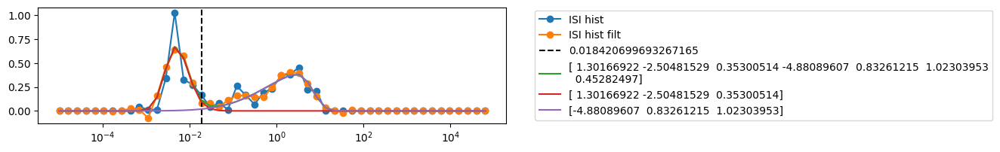

extract amplitudes: 100%|############################| 364/364 [00:00<00:00, 559.23it/s]


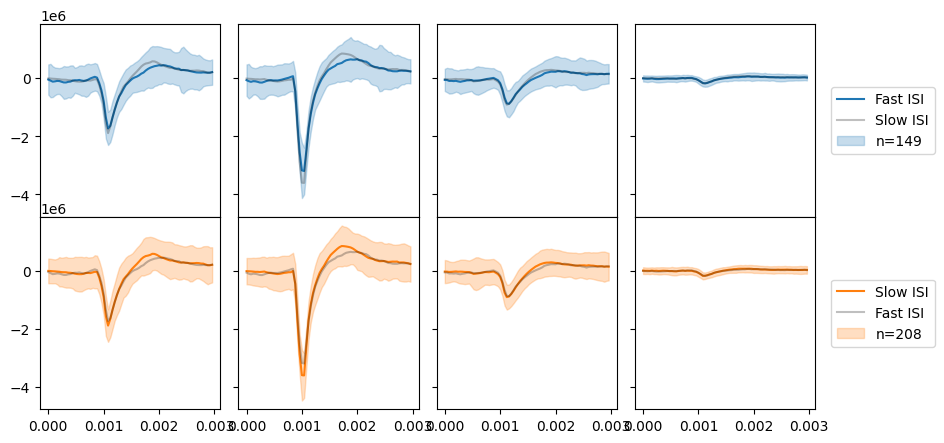

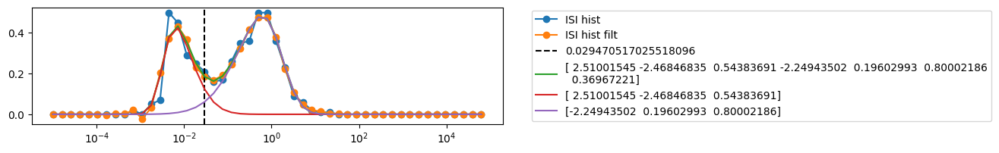

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2688.66it/s]


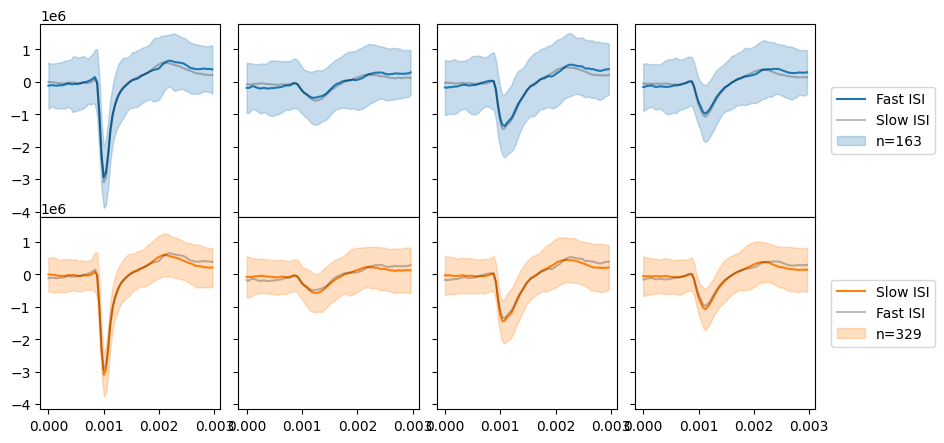

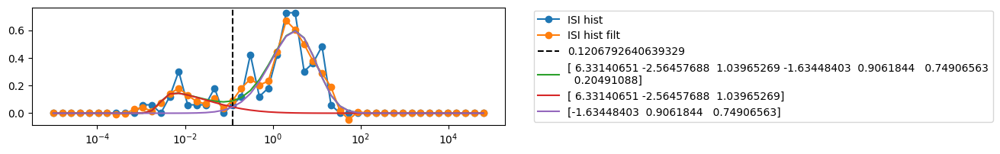

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2768.30it/s]


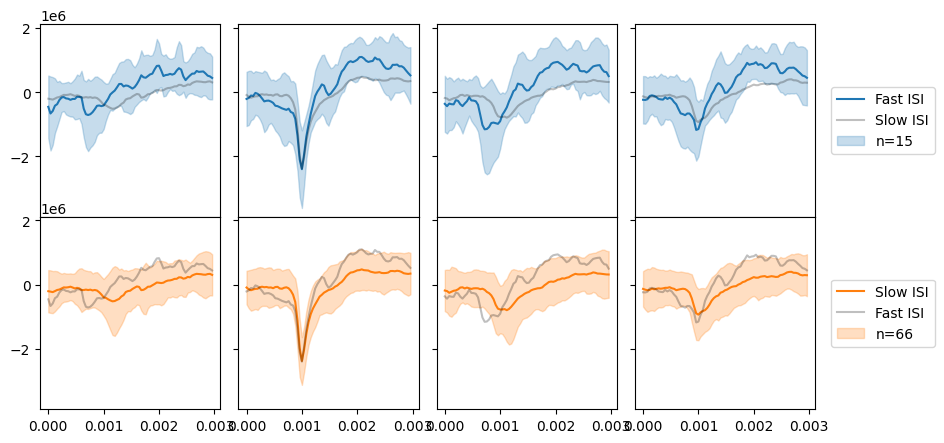

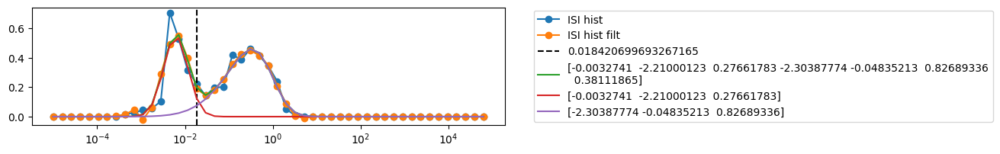

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2715.53it/s]


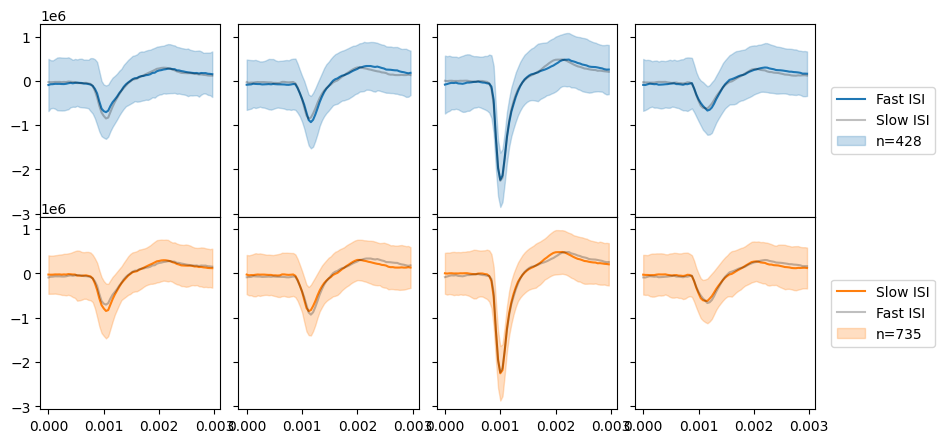

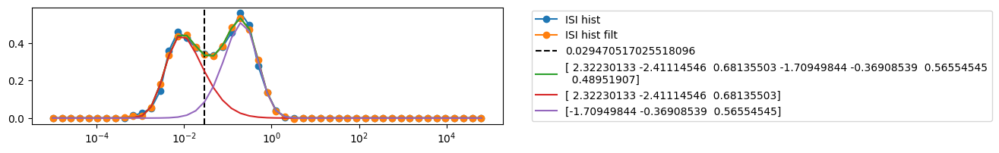

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2843.80it/s]


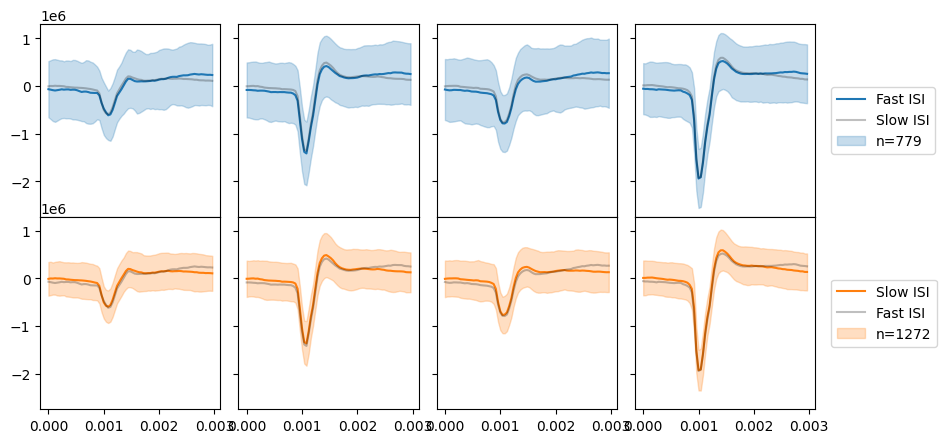

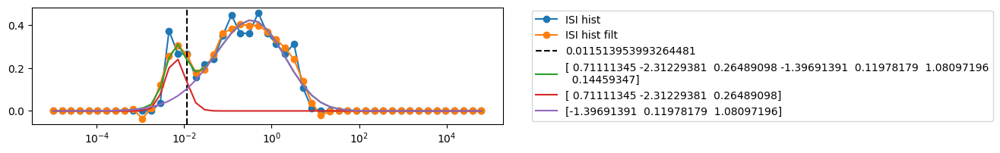

extract amplitudes: 100%|#########################| 1513/1513 [00:00<00:00, 2380.74it/s]


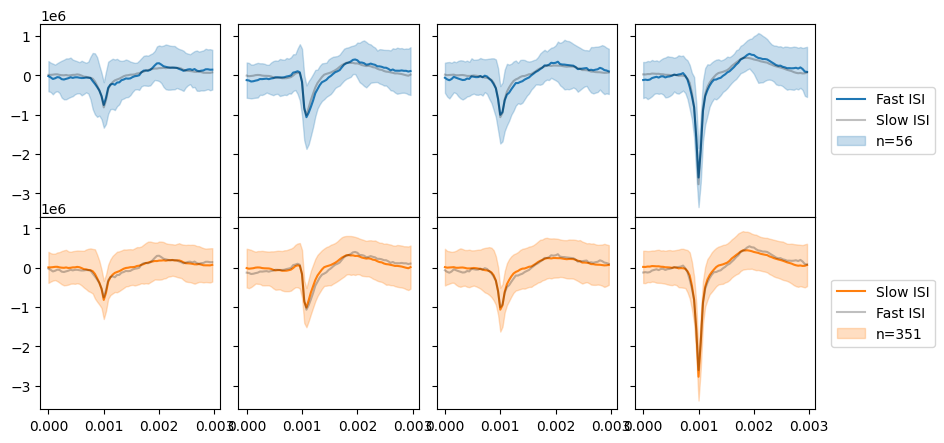

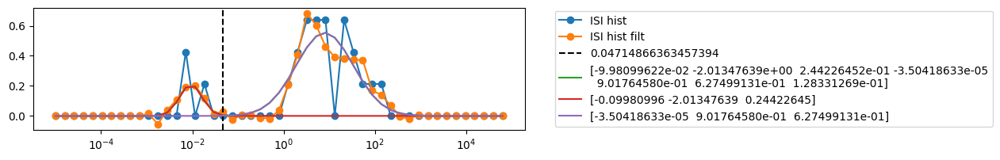

extract amplitudes: 100%|########################| 1513/1513 [00:00<00:00, 20509.88it/s]


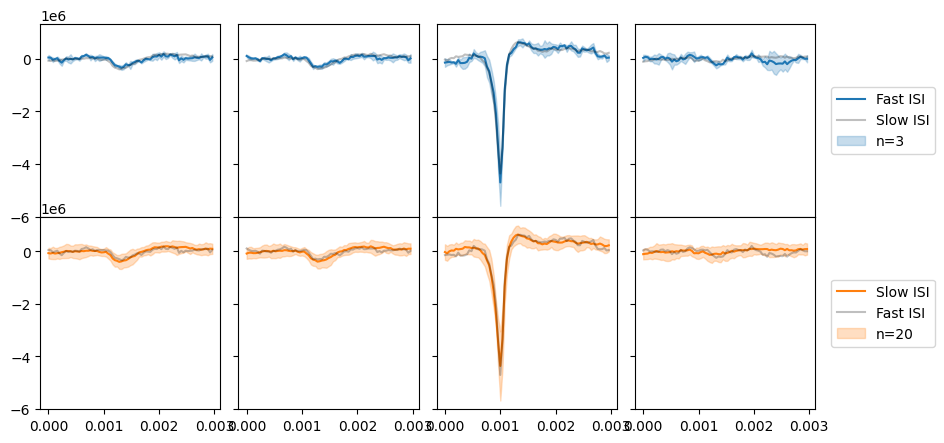

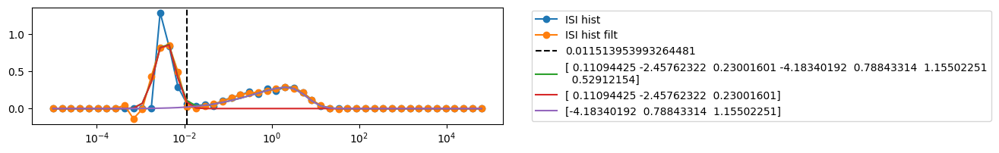

extract amplitudes: 100%|##########################| 1408/1408 [00:01<00:00, 768.21it/s]


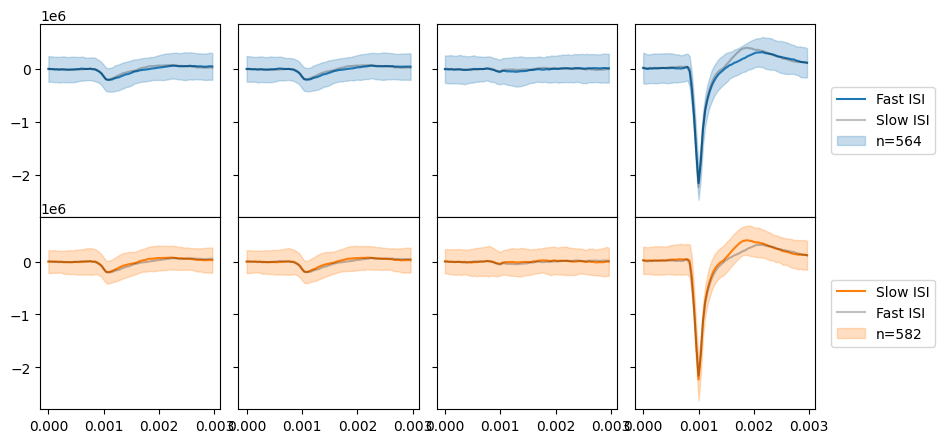

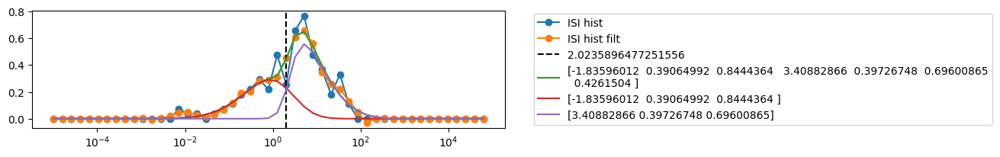

extract amplitudes: 100%|#########################| 1408/1408 [00:00<00:00, 4746.63it/s]


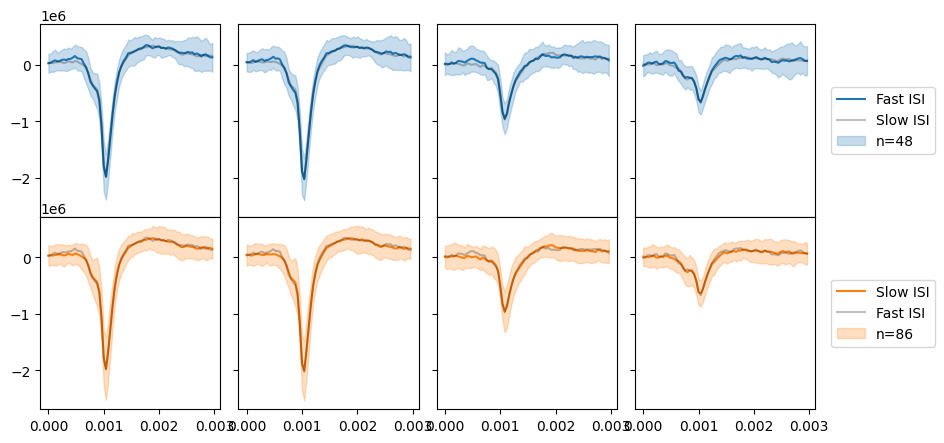

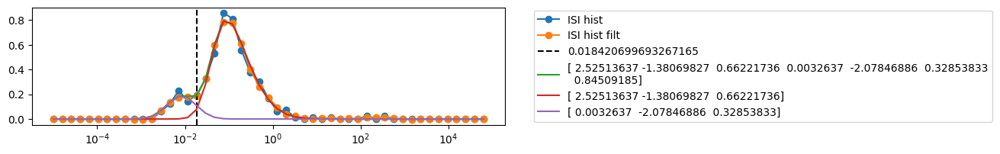

extract amplitudes: 100%|#########################| 1408/1408 [00:00<00:00, 4883.92it/s]


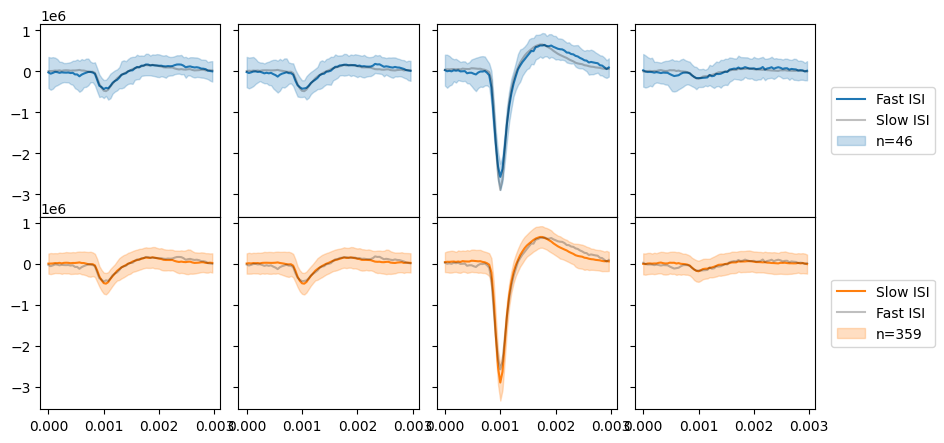

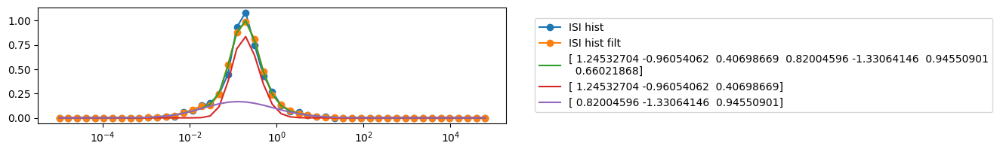

extract amplitudes: 100%|#########################| 1311/1311 [00:00<00:00, 4263.34it/s]


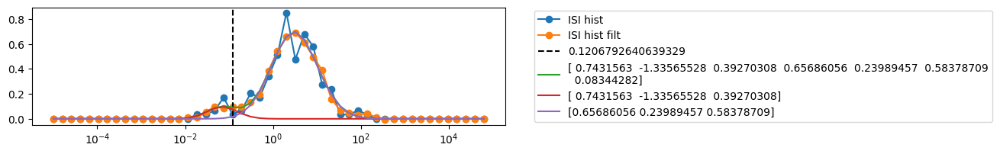

extract amplitudes: 100%|########################| 1311/1311 [00:00<00:00, 28929.28it/s]


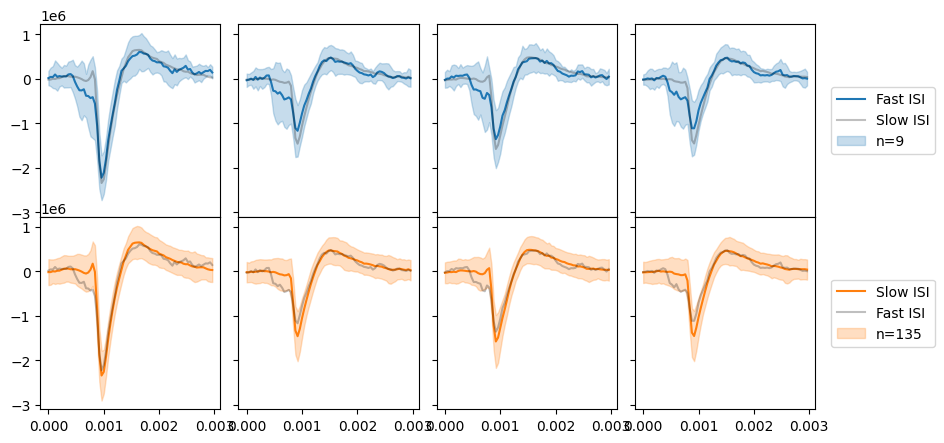

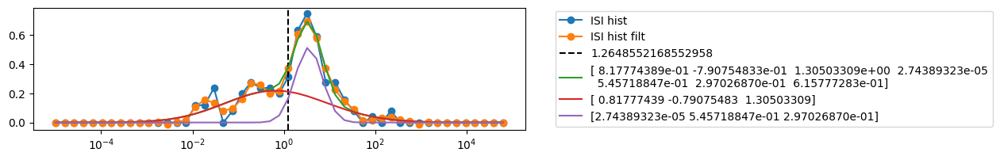

extract amplitudes: 100%|##########################| 1835/1835 [00:03<00:00, 468.12it/s]


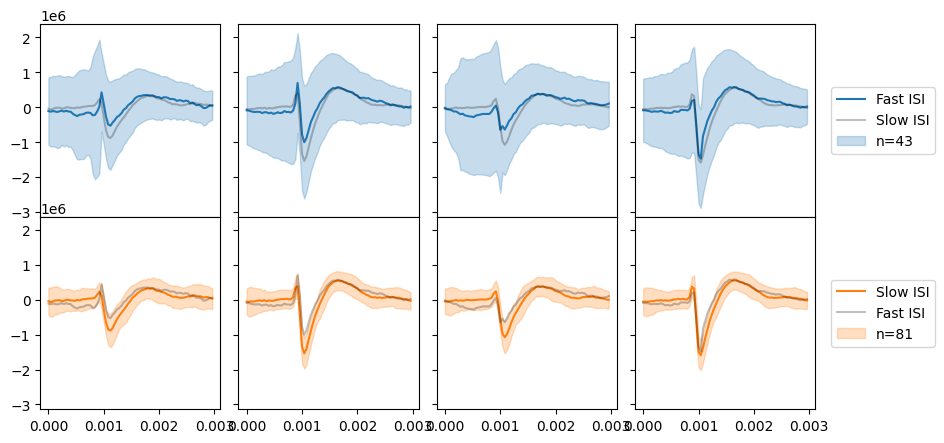

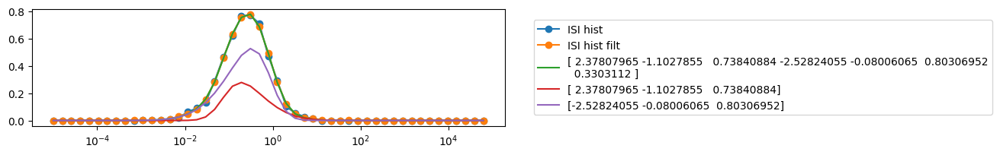

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1846.12it/s]


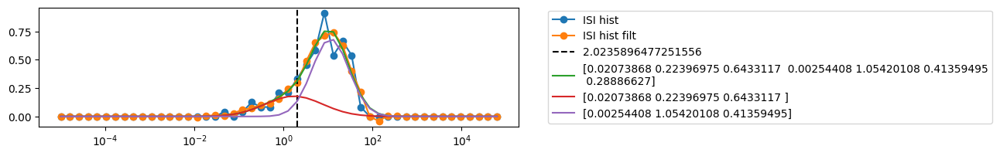

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1896.89it/s]


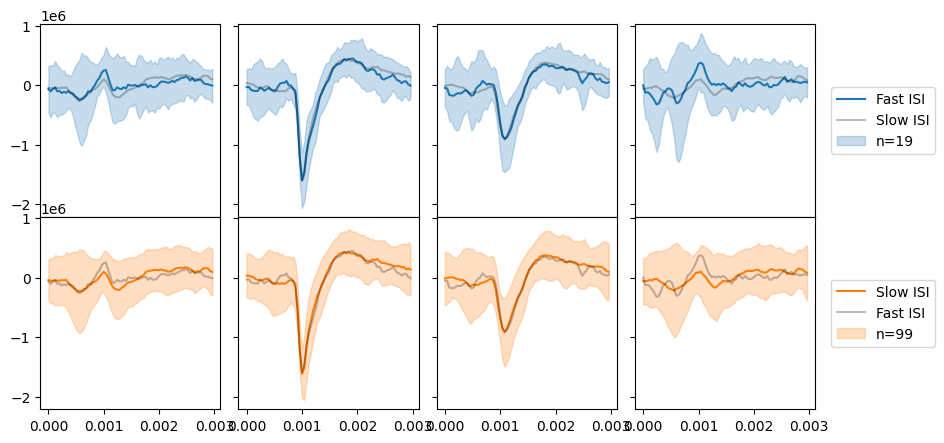

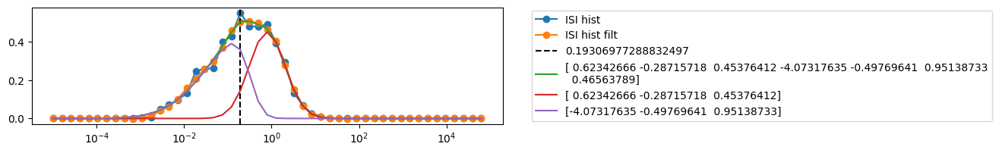

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1971.84it/s]


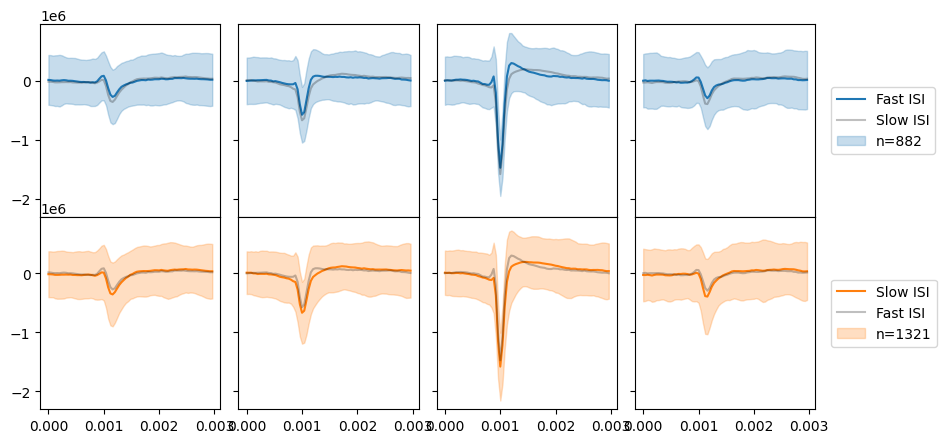

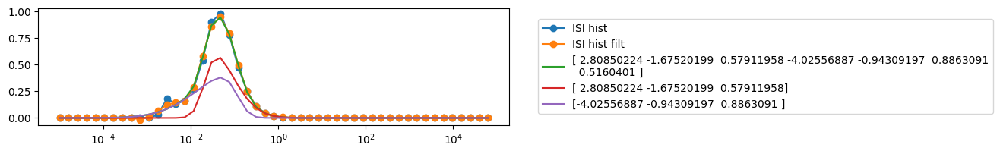

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1971.21it/s]


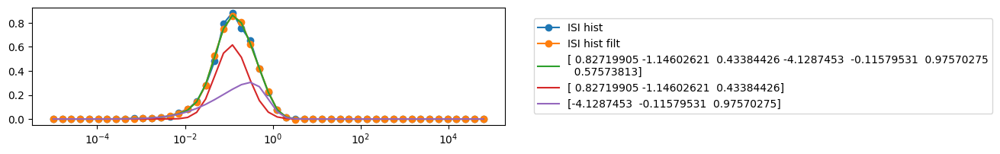

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1919.64it/s]


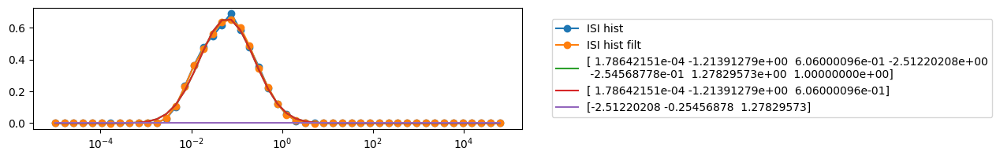

extract amplitudes: 100%|##########################| 1874/1874 [00:05<00:00, 330.27it/s]


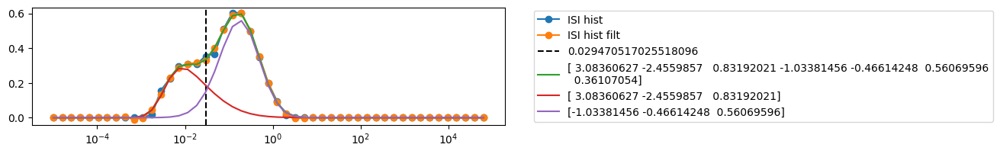

extract amplitudes: 100%|#########################| 1874/1874 [00:00<00:00, 3420.36it/s]


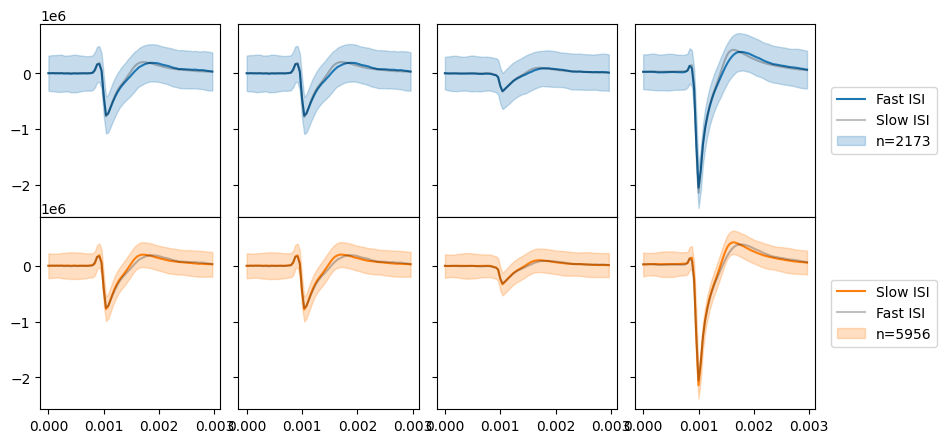

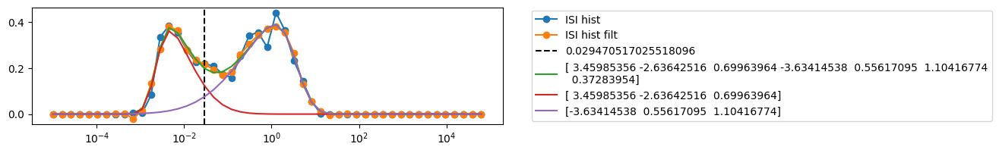

extract amplitudes: 100%|##########################| 1835/1835 [00:03<00:00, 495.17it/s]


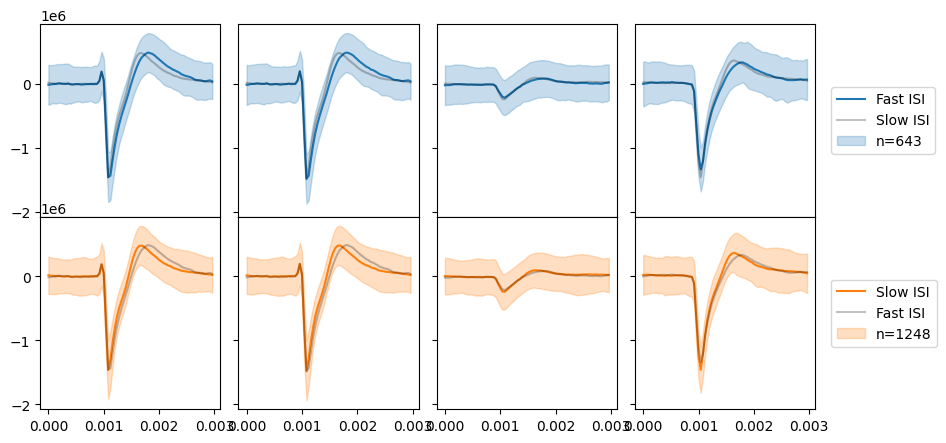

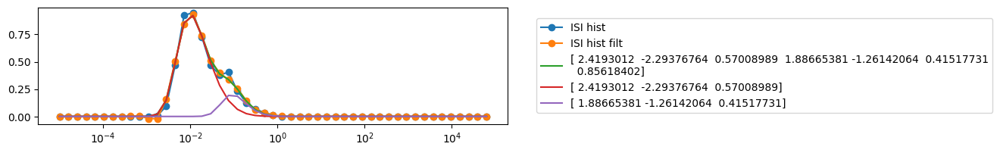

extract amplitudes: 100%|##########################| 1200/1200 [00:02<00:00, 464.23it/s]


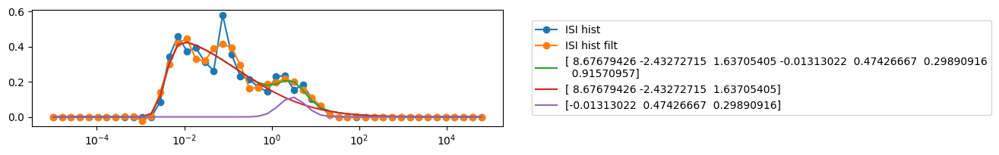

extract amplitudes: 100%|#########################| 1200/1200 [00:00<00:00, 2429.52it/s]


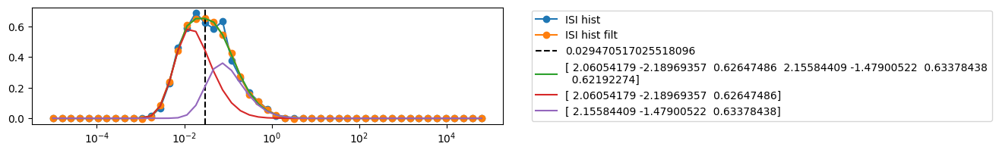

extract amplitudes: 100%|#########################| 1200/1200 [00:00<00:00, 2087.79it/s]


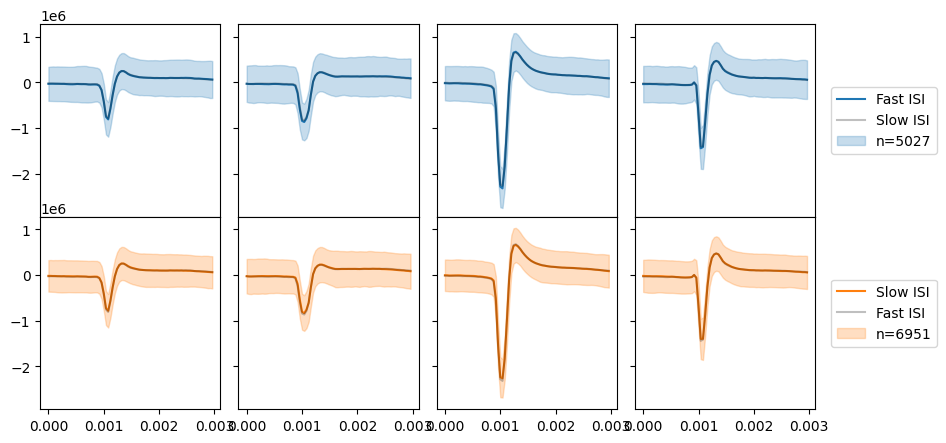

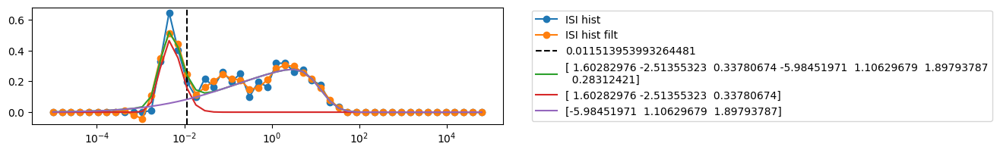

extract amplitudes: 100%|#########################| 1200/1200 [00:00<00:00, 2344.59it/s]


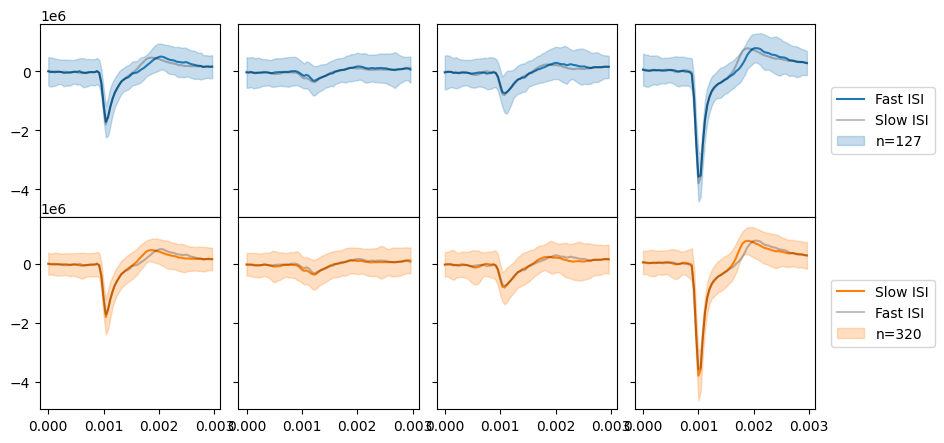

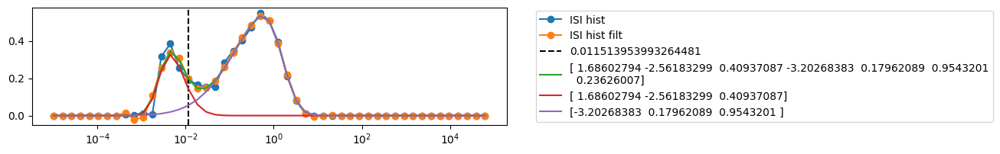

extract amplitudes: 100%|#########################| 1407/1407 [00:00<00:00, 1458.94it/s]


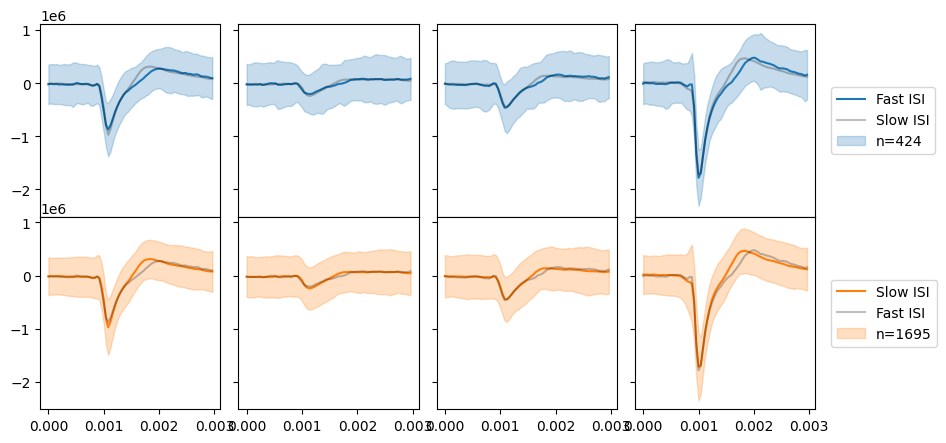

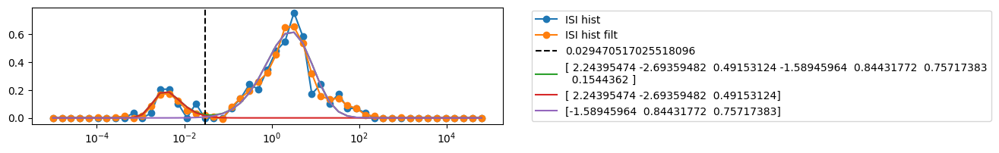

extract amplitudes: 100%|########################| 1407/1407 [00:00<00:00, 10861.91it/s]


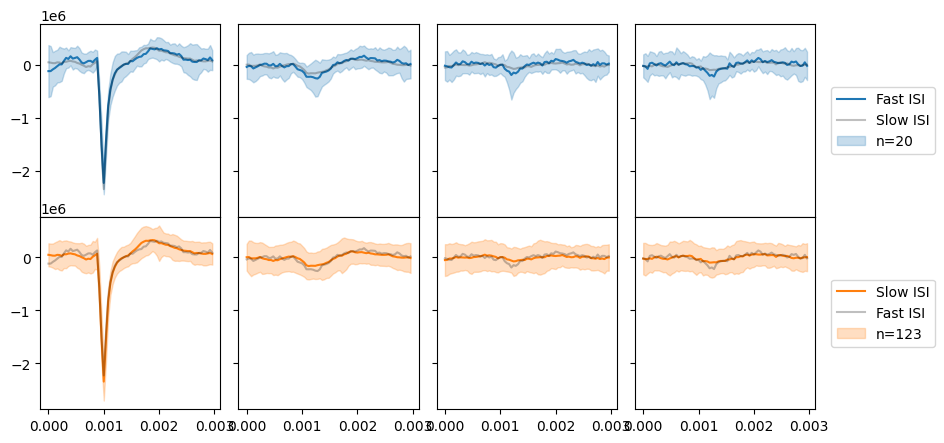

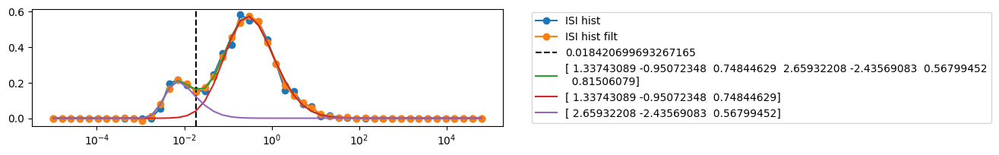

extract amplitudes: 100%|#########################| 1200/1200 [00:01<00:00, 1093.85it/s]


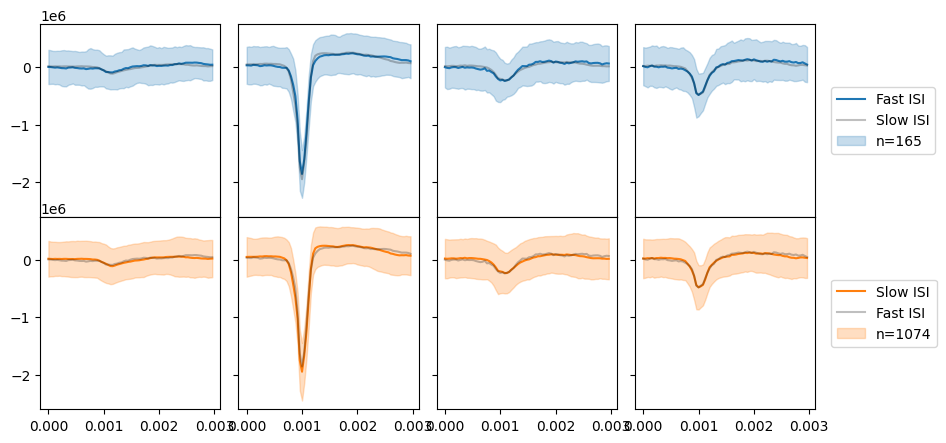

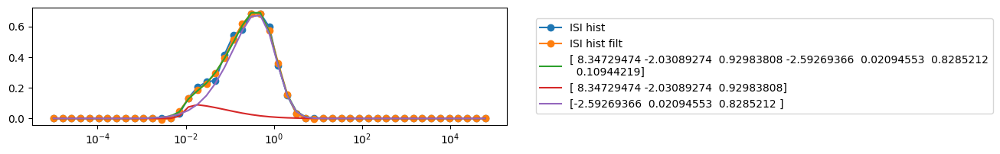

extract amplitudes: 100%|#########################| 1800/1800 [00:00<00:00, 7576.19it/s]


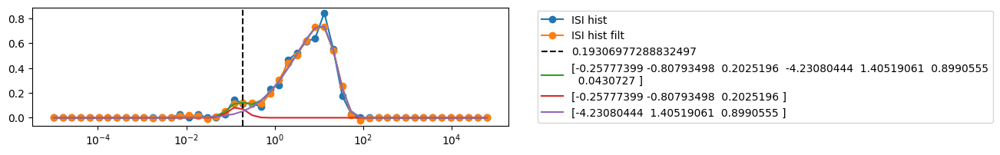

extract amplitudes: 100%|##########################| 1801/1801 [00:02<00:00, 680.32it/s]


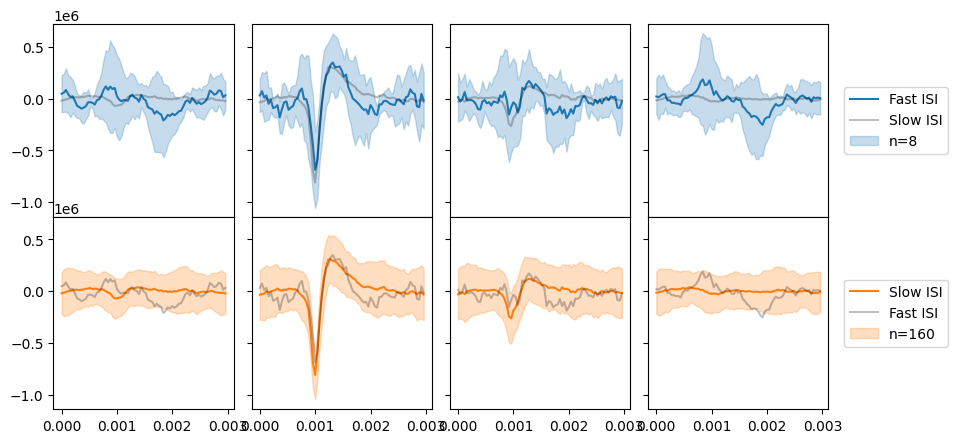

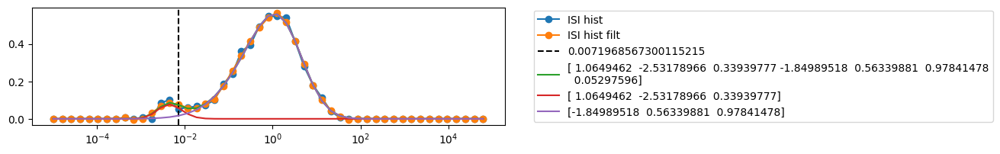

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 4288.46it/s]


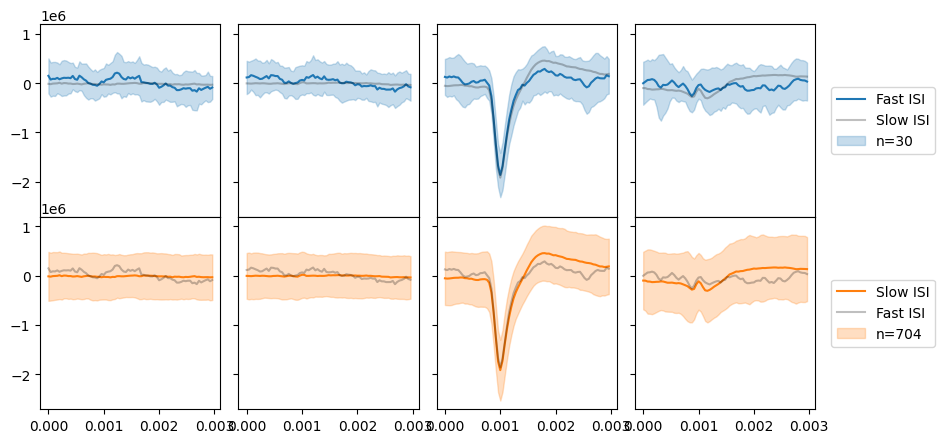

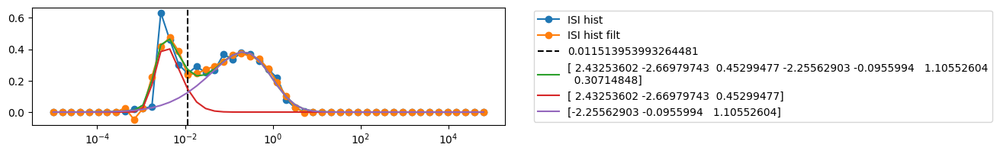

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 4522.98it/s]


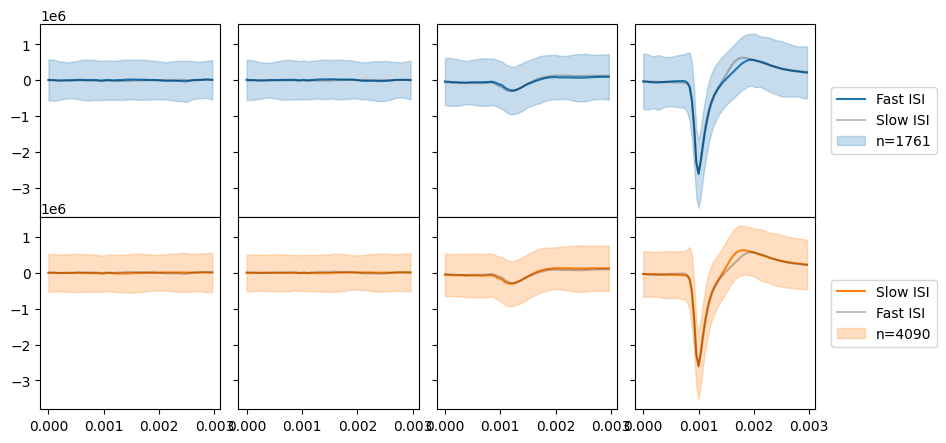

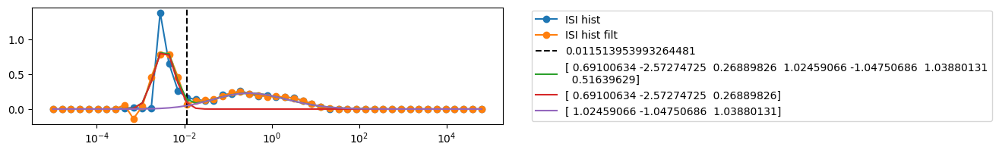

extract amplitudes: 100%|##########################| 1815/1815 [00:03<00:00, 586.08it/s]


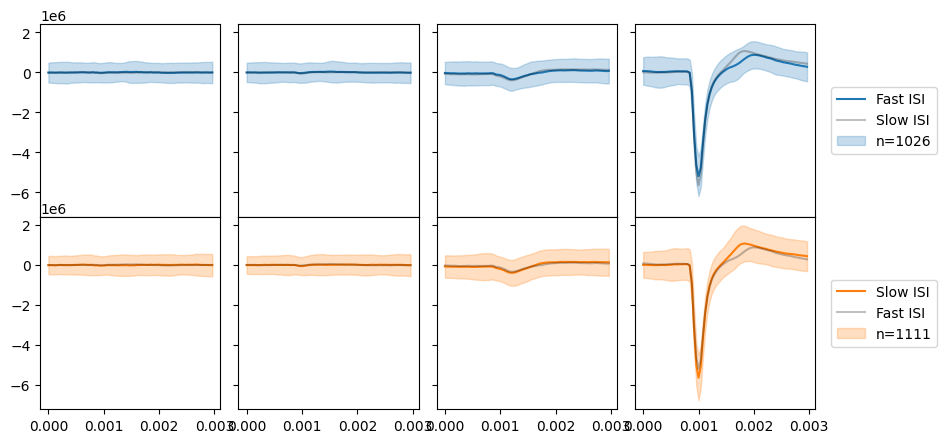

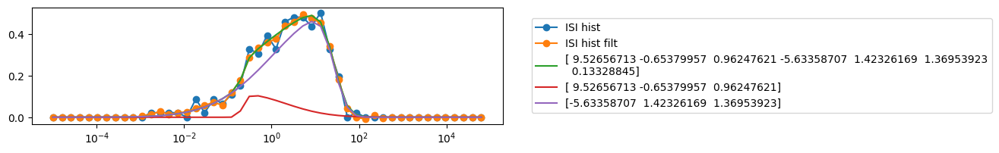

extract amplitudes: 100%|#########################| 1815/1815 [00:00<00:00, 2982.75it/s]


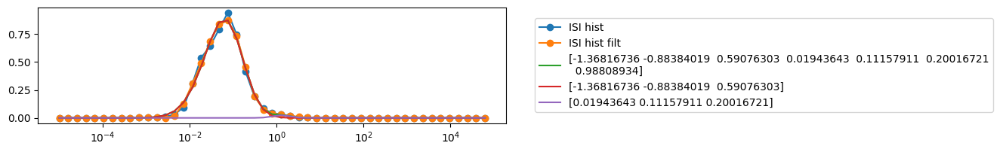

extract amplitudes: 100%|##########################| 1801/1801 [00:03<00:00, 528.43it/s]


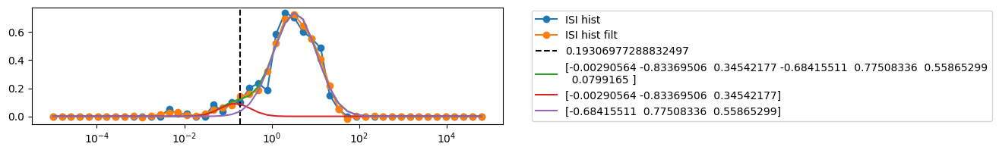

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 2454.62it/s]


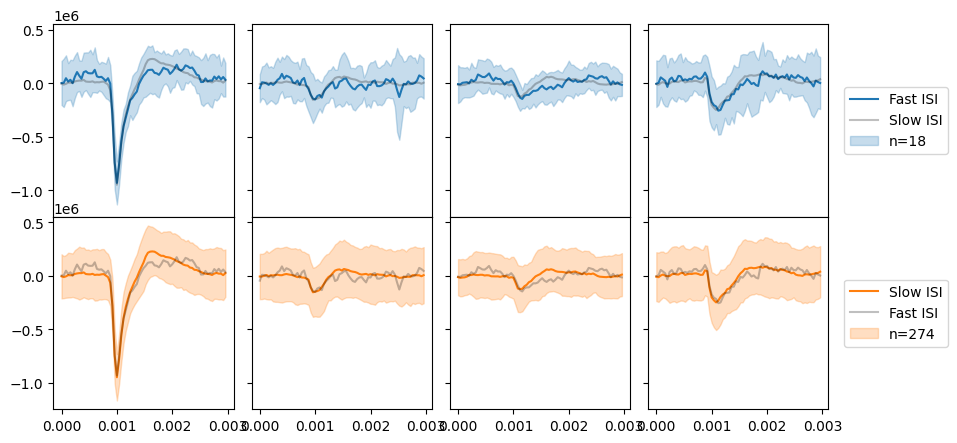

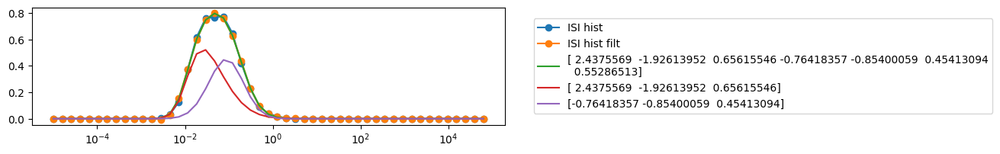

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 2643.77it/s]


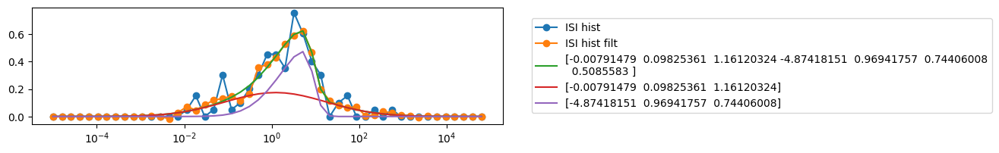

extract amplitudes: 100%|#########################| 1801/1801 [00:01<00:00, 1575.52it/s]


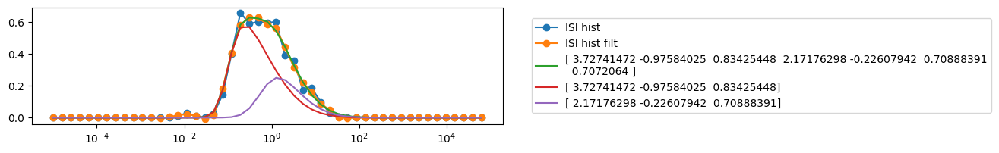

extract amplitudes: 100%|########################| 1801/1801 [00:00<00:00, 12552.10it/s]


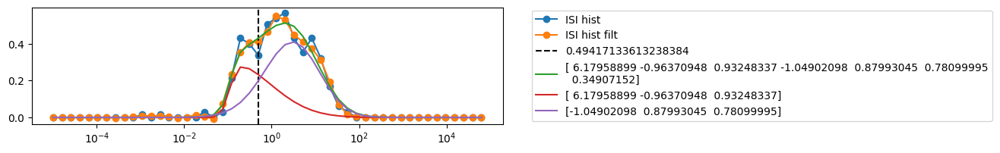

extract amplitudes: 100%|########################| 1801/1801 [00:00<00:00, 13544.33it/s]


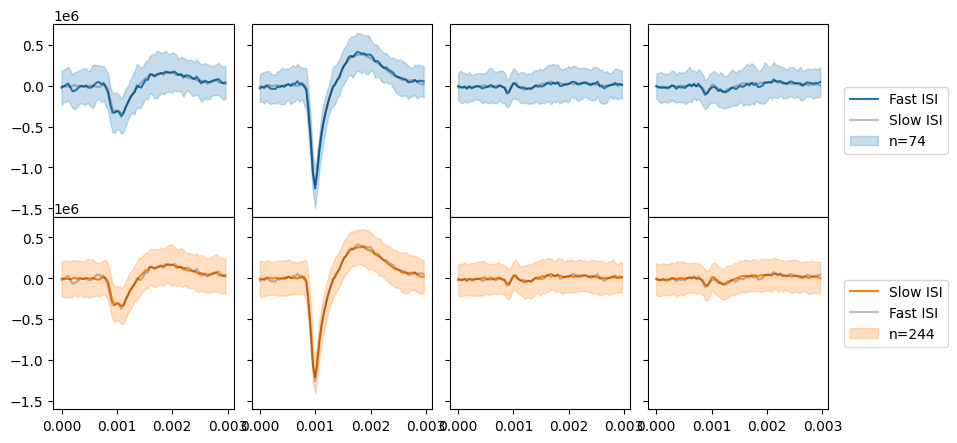

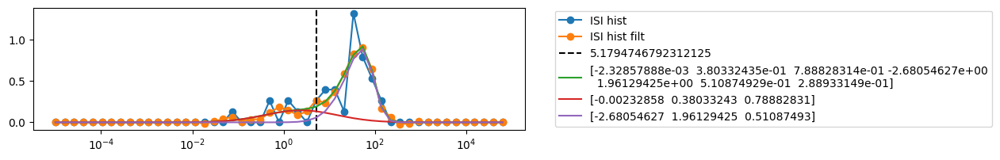

extract amplitudes: 100%|########################| 1890/1890 [00:00<00:00, 37545.63it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
/tmp/ipykernel_4191897/3514812414.py:99: RuntimeWarning: divide by zero encountered in scalar divide
  df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz


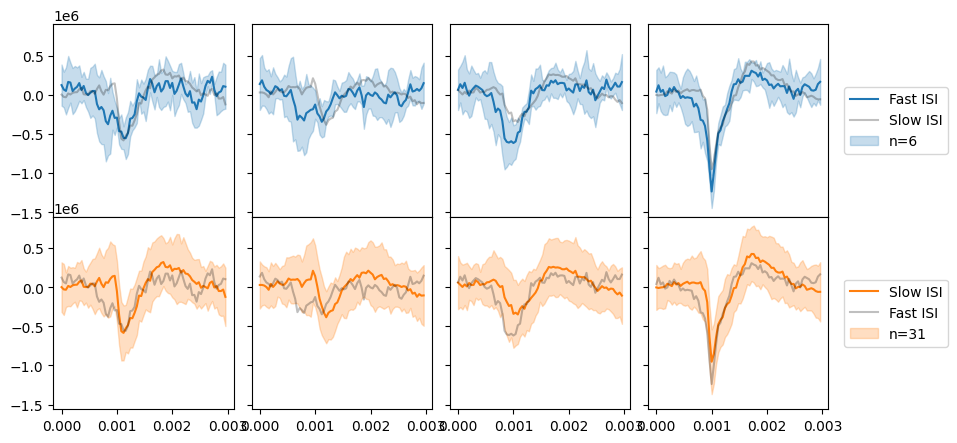

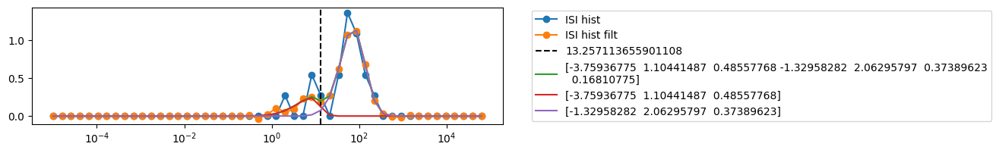

extract amplitudes: 100%|########################| 1890/1890 [00:00<00:00, 11884.50it/s]


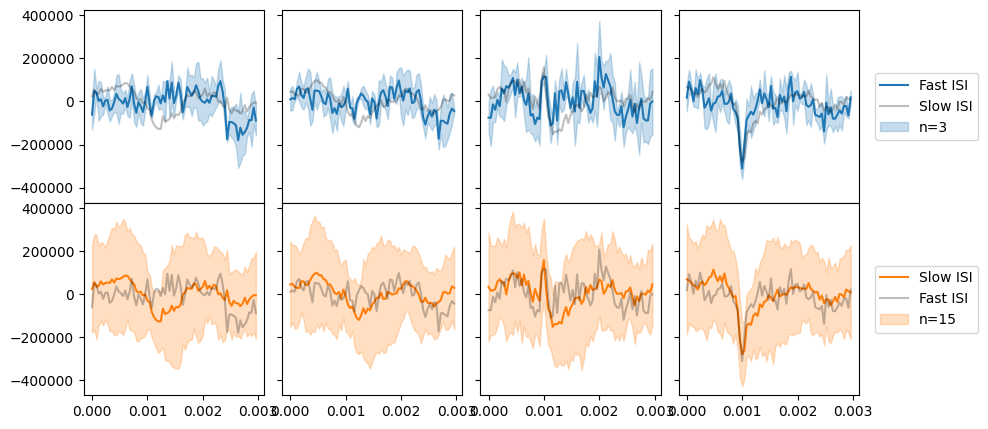

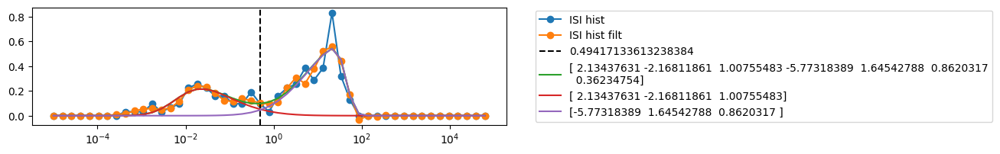

extract amplitudes: 100%|########################| 1805/1805 [00:00<00:00, 20933.19it/s]


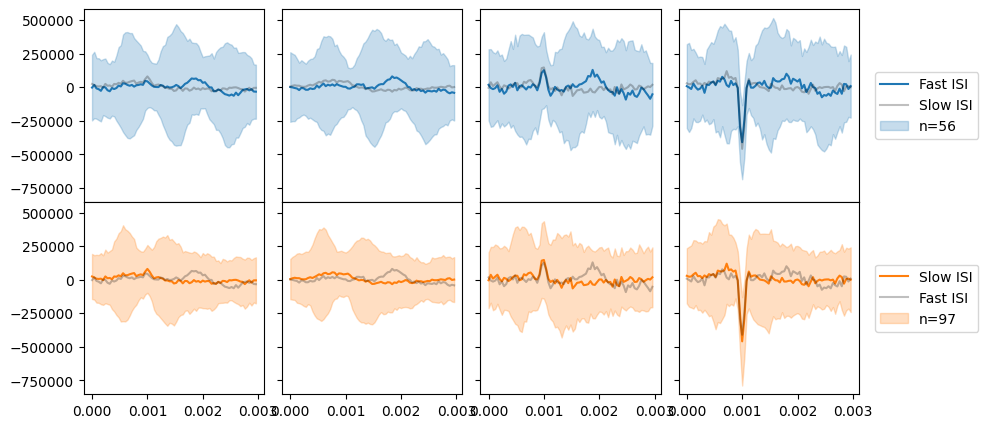

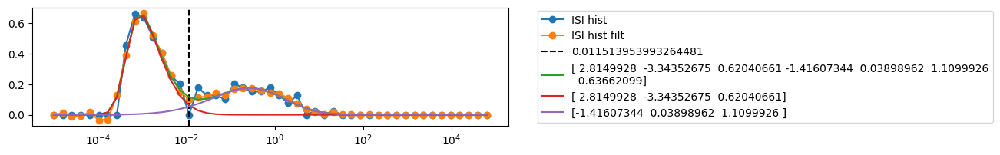

extract amplitudes: 100%|#########################| 1805/1805 [00:00<00:00, 3965.96it/s]


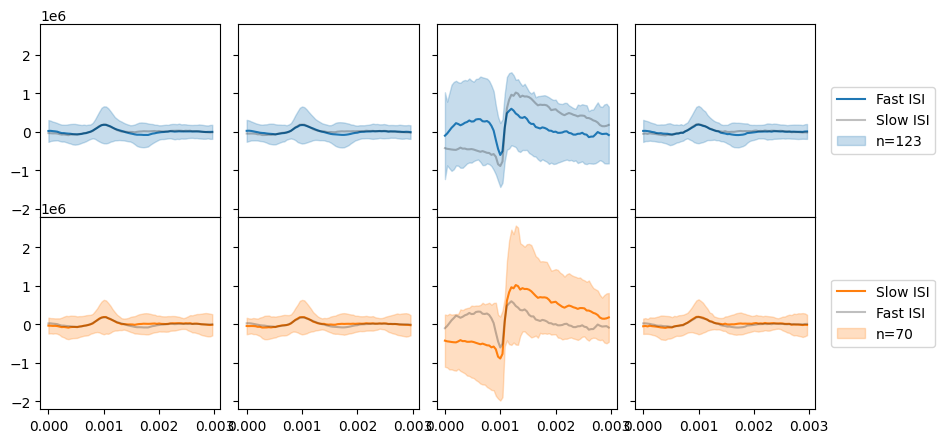

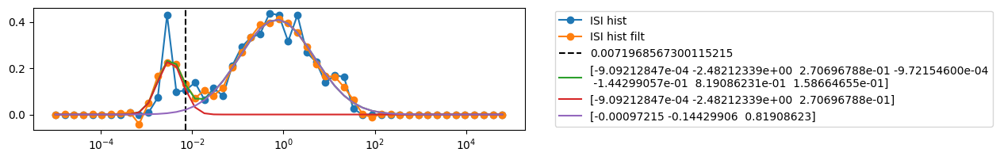

extract amplitudes: 100%|##########################| 1806/1806 [00:04<00:00, 430.18it/s]


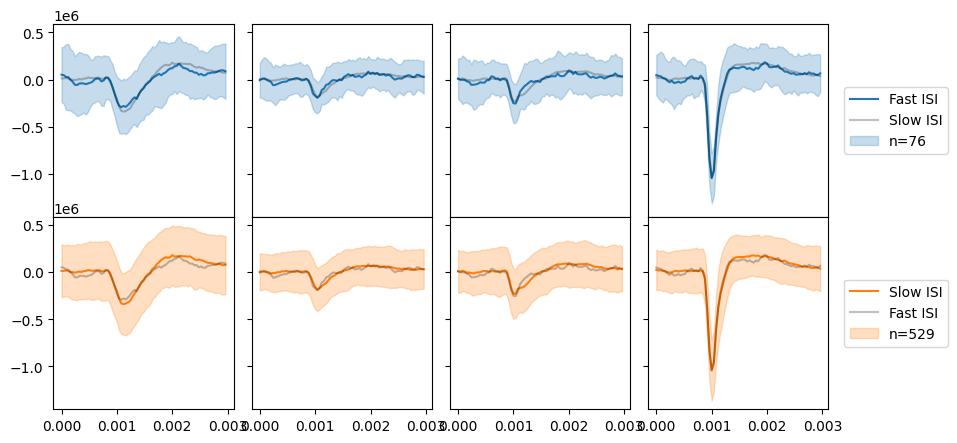

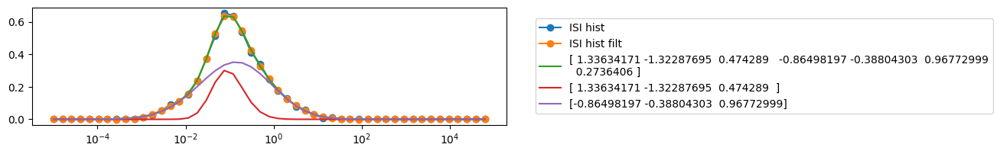

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1889.08it/s]


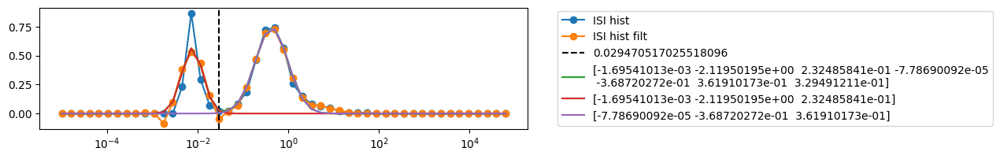

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1896.25it/s]


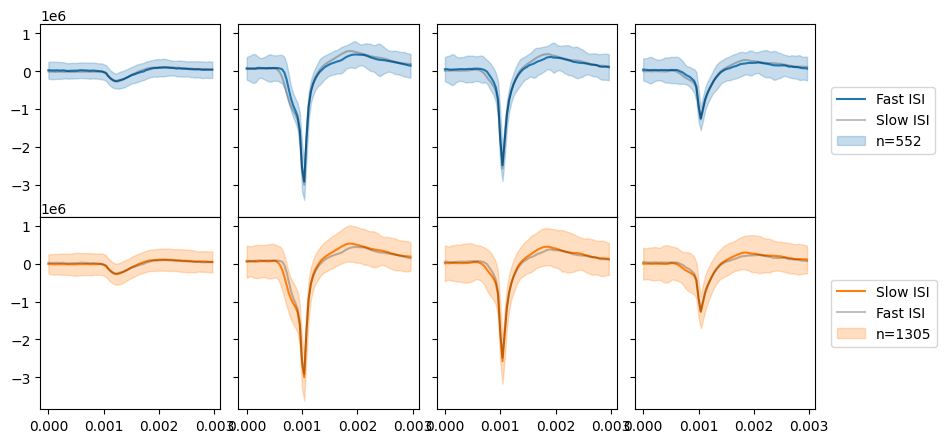

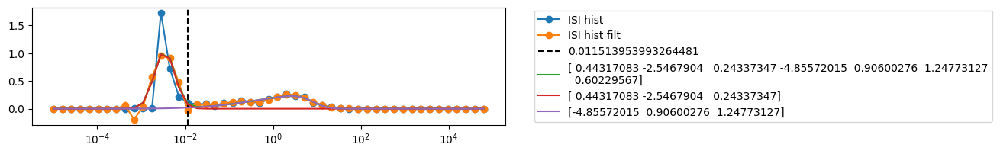

extract amplitudes: 100%|#########################| 1806/1806 [00:01<00:00, 1741.24it/s]


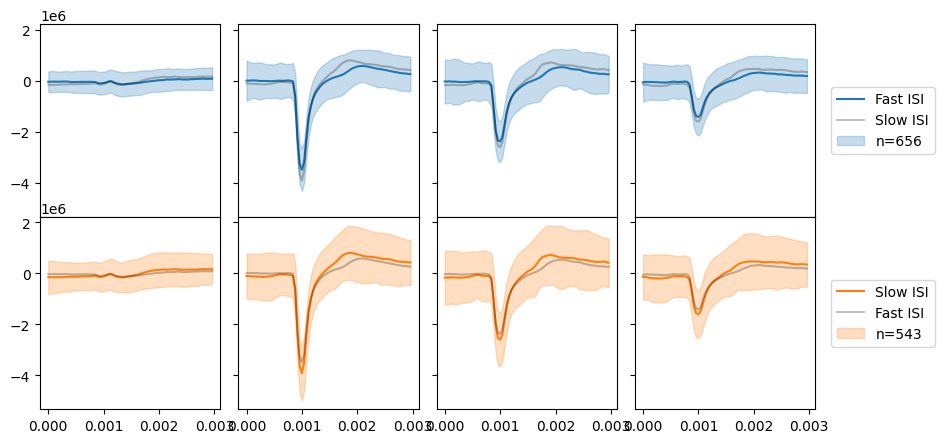

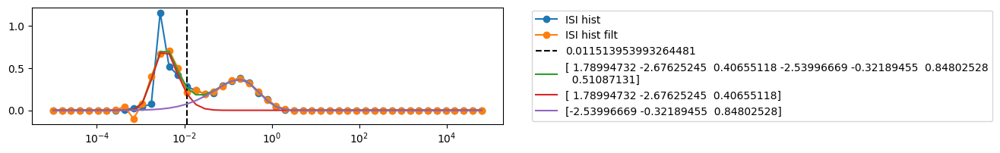

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1827.83it/s]


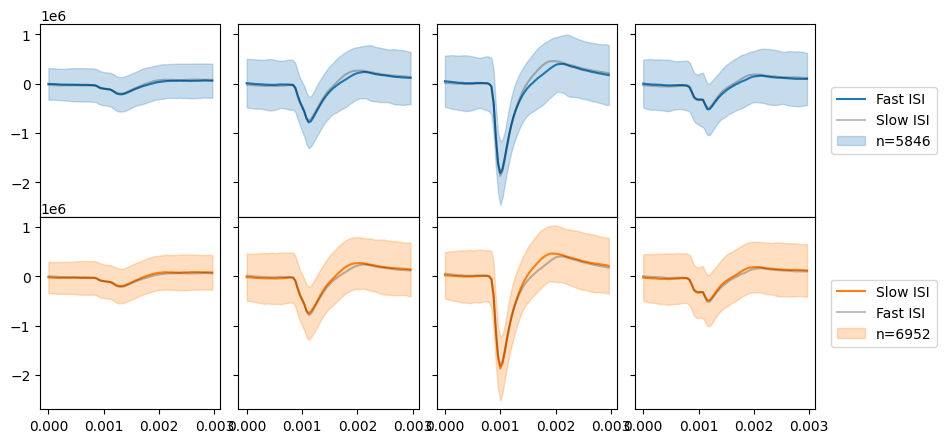

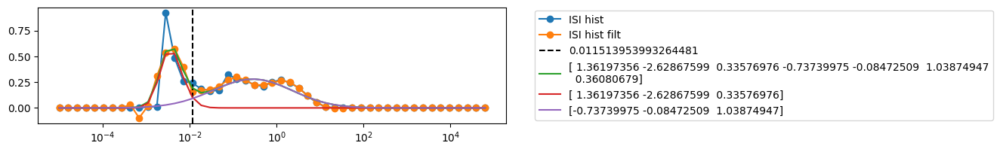

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1862.05it/s]


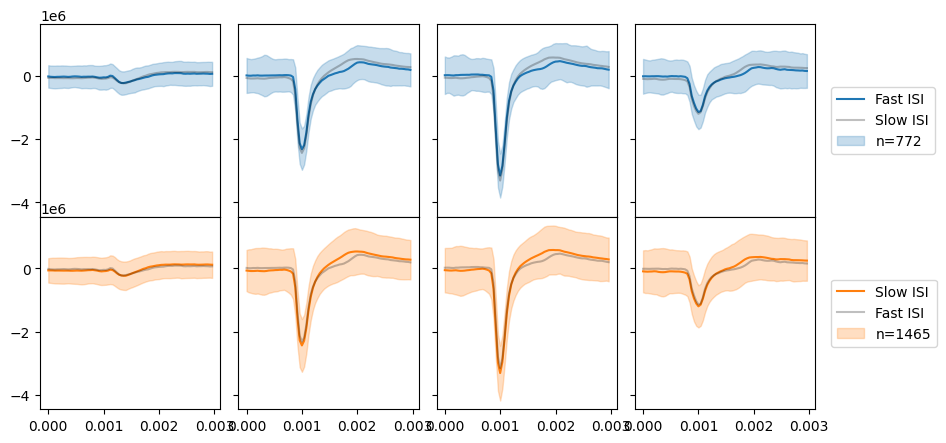

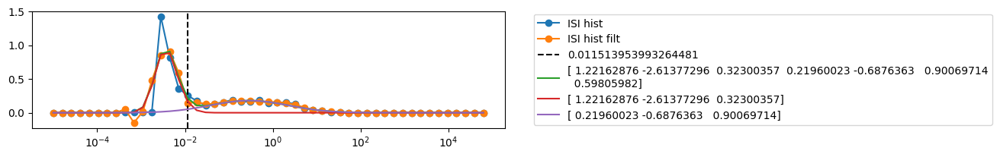

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1861.89it/s]


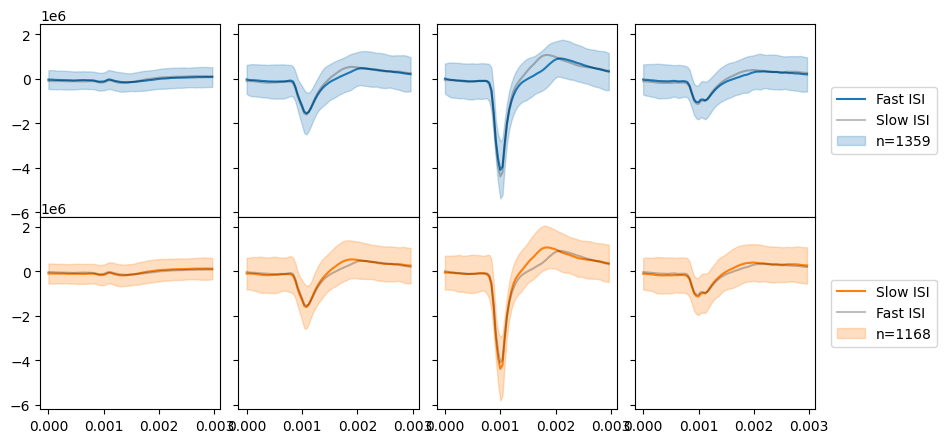

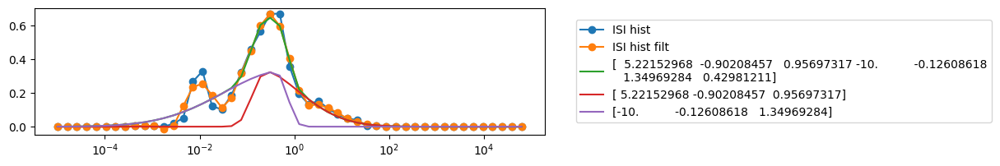

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 2001.95it/s]


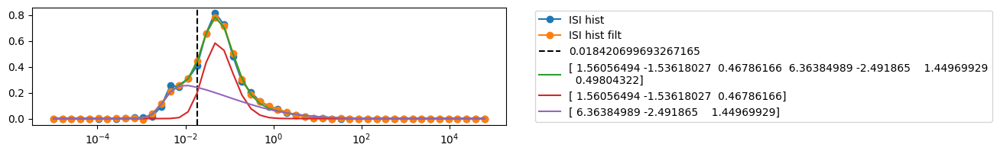

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1826.47it/s]


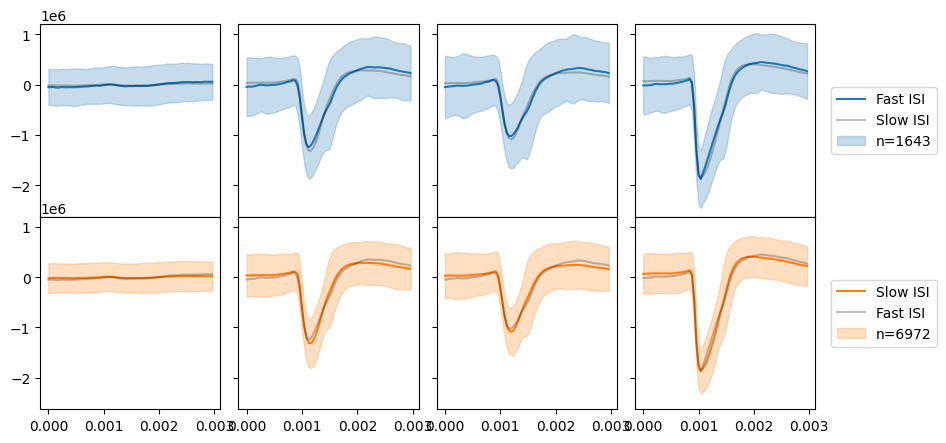

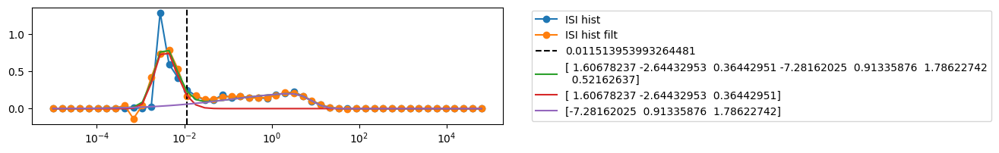

extract amplitudes: 100%|#########################| 1806/1806 [00:01<00:00, 1666.84it/s]


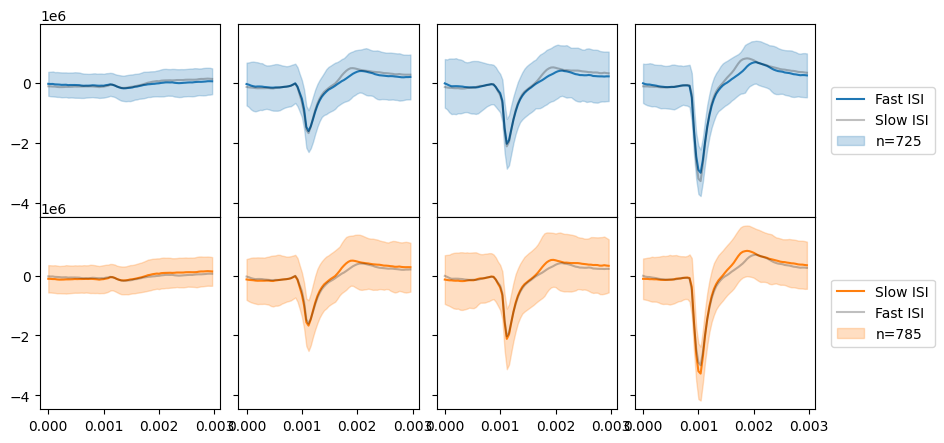

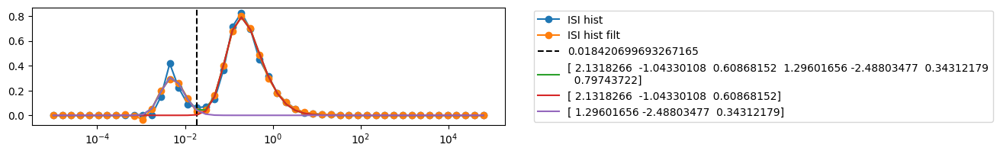

extract amplitudes: 100%|#########################| 1806/1806 [00:01<00:00, 1363.99it/s]


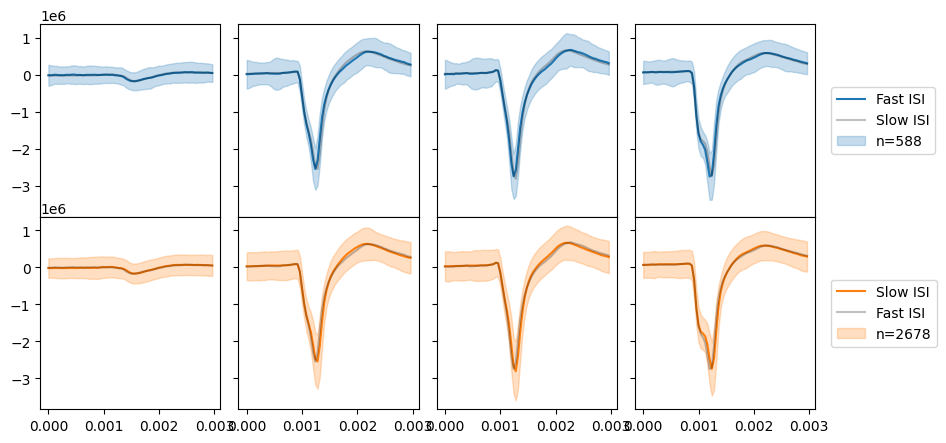

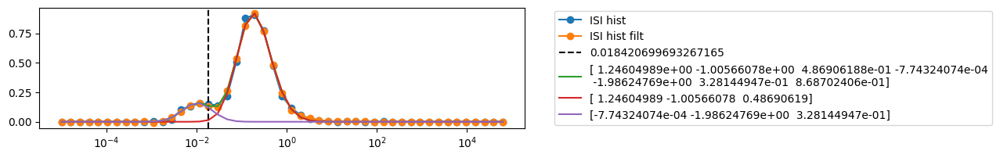

extract amplitudes: 100%|#########################| 1802/1802 [00:00<00:00, 2048.87it/s]


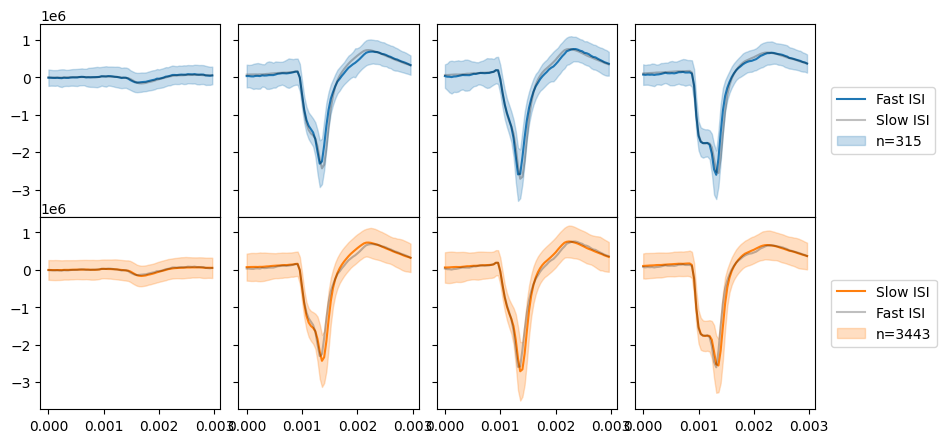

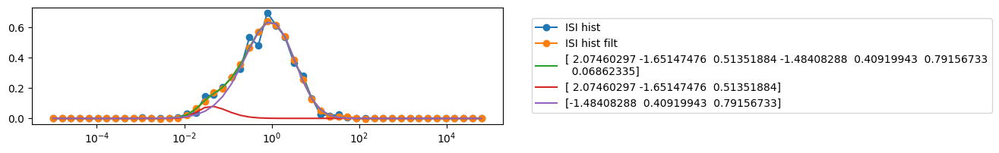

extract amplitudes: 100%|#########################| 1802/1802 [00:01<00:00, 1727.45it/s]


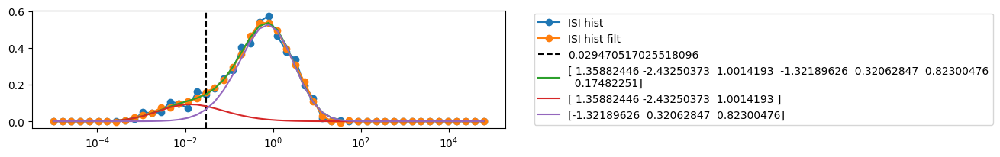

extract amplitudes: 100%|########################| 1806/1806 [00:00<00:00, 13324.57it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
/tmp/ipykernel_4191897/3514812414.py:99: RuntimeWarning: divide by zero encountered in scalar divide
  df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz


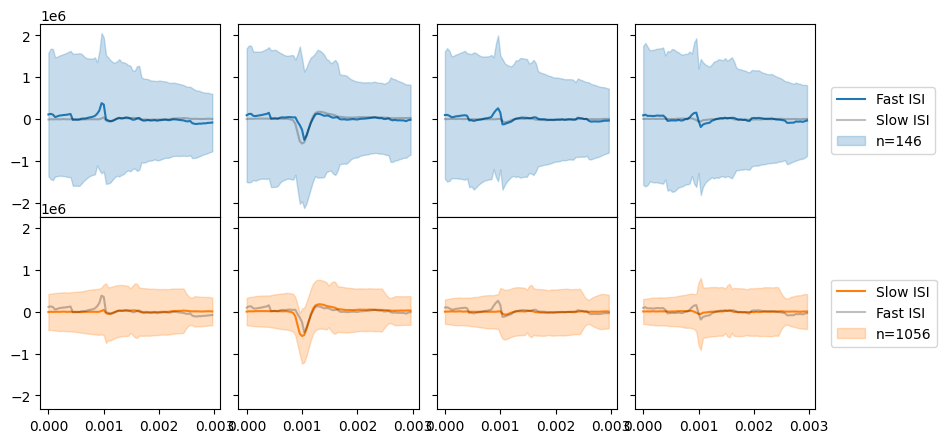

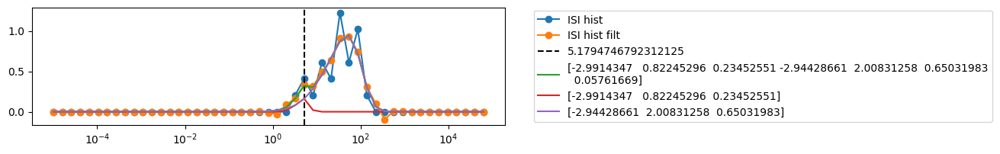

extract amplitudes: 100%|########################| 1806/1806 [00:00<00:00, 50199.56it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))


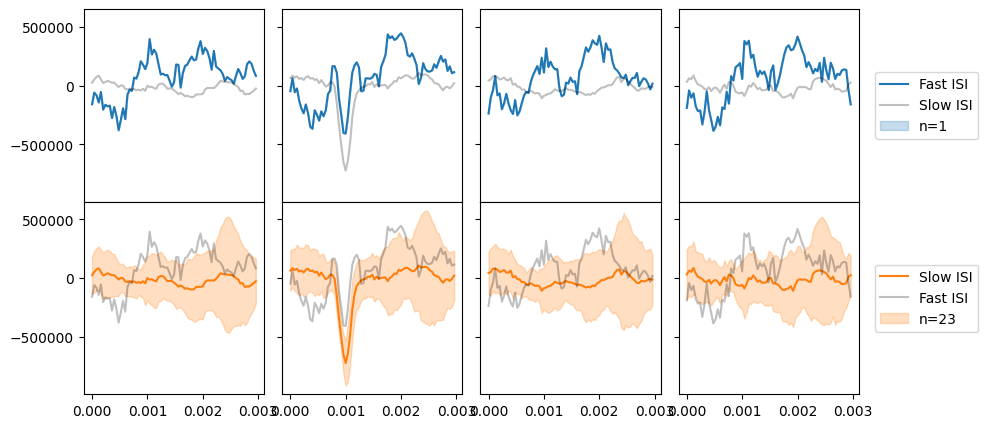

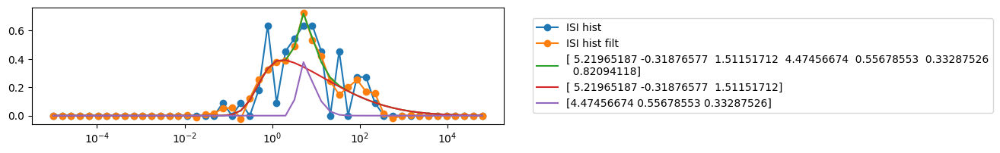

extract amplitudes: 100%|##########################| 1806/1806 [00:03<00:00, 587.06it/s]


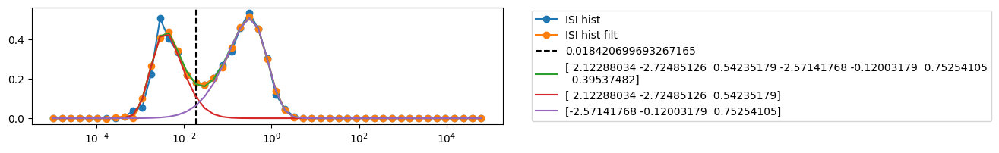

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 3517.43it/s]


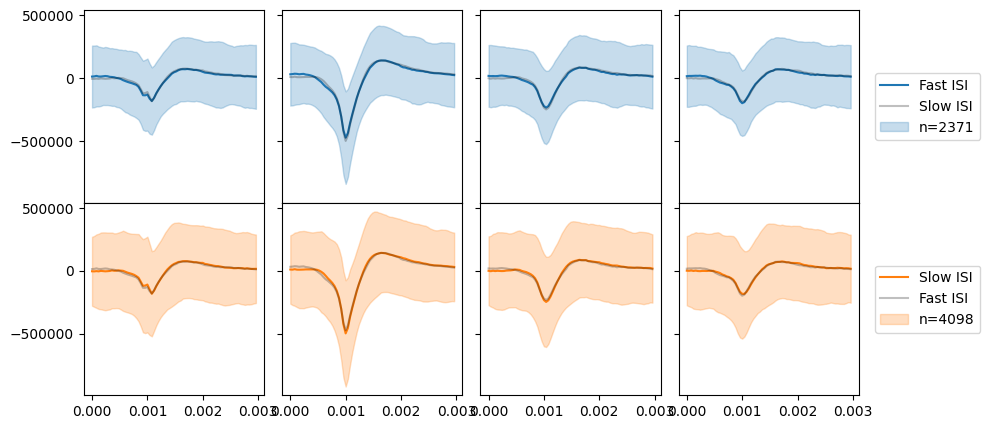

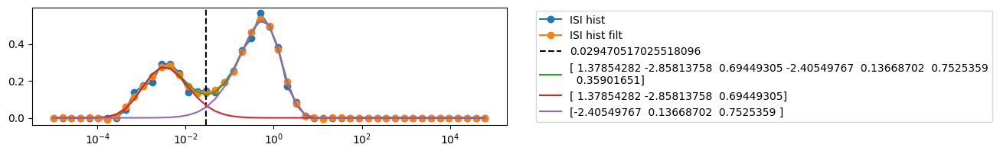

extract amplitudes: 100%|#########################| 1808/1808 [00:00<00:00, 8104.53it/s]


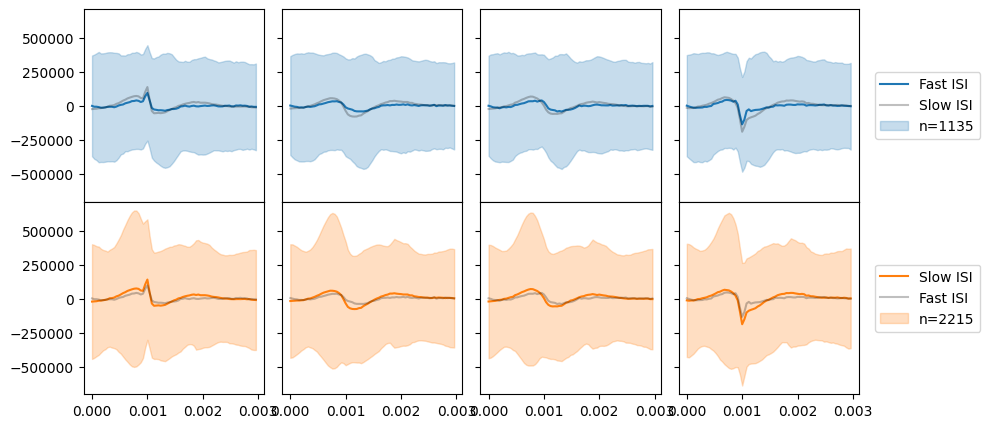

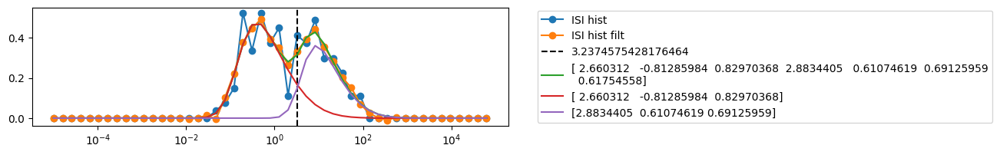

extract amplitudes: 100%|########################| 1808/1808 [00:00<00:00, 40137.94it/s]


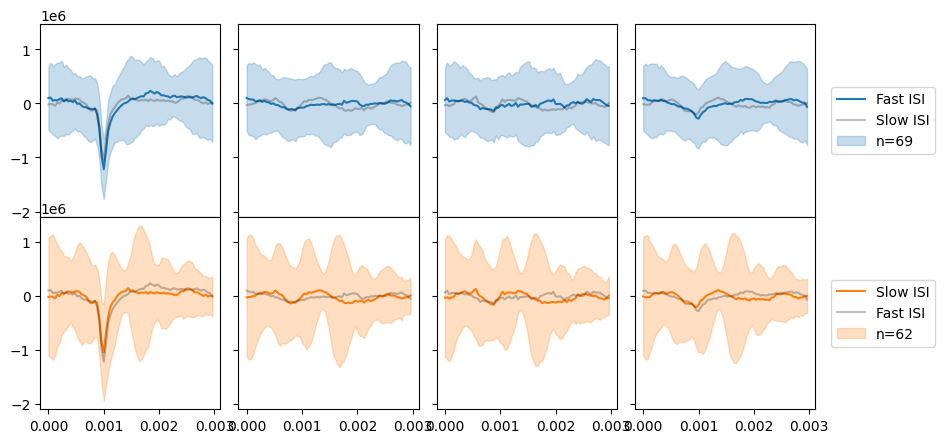

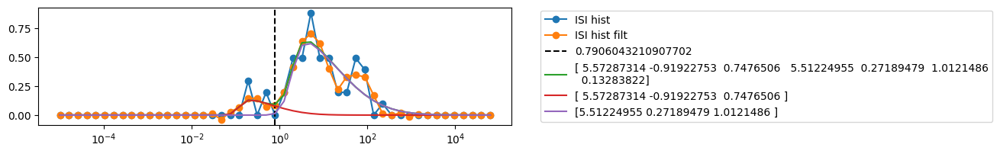

extract amplitudes: 100%|##########################| 1804/1804 [00:03<00:00, 600.33it/s]


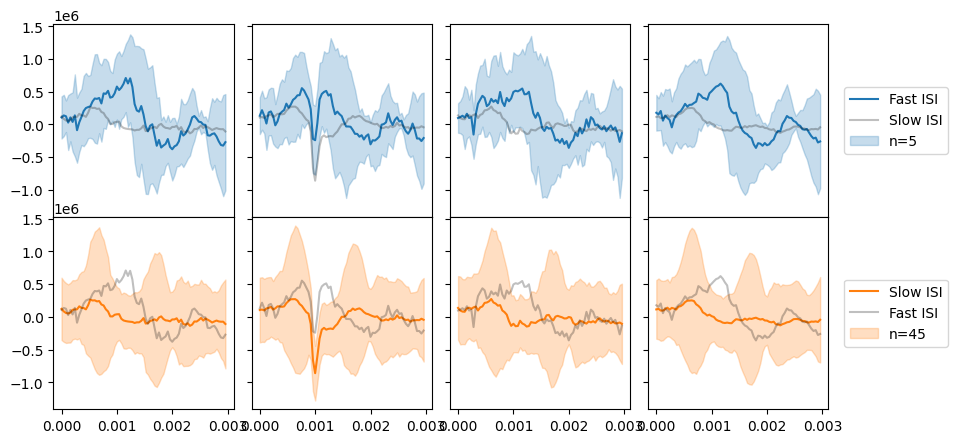

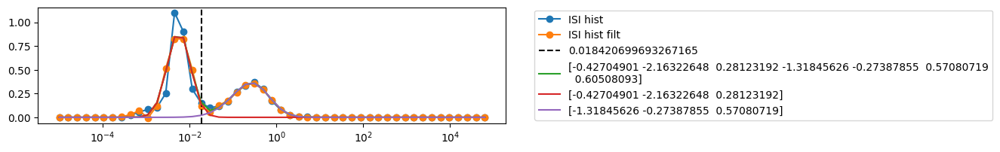

extract amplitudes: 100%|#########################| 1804/1804 [00:00<00:00, 3542.61it/s]


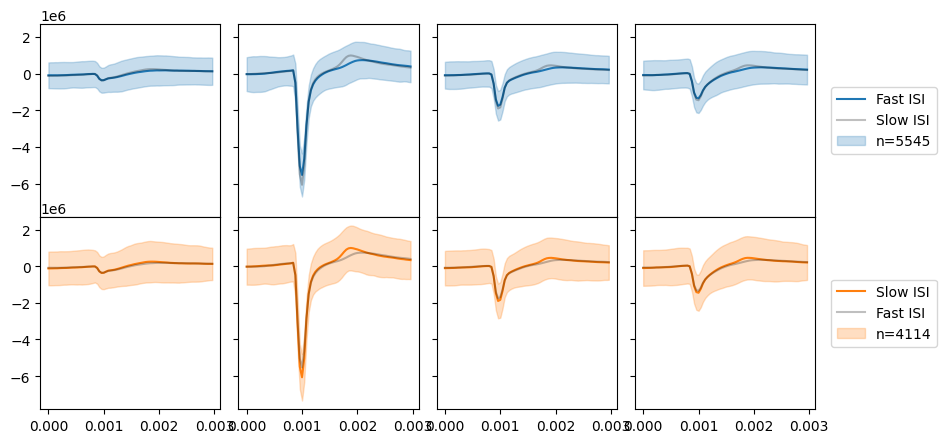

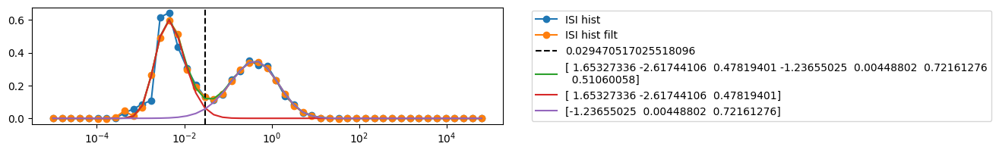

extract amplitudes: 100%|#########################| 1804/1804 [00:00<00:00, 3833.89it/s]


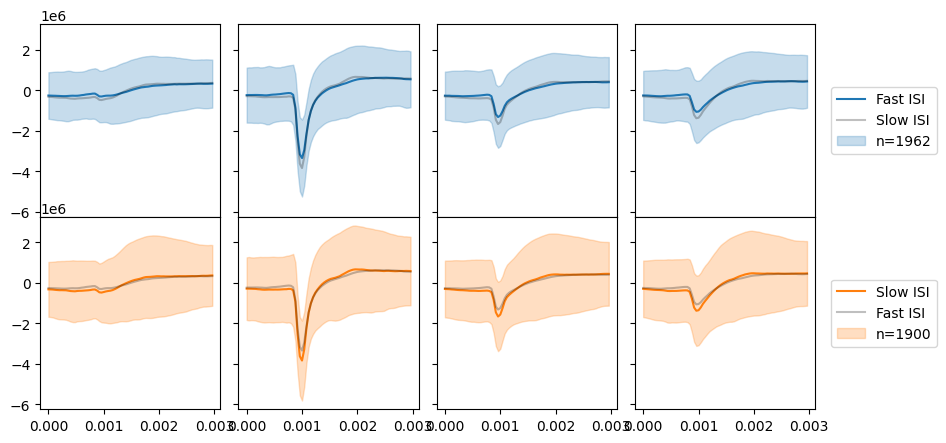

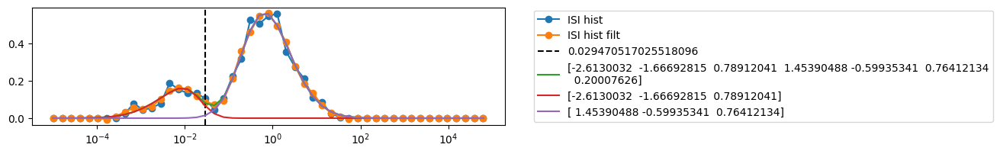

extract amplitudes: 100%|#########################| 1999/1999 [00:01<00:00, 1256.32it/s]


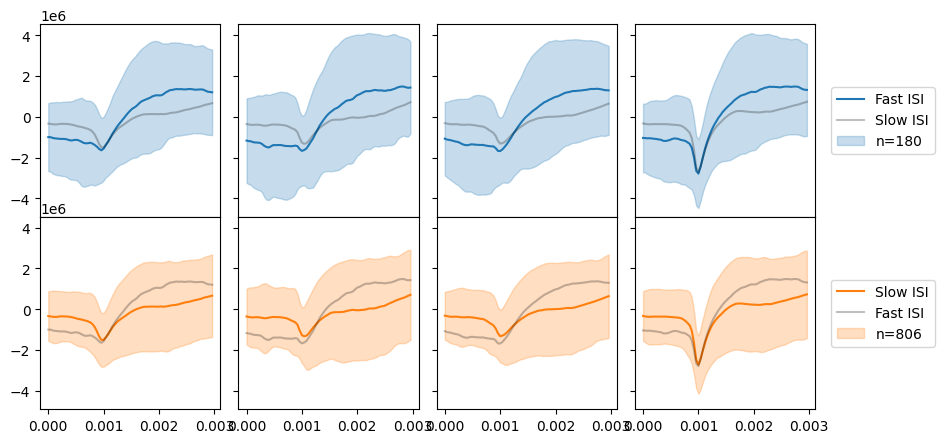

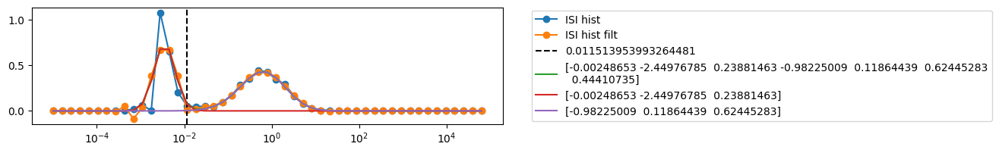

extract amplitudes: 100%|#########################| 1999/1999 [00:00<00:00, 9718.30it/s]


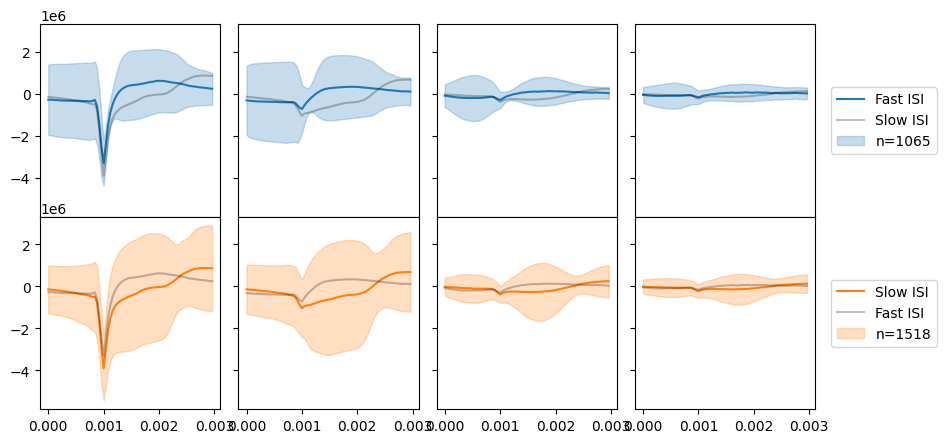

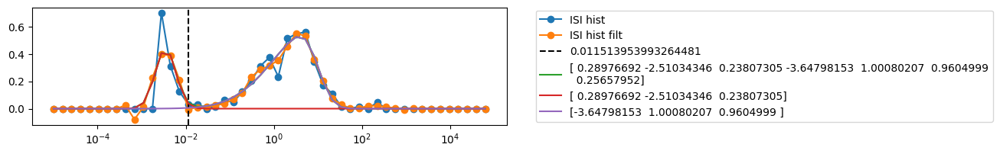

extract amplitudes: 100%|##########################| 1999/1999 [00:03<00:00, 659.96it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))


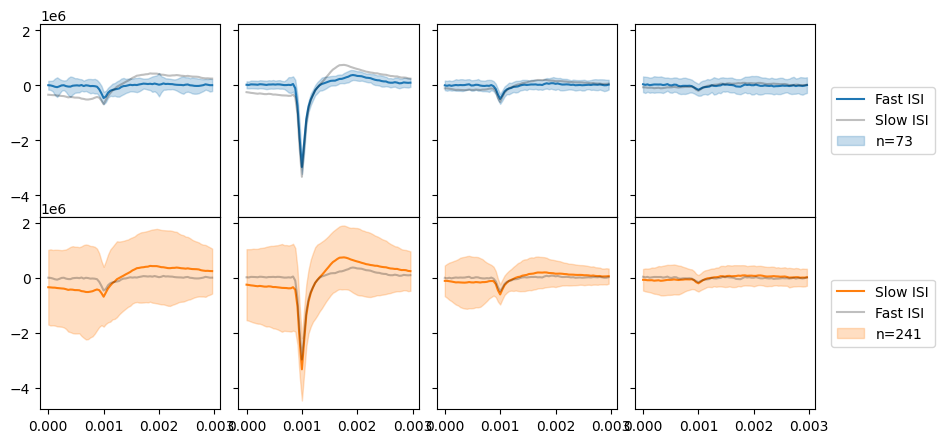

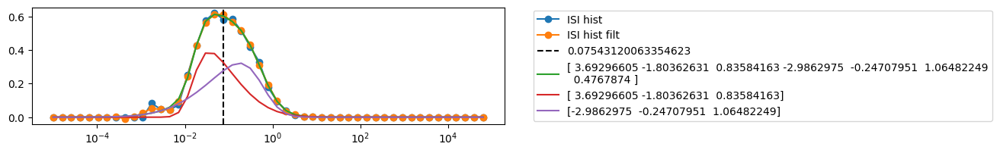

extract amplitudes: 100%|#########################| 1999/1999 [00:00<00:00, 3050.63it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
/tmp/ipykernel_4191897/3514812414.py:99: RuntimeWarning: divide by zero encountered in scalar divide
  df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz


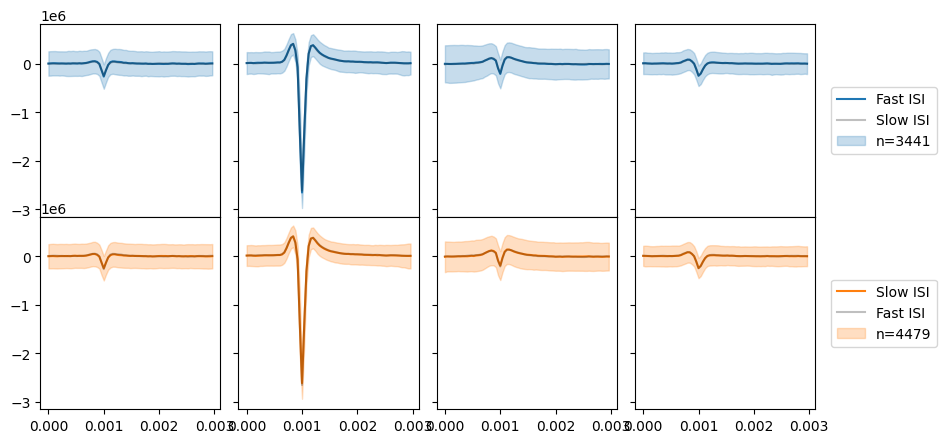

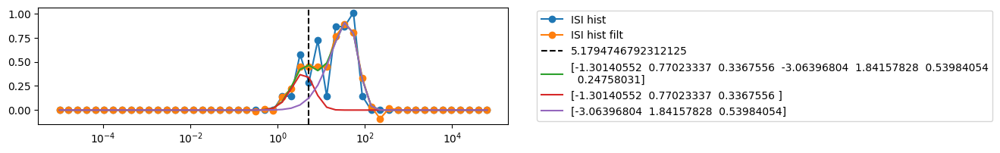

extract amplitudes: 100%|#########################| 1999/1999 [00:00<00:00, 4280.17it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))


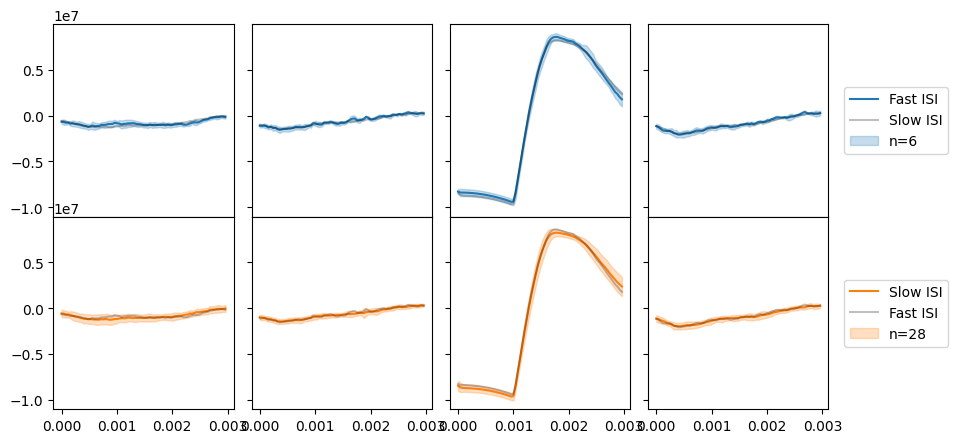

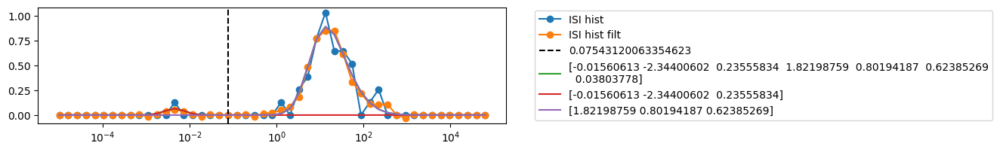

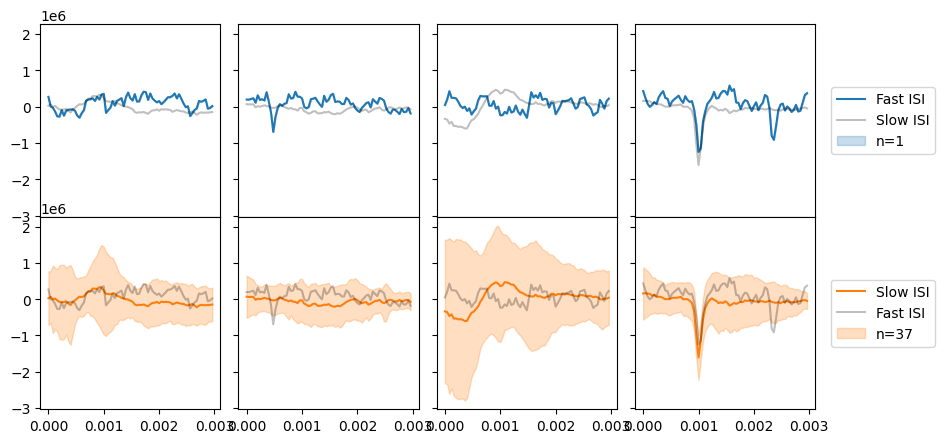

In [7]:
# # Calculate statistics for each unit in df_units
# # wet = df_units_qual.loc['1133-WT-ca1o-1', 'Waveforms'] # temp we for reference

# def skew_norm_pdf(x, shape, loc, scale):
#     return skewnorm.pdf(x, a=shape, loc=loc, scale=scale)

# def skew_norm_two_pdf(x, shape1, loc1, scale1, shape2, loc2, scale2, mix):
#     return skewnorm.pdf(x, a=shape1, loc=loc1, scale=scale1) * mix + skewnorm.pdf(x, a=shape2, loc=loc2, scale=scale2) * (1-mix)

# def norm_pdf(x, mean, std):
#     return norm.pdf(x, loc=mean, scale=std)

# def find_nearest_idx(array, value):
#     array = np.asarray(array)
#     idx = (np.abs(array - value)).argmin()
#     return idx

# def get_ISI_details(strain, unit_id, plotwaves=True):
#     isitrain = np.diff(strain)
#     bins_log = np.logspace(-5, 5, num=50)
#     bins_lin = np.linspace(-5, 5, num=50)
    
#     isiloghist, _ = np.histogram(isitrain, bins=bins_log)
#     isiloghist_filt = savgol_filter(isiloghist, 9, 5)
    
    
#     isiloghist = isiloghist / ( np.sum(isiloghist) * (bins_lin[1] - bins_lin[0]) )
#     isiloghist_filt = isiloghist_filt / ( np.sum(isiloghist_filt) * (bins_lin[1] - bins_lin[0]) )
#     fig, ax = plt.subplots(1, 1, figsize=(8, 2))
#     ax.semilogx(bins_log[:-1], isiloghist, 'o-', label='ISI hist')
#     ax.semilogx(bins_log[:-1], isiloghist_filt, 'o-', label='ISI hist filt')
#     isiloghist = isiloghist_filt
    
#     # popt, pcov = curve_fit(skew_norm_pdf, bins_lin[:-1], isiloghist, p0=[0, 0, 0.5], bounds=([-10, -5, 0.1], [10, 5, 5]))
#     # skewnormpdf = skew_norm_pdf(bins_lin[:-1], *popt)
#     # popt, _ = curve_fit(norm_pdf, bins_lin[:-1], isiloghist, p0=[0, 0.5])
#     # skewnormpdf = norm_pdf(bins_lin[:-1], *popt)

#     # Will need a try/catch in a good fit cannot be found
#     popt, pcov = curve_fit(skew_norm_two_pdf, bins_lin[:-1], isiloghist, p0=[0, -2, 0.5, 0, 1, 0.5, 0.5], bounds=([-10, -5, 0.1, -10, -5, 0.1, 0], [10, 5, 5, 10, 5, 5, 1]))
    
#     skewnormpdf = skew_norm_two_pdf(bins_lin[:-1], *popt)
#     skewnormpdf1 = skew_norm_pdf(bins_lin[:-1], *popt[0:3]) * popt[-1]
#     skewnormpdf2 = skew_norm_pdf(bins_lin[:-1], *popt[3:6]) * (1-popt[-1])
    
#     boundaries = (np.argmax(skewnormpdf1), np.argmax(skewnormpdf2))
#     boundary_idx = np.arange(min(boundaries), max(boundaries))
#     boundary_idx_change = np.diff(np.sign(skewnormpdf1[boundary_idx] - skewnormpdf2[boundary_idx])).nonzero()[0]
#     if boundary_idx_change.size != 0:
#         boundary = bins_log[boundary_idx[boundary_idx_change[0]]]
#         ax.axvline(boundary, color='black', ls='--', label=boundary)

#     # perr = np.sqrt(np.diag(pcov)) # Report goodness of fit
    
#     ax.plot(bins_log[:-1], skewnormpdf, label=popt)
#     ax.plot(bins_log[:-1], skewnormpdf1, label=popt[0:3])
#     ax.plot(bins_log[:-1], skewnormpdf2, label=popt[3:6])
#     ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
#     plt.show()

#     if boundary_idx_change.size != 0 and plotwaves:
#         waves_fast = we.get_waveforms(unit_id)[1:, :, :][isitrain < boundary, :, :]
#         waves_slow = we.get_waveforms(unit_id)[1:, :, :][isitrain >= boundary, :, :]
#         waves = [waves_fast, waves_slow]
        
#         fig, ax = plt.subplots(2, 4, figsize=(10, 5), sharex=True, sharey=True)
#         plt.subplots_adjust(wspace=0.1, hspace=0)
#         x = np.arange(waves_fast.shape[1]) / we.sampling_frequency
#         for i, wv in enumerate(waves):
#             for j in range(wv.shape[2]):
#                 wmean = wv[:, :, j].mean(axis=0)
#                 wmean_other = waves[i-1][:, :, j].mean(axis=0)
#                 wstd = wv[:, :, j].std(axis=0)
#                 ax[i, j].plot(x, wmean, c=f'C{i}', label=f'{["Fast", "Slow"][i]} ISI')
#                 ax[i, j].plot(x, wmean_other, c='black', alpha=0.25, label=f'{["Fast", "Slow"][i-1]} ISI')
#                 ax[i, j].fill_between(x, wmean - wstd, wmean + wstd, color=f'C{i}', alpha=0.25, label=f'n={wv.shape[0]}')
#                 if j == wv.shape[2]-1:
#                     ax[i, j].legend(loc='center left', bbox_to_anchor=(1.05, 0.5))

#     return popt

# for idx, row in df_units.iterrows():
#     we = row['Waveforms']
#     unit_id = int(idx.split('-')[-1])
    
#     df_units.loc[idx, 'Amplitude'] = spost.compute_spike_amplitudes(we, outputs='by_unit')[0][unit_id].mean() / 1e6 # uV to V
    
#     tmet = spost.compute_template_metrics(we)
#     df_units.loc[idx, 'P-T Ratio'] = tmet.loc[unit_id, 'peak_trough_ratio']
#     df_units.loc[idx, 'Recovery Slope'] = tmet.loc[unit_id, 'recovery_slope']
#     df_units.loc[idx, 'Repolarization Slope'] = tmet.loc[unit_id, 'repolarization_slope']
    
#     isihist, isix = spost.compute_isi_histograms_numpy(we.sorting, window_ms=10000.0, bin_ms=1)
#     isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
#     isihistcu = np.cumsum(isihist, axis=1)
#     medians = np.array([np.interp(0.5, isihistcu[i, :], isix[:-1]) for i in range(isihist.shape[0])])
    
#     df_units.loc[idx, 'Mode ISI'] = isix[np.argmax(isihist[unit_id-1, :])] / 1000 # seconds
#     df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz
#     df_units.loc[idx, 'Median ISI'] = medians[unit_id-1] / 1000 # seconds
#     df_units.loc[idx, 'Median ISI Rate'] = 1 / df_units.loc[idx, 'Median ISI']  # ms to seconds

#     strain = we.sorting.get_unit_spike_train(unit_id) / we.sampling_frequency
#     popt = get_ISI_details(strain, unit_id, plotwaves=True)
#     df_units.loc[idx, 'Slow ISI Skew'] = popt[0]
#     df_units.loc[idx, 'Fast ISI Skew'] = popt[3]
    
#     df_units.loc[idx, 'Firing Rate'] = we.sorting.count_num_spikes_per_unit()[unit_id] / we.recording.get_total_duration()

#     df_units.loc[idx, 'Half Width'] = spost.template_metrics.get_half_width(we.get_template(unit_id)[:, si.get_template_extremum_channel(we, outputs='index')[unit_id]], we.sampling_frequency)
#     # print(df_units.loc[idx, 'Half Width'])




In [8]:
# exclude_cols = ['ID', 'Genotype', 'Region', 'Naive Optimal Depth', 'Filename', 'Waveforms', 'Units']
# include_cols = [x for x in df_units.columns if x not in exclude_cols]
# print(exclude_cols)
# print(include_cols)


['ID', 'Genotype', 'Region', 'Naive Optimal Depth', 'Filename', 'Waveforms', 'Units']
['Amplitude', 'P-T Ratio', 'Recovery Slope', 'Repolarization Slope', 'Mode ISI', 'Mode ISI Rate', 'Median ISI', 'Median ISI Rate', 'Slow ISI Skew', 'Fast ISI Skew', 'Firing Rate', 'Half Width']


## Calculate Unit Quality Metrics

In [9]:
# # Calculate quality metrics for each unit in df_units
# df_units_qual = df_units
# df_units_qual = df_units_qual.drop(columns=include_cols)

# # display(wet.recording.get_property_keys())
# # display(wet.recording.get_property('gain_to_uV'))

# for idx, row in df_units_qual.iterrows():
#     we = row['Waveforms']
#     unit_id = int(idx.split('-')[-1])
#     n_units = we.sorting.get_num_units()
    
#     # df_units_qual.loc[idx, 'Amplitude Cutoff'] = sqm.compute_amplitude_cutoffs(we, num_histogram_bins=100, amplitudes_bins_min_ratio=3)[unit_id]
    
#     # Calculate Principal Components
#     pc = spost.compute_principal_components(we, mode='concatenated')
#     pcs = pc.get_all_projections()[1]
#     pc_labels = pc.get_all_projections()[0]

#     # Calculate metrics
#     df_units_qual.loc[idx, 'Amplitude CV Median'] = sqm.compute_amplitude_cv_metrics(we, average_num_spikes_per_bin=25)[0][unit_id] # Smaller is better
#     df_units_qual.loc[idx, 'Amplitude CV Range'] = sqm.compute_amplitude_cv_metrics(we, average_num_spikes_per_bin=25)[1][unit_id] # Smaller is better
#     df_units_qual.loc[idx, 'Amplitude Median'] = sqm.compute_amplitude_medians(we)[unit_id] # Larger is better
    
#     if n_units == 1:
#         df_units_qual.loc[idx, 'D-Prime'] = np.nan
#     else:
#         df_units_qual.loc[idx, 'D-Prime'] = sqm.lda_metrics(pcs, pc_labels, unit_id) # Larger is better, uses Linear Discriminant Analysis

#     df_units_qual.loc[idx, 'Firing Rate'] = sqm.compute_firing_rates(we)[unit_id] # Smaller is better, but for bursting neurons can be large
#     df_units_qual.loc[idx, 'Firing Range'] = sqm.compute_firing_ranges(we)[unit_id] # Smaller is better, but for bursting neurons can be large

#     df_units_qual.loc[idx, 'ISI Violation Ratio'] = sqm.compute_isi_violations(we, isi_threshold_ms=1.0)[0][unit_id] # Smaller is better. May exceed 1 if correlated contamination
    
#     iso_dist, l_ratio = sqm.mahalanobis_metrics(pcs, pc_labels, unit_id)
#     df_units_qual.loc[idx, 'Isolation Distance'] = iso_dist # Larger is better, though tetrodes are only so big
#     df_units_qual.loc[idx, 'L-Ratio'] = l_ratio # Smaller is better, can quantify contamination based on location of spikes in PCA-space

#     if n_units == 1:
#         nn_hit = nn_miss = nn_iso = nn_unit_id = nn_noise_over = np.nan
#     else:
#         nn_hit, nn_miss = sqm.nearest_neighbors_metrics(pcs, pc_labels, unit_id, max_spikes=1000, n_neighbors=5)
#         nn_iso, nn_unit_id = sqm.nearest_neighbors_isolation(we, unit_id)
#         nn_noise_over = sqm.nearest_neighbors_noise_overlap(we, unit_id)
    
#     df_units_qual.loc[idx, 'NN Hits'] = nn_hit # Larger is better, indicates contamination from neighbors
#     df_units_qual.loc[idx, 'NN Misses'] = nn_miss # Smaller is better, indicates under-detection of spikes
#     df_units_qual.loc[idx, 'NN Isolation'] = nn_iso # Larger is better, indicates worst-case cluster separation
#     df_units_qual.loc[idx, 'NN Unit ID'] = nn_unit_id # The most similar unit ID according to nearest-neighbors clustering
#     df_units_qual.loc[idx, 'NN Noise Overlap'] = nn_noise_over # Smaller is better, indicates a unit is noisy
    
#     df_units_qual.loc[idx, 'Presence Ratio'] = sqm.compute_presence_ratios(we)[unit_id] # Larger is better, though behavioral changes can violate

#     df_units_qual.loc[idx, 'SD Ratio'] = sqm.compute_sd_ratio(we)[unit_id] # Smaller is better, expected to be 1. Large values can indicate contamination or polymorphic spikes

#     if n_units == 1:
#         df_units_qual.loc[idx, 'Simple Silhouette'] = np.nan
#     else:
#         df_units_qual.loc[idx, 'Simple Silhouette'] = sqm.simplified_silhouette_score(pcs, pc_labels, unit_id) # Larger is better. Negative (-1) means contamination/under-detection
#     # ss_full = sqm.silhouette_score(pcs, pc_labels, unit_id) # The code seems to be bugged
#     # df_units_qual.loc[idx, 'Silhouette'] = ss_full # Larger is better. Negative (-1) means contamination/under-detection

#     df_units_qual.loc[idx, 'Sliding RP Violations'] = sqm.compute_sliding_rp_violations(we)[unit_id] # Smaller is better, like ISI violations

#     df_units_qual.loc[idx, 'SNR'] = sqm.compute_snrs(we)[unit_id] # Larger is better, means less noise

#     # sqm.compute_synchrony_metrics(we) # Does not give a direct report per unit, and may not be applicable because of high spatial localization of tetrodes


# display(df_units_qual.head())


Projecting waveforms: 100%|██████████████████████████████| 2/2 [00:00<00:00, 169.36it/s]
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv

,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude CV Median,Amplitude CV Range,Amplitude Median,...,NN Hits,NN Misses,NN Isolation,NN Unit ID,NN Noise Overlap,Presence Ratio,SD Ratio,Simple Silhouette,Sliding RP Violations,SNR
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,NaN,NaN,1334258.25,...,0.131148,0.046060,0.961765,2.0,0.092647,0.8,1.919234,0.136820,NaN,8.416593
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.133033,0.106814,1972938.75,...,0.883489,0.103839,0.957384,3.0,0.013291,1.0,1.107618,0.276770,NaN,9.978686
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.211586,0.165604,1094443.00,...,0.897260,0.116053,0.957595,2.0,0.048592,1.0,0.979450,0.292130,NaN,5.634819
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.226987,0.109206,3413978.00,...,0.937243,0.011229,0.975875,2.0,0.010506,1.0,3.717195,0.398578,NaN,21.717373
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.211444,0.258239,2385662.50,...,0.807554,0.162521,0.917039,3.0,0.019545,1.0,2.913763,0.304229,NaN,15.419251


In [10]:
include_cols_qual = [x for x in df_units_qual.columns if x not in exclude_cols]
print(include_cols_qual)

qual_compare = {'Amplitude CV Median' : (np.less, 1.0),
                'Amplitude Median' : (np.less, 6e6), #  <8 mV
                'ISI Violation Ratio' : (np.less, 5.0), # Throws out well correlated noise spikes. Maybe not a bad thing considering we are testing correlations?
                'NN Noise Overlap' : (np.less, 0.3), # Signals would only be 75% isolated from the noise
                'SD Ratio' : (np.less, 5), # Large values indicate spike contamination
                'SNR' : (np.greater, 0.5)}


['Amplitude CV Median', 'Amplitude CV Range', 'Amplitude Median', 'D-Prime', 'Firing Rate', 'Firing Range', 'ISI Violation Ratio', 'Isolation Distance', 'L-Ratio', 'NN Hits', 'NN Misses', 'NN Isolation', 'NN Unit ID', 'NN Noise Overlap', 'Presence Ratio', 'SD Ratio', 'Simple Silhouette', 'Sliding RP Violations', 'SNR']


## Remove Low Quality Units

/tmp/ipykernel_4191897/3923531063.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45, horizontalalignment='right')


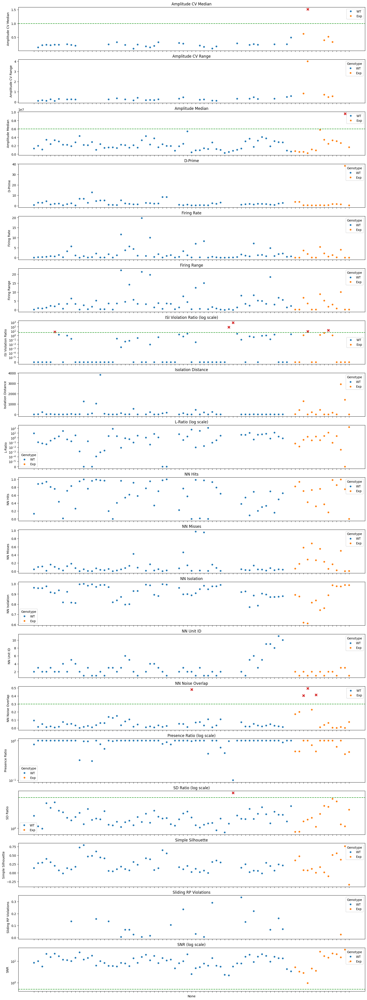

In [11]:
df_units_qual_allvalid = df_units_qual
fig, ax = plt.subplots(len(include_cols_qual), 1, figsize=(20, 3 * len(include_cols_qual)), sharex=True)
for i, qual in enumerate(include_cols_qual):
    if "Ratio" in qual or "SNR" in qual:
        # ax[0].set_yscale("log")
        ax[i].set_yscale("symlog", linthresh=1e-5)
        ax[i].set_title(f"{qual} (log scale)")
    else:
        ax[i].set_title(f"{qual}")
        
    plot = sns.scatterplot(data=df_units_qual, x=df_units_qual.index, y=qual, hue='Genotype', ax=ax[i])
    if i != len(include_cols_qual)-1:
        plot.set(xticklabels=[])

    if qual in qual_compare.keys():
            
        func, threshold = qual_compare[qual]
        df_units_qual_valid = df_units_qual[func(df_units_qual[qual], threshold)]
        df_units_qual_allvalid = df_units_qual_allvalid[func(df_units_qual_allvalid[qual], threshold) | np.invert(df_units_qual_allvalid[qual].notna())]
        df_units_qual_omit = df_units_qual[np.invert(func(df_units_qual[qual], threshold))]
        
        sns.scatterplot(data=df_units_qual_omit, x=df_units_qual_omit.index, y=qual, marker='X', c='C3', s=100, ax=ax[i])
        ax[i].axhline(threshold, c='C2', ls='--')


plot.set_xticklabels(plot.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In [12]:
allvalid_idx = list(df_units_qual_allvalid.index.values)

# Individual, large N data with labeled True/False validity
for idx, row in df_units.iterrows():
    if idx in allvalid_idx:
        df_units.loc[idx, 'Valid'] = True
    else:
        df_units.loc[idx, 'Valid'] = False
display(df_units.head())

# Aggregate, small N data
df_units_avgs = df_units[df_units['Valid']].groupby(['ID', 'Genotype', 'Region'])[include_cols].mean().reset_index()
display(df_units_avgs.head())

,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width,Valid
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1380303.750,-0.294900,-3.430370e+08,4.563134e+09,7.319,0.136631,8.41400,0.118850,4.514486,-0.006936,0.036957,0.00024,True
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1959315.750,-0.232559,-5.111473e+08,6.450244e+09,0.817,1.223990,4.26700,0.234357,1.432110,3.060253,0.257609,0.00020,True
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1106396.625,-0.193530,-1.900401e+08,3.150308e+09,0.947,1.055966,6.40100,0.156226,0.691192,-1.258620,0.308696,0.00020,True
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-3276414.250,-0.181414,-4.569853e+08,1.011188e+10,0.134,7.462687,0.18850,5.305040,0.598696,-3.256058,0.452465,0.00024,True
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-2383452.500,-0.180912,-3.944930e+08,4.529559e+09,0.096,10.416667,0.12725,7.858546,0.001105,-4.408912,0.774648,0.00020,True


,ID,Genotype,Region,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width
0,1133,WT,ca1o,-1482005.375,-0.240330,-3.480748e+08,4.721229e+09,3.027667,0.805529,6.360667,0.169811,2.212596,0.598232,0.201087,0.000213
1,1133,WT,ca3,-2829933.500,-0.181163,-4.257391e+08,7.320720e+09,0.115000,8.939677,0.157875,6.581793,0.299900,-3.832485,0.613556,0.000220
2,1176,WT,ca1o,-2470665.000,-0.221170,-3.832663e+08,6.282725e+09,0.126600,11.152734,0.903400,1.335629,2.374313,-1.858842,2.307143,0.000216
3,1176,WT,ca3,-3392577.500,-0.147817,-3.439047e+08,2.155974e+10,0.170500,6.955209,0.201150,5.915272,0.005567,-2.091718,0.386980,0.000200
4,1178,WT,ca1s,-1960927.625,-0.237275,-4.245411e+08,7.155517e+09,0.807333,3.053150,3.539500,0.300906,0.644834,1.410713,0.816761,0.000267


## Visualize All High Quality Units

0 ['1133', 'WT', 'ca1o', '1']
1 ['1133', 'WT', 'ca1o', '2']
2 ['1133', 'WT', 'ca1o', '3']
3 ['1133', 'WT', 'ca3', '1']
4 ['1133', 'WT', 'ca3', '2']
5 ['1133', 'WT', 'ca3', '3']
6 ['1176', 'WT', 'ca1o', '1']
7 ['1176', 'WT', 'ca1o', '2']
8 ['1176', 'WT', 'ca1o', '3']
9 ['1176', 'WT', 'ca1o', '4']
10 ['1176', 'WT', 'ca1o', '5']
11 ['1176', 'WT', 'ca3', '1']
12 ['1176', 'WT', 'ca3', '2']
13 ['1178', 'WT', 'ca1s', '1']
14 ['1178', 'WT', 'ca1s', '2']
15 ['1178', 'WT', 'ca1s', '3']
16 ['1203', 'WT', 'ca1o', '1']
17 ['1203', 'WT', 'ca1o', '2']
18 ['1211', 'WT', 'ca1o', '1']
19 ['1211', 'WT', 'ca1o', '2']
20 ['1211', 'WT', 'ca1o', '3']
21 ['1211', 'WT', 'ca1o', '4']
22 ['1211', 'WT', 'ca1o', '5']
23 ['1211', 'WT', 'ca1o', '6']
24 ['1211', 'WT', 'ca1s', '1']
25 ['1211', 'WT', 'ca1s', '2']
26 ['1211', 'WT', 'ca3', '1']
27 ['1225', 'WT', 'ca1o', '1']
28 ['1225', 'WT', 'ca1o', '2']
29 ['1225', 'WT', 'ca1o', '3']
30 ['1225', 'WT', 'ca1o', '4']
31 ['1225', 'WT', 'ca1s', '1']
32 ['1225', 'WT', 'ca1s'

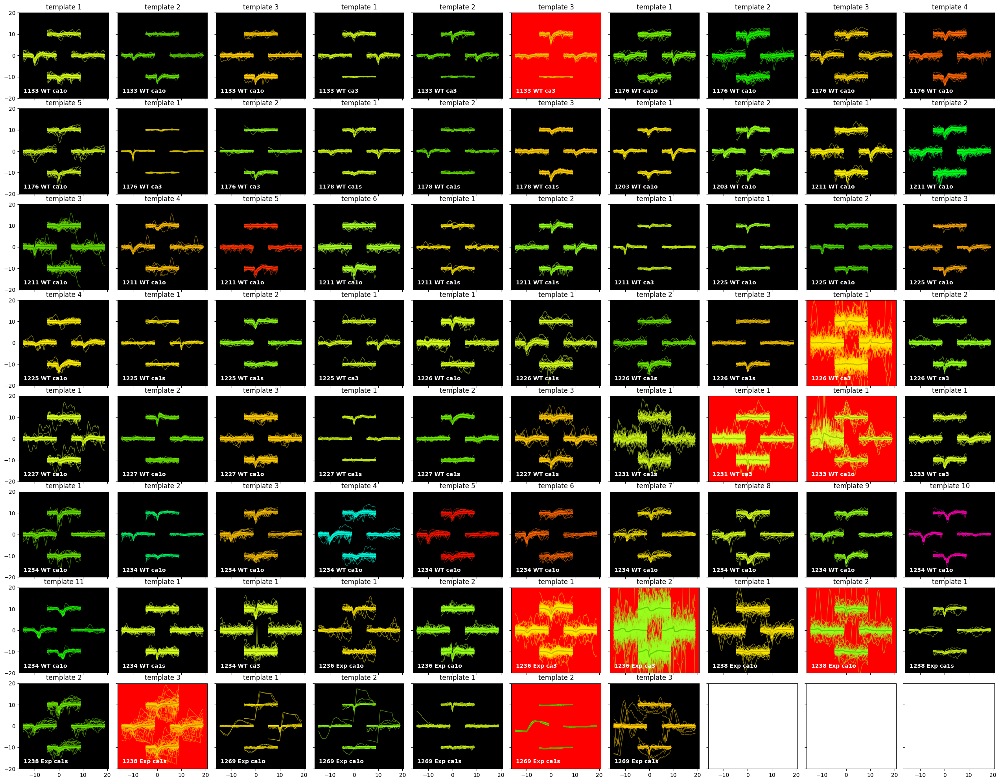

In [13]:
n_plot_cols = 10
n_plots = len(df_units)
n_plot_rows = int(np.ceil(n_plots / n_plot_cols))
x_subplot_size = 4

# display(df_units[df_units['Valid']])
# display(len(df_units[df_units['Valid']]))
# break

fig, ax = plt.subplots(n_plot_rows, n_plot_cols, sharex=True, sharey=True, figsize=(n_plot_rows * x_subplot_size, 25))
plt.subplots_adjust(wspace=0.1, hspace=0.12)
ax[0,0].set_ylim(-20, 20)

for i in range(n_plot_rows):
    for j in range(n_plot_cols):
        # ax[i, j].scatter(np.random.normal(size=10), np.random.normal(size=10))
        rowidx = i * n_plot_cols + j

        if rowidx >= n_plots:
            continue
        
        we = df_units.iloc[rowidx, :].loc['Waveforms']
        idxlist = df_units.index[rowidx].split('-')
        unitidx = int(idxlist[-1])
        
        # print(we)
        print(rowidx, idxlist)

        if df_units.iloc[rowidx, :].loc['Valid']:
            ax[i, j].set_facecolor('black')
        else:
            ax[i, j].set_facecolor('red')
            
        # sw.plot_unit_templates(we, unit_ids=[unitidx], plot_templates=True, ax=ax[i, j], scale=3e15, same_axis=True)
        sw.plot_unit_waveforms(we, unit_ids=[unitidx], plot_templates=True, ax=ax[i, j], scale=3e15, same_axis=True, plot_legend=False)
        # sw.plot_unit_waveforms(we, ax=ax[i, j], same_axis=True, scale=3e15)
        # sw.plot_unit_waveforms_density_map(we, use_max_channel=True, unit_ids=[unitidx], ax=ax[i, j])

        ax[i, j].text(0.05, 0.05, f"{idxlist[0]} {idxlist[1]} {idxlist[2]}", 
                      transform=ax[i, j].transAxes, 
                      ha='left', va='bottom', c='white', fontsize='medium', fontweight='bold')

plt.show()

## Plot Spike Statistics

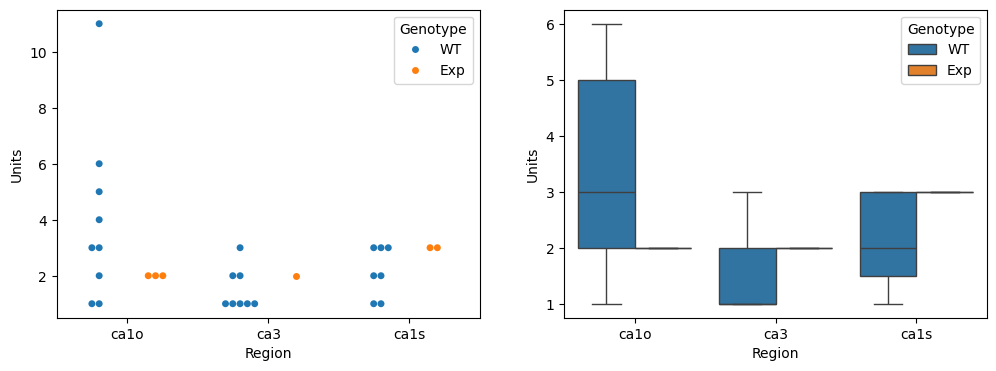

In [40]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
plt.subplots_adjust(wspace=0.2)
sns.swarmplot(data=df_opts_valid, x='Region', y='Units', hue='Genotype', dodge=True, ax=ax[0])
sns.boxplot(data=df_opts_valid, x='Region', y='Units', hue='Genotype', dodge=True, ax=ax[1], showfliers=False)
plt.savefig(base_folder_path / output_folder / "Unit Count")
plt.show()

In [57]:
# Add an extra row for the missing ca3 Exp genotype, to avoid StatAnnotations from crashing
# REMOVE IN THE FINAL RUNTHROUGH OF DATA
df_units.loc['9999-Exp-ca3-1'] = pd.Series({'ID':9999,
                                            'Genotype':'Exp',
                                            'Region':'ca3',
                                            'Filename':'name',
                                            'Waveforms':'waves',
                                            'Valid':True})
tempdf = df_units[(df_units['Region'] == 'ca3') & (df_units['Genotype'] == 'WT') & (df_units['Valid'])]
tempavg = tempdf.drop(columns=['ID', 'Genotype', 'Region', 'Filename', 'Waveforms', 'Valid']).mean()
df_units.loc['9999-Exp-ca3-1', tempavg.index] = tempavg
# df_units.loc['9999-Exp-ca3-1'] = df_units.loc['9999-Exp-ca3-1'].fillna(1)

display(df_units.tail())

,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width,Valid
1269-Exp-ca1o-2,1269,Exp,ca1o,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 2 units - 1 se...,2.0,-3.241955e+06,-0.195365,-4.596698e+08,9.398889e+09,0.093000,10.752688,0.114250,8.752735,0.289767,-3.647982,0.157579,0.000160,True
1269-Exp-ca1s-1,1269,Exp,ca1s,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-2.629005e+06,-0.144125,-4.104038e+08,2.928580e+10,0.055000,18.181818,1.747000,0.572410,3.692966,-2.986297,3.962481,0.000160,True
1269-Exp-ca1s-2,1269,Exp,ca1s,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-9.600930e+06,-0.859224,-3.469843e+09,3.483516e+10,0.000000,inf,NaN,NaN,-1.301406,-3.063968,0.017509,0.001200,False
1269-Exp-ca1s-3,1269,Exp,ca1s,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1.610217e+06,-0.025180,-2.696869e+07,8.321838e+09,0.137000,7.299270,0.136500,7.326007,-0.015606,1.821988,0.019510,0.000160,True
9999-Exp-ca3-1,9999,Exp,ca3,5.888889,name,waves,1.777778,-2.240749e+06,-0.214749,-4.453480e+08,1.134802e+10,0.692889,6.801070,1.151299,3.231806,1.263031,-1.539764,3.442456,0.000204,True


,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width,Valid
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1380303.750,-0.294900,-3.430370e+08,4.563134e+09,7.319,0.136631,8.41400,0.118850,4.514486,-0.006936,0.036957,0.00024,True
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1959315.750,-0.232559,-5.111473e+08,6.450244e+09,0.817,1.223990,4.26700,0.234357,1.432110,3.060253,0.257609,0.00020,True
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1106396.625,-0.193530,-1.900401e+08,3.150308e+09,0.947,1.055966,6.40100,0.156226,0.691192,-1.258620,0.308696,0.00020,True
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-3276414.250,-0.181414,-4.569853e+08,1.011188e+10,0.134,7.462687,0.18850,5.305040,0.598696,-3.256058,0.452465,0.00024,True
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-2383452.500,-0.180912,-3.944930e+08,4.529559e+09,0.096,10.416667,0.12725,7.858546,0.001105,-4.408912,0.774648,0.00020,True


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



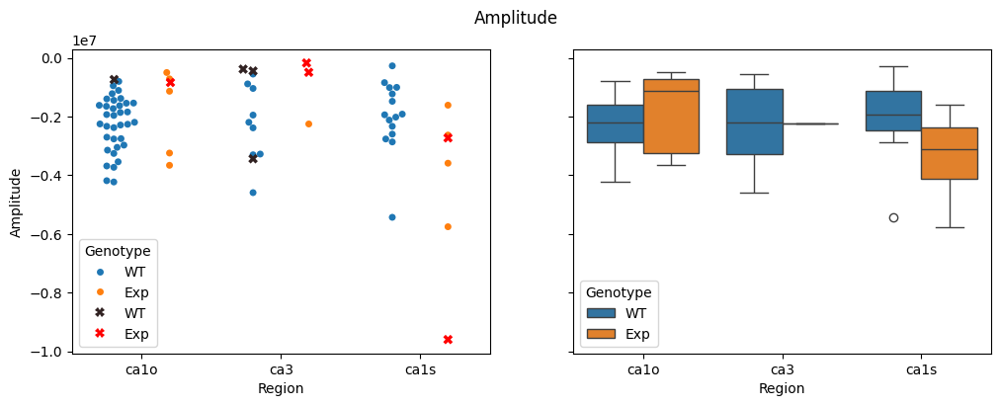

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:4.850e-02 U_stat=1.000e+01


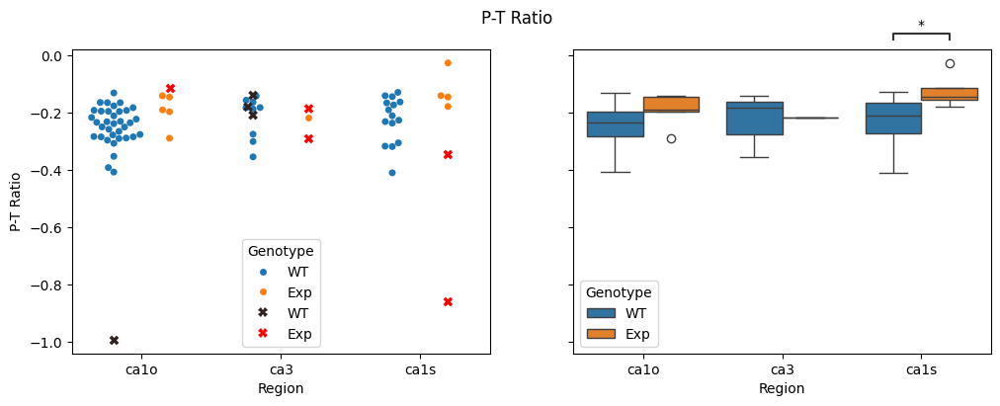

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



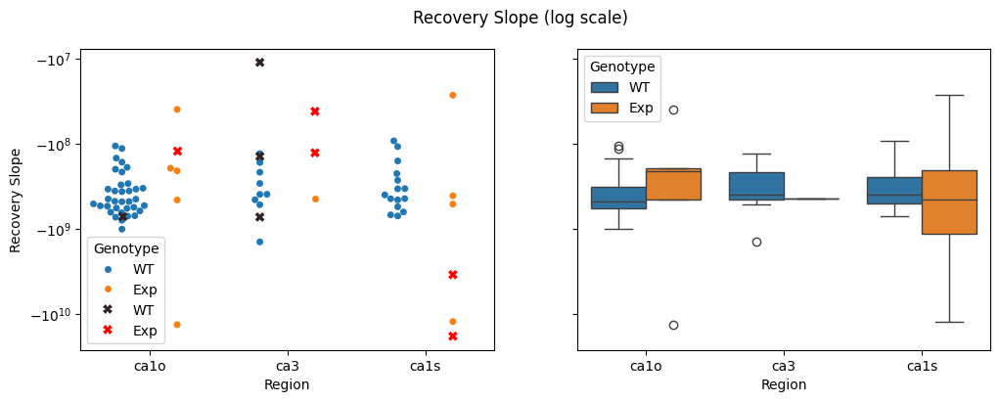

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1o_WT vs. ca1o_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:4.250e-02 U_stat=1.370e+02
ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:2.735e-02 U_stat=8.000e+00


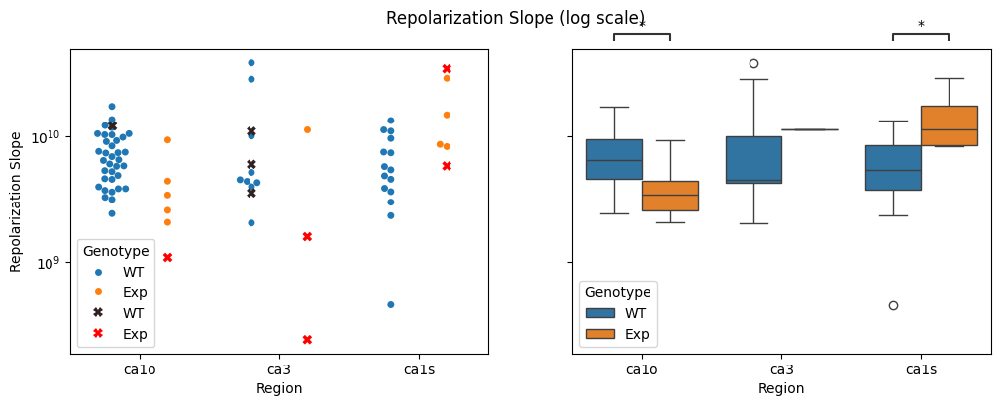

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



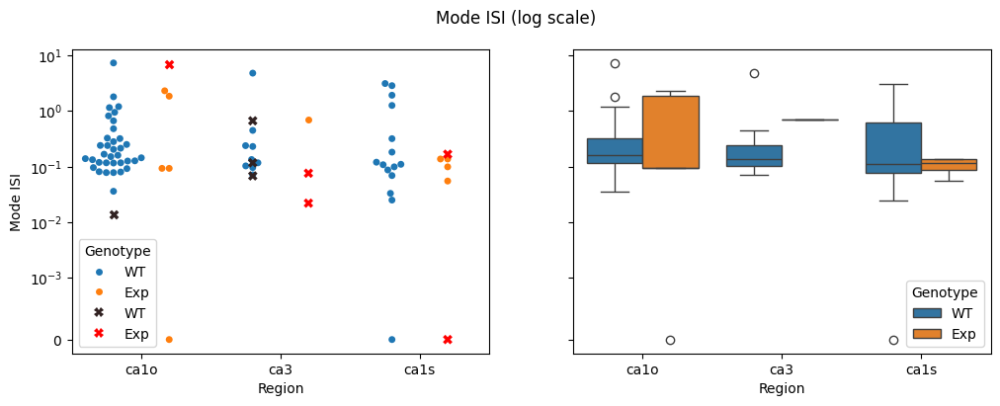

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



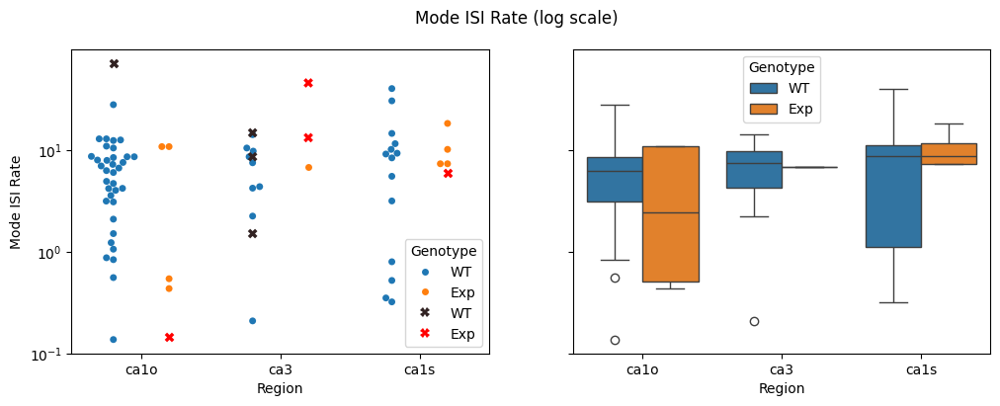

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:1.765e-02 U_stat=5.000e+01
ca3_WT vs. ca1s_WT: Mann-Whitney-Wilcoxon test two-sided, P_val:2.976e-02 U_stat=2.800e+01


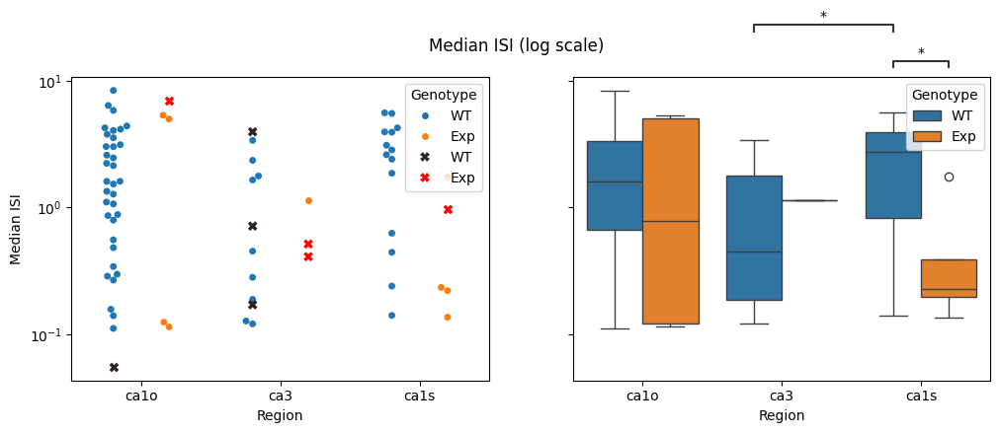

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:1.765e-02 U_stat=6.000e+00
ca3_WT vs. ca1s_WT: Mann-Whitney-Wilcoxon test two-sided, P_val:2.976e-02 U_stat=9.800e+01


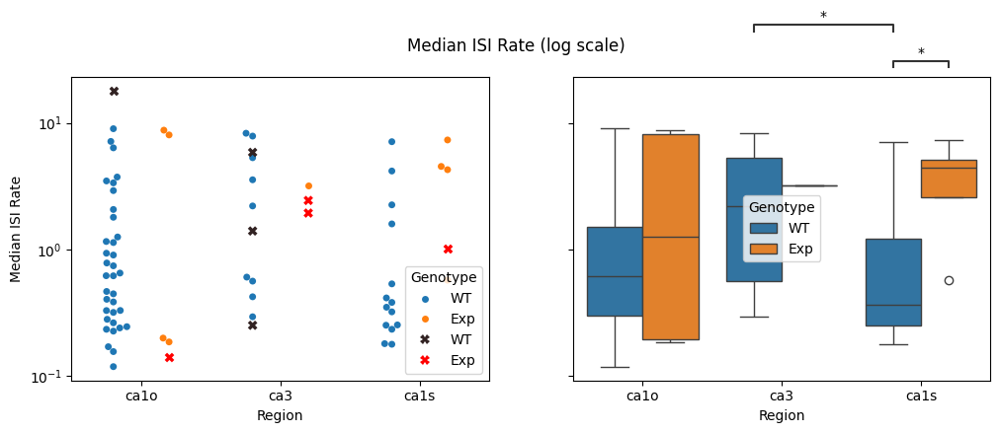

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



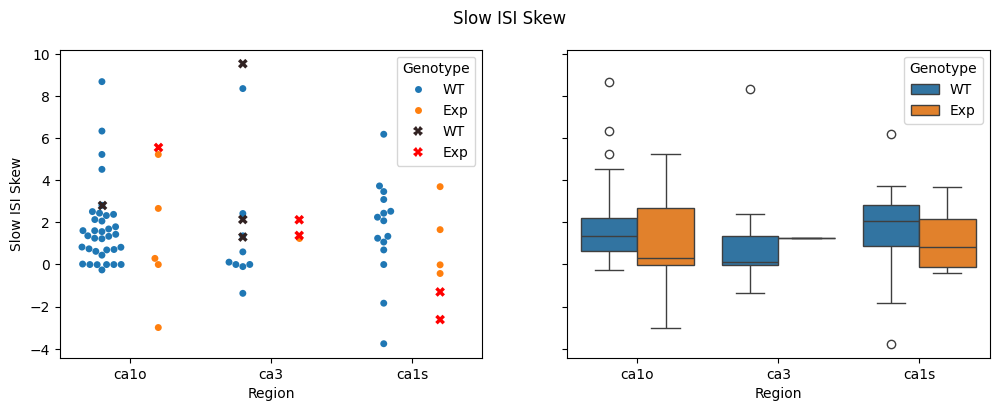

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



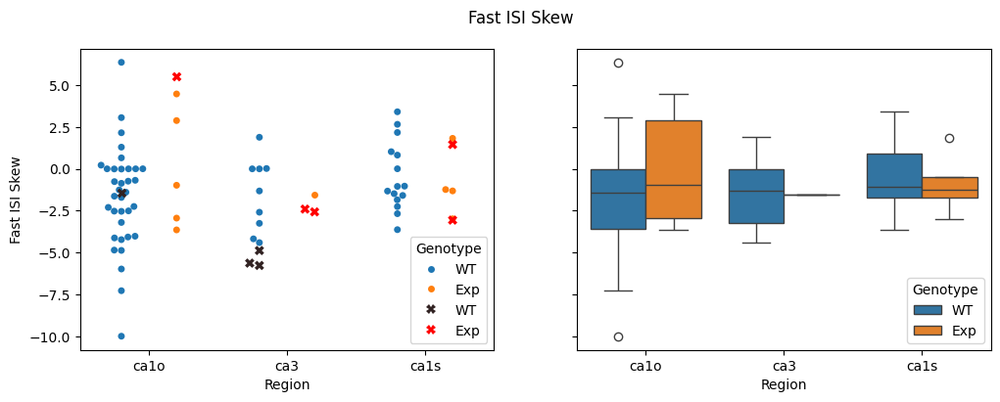

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1o_WT vs. ca1o_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:1.231e-02 U_stat=1.470e+02


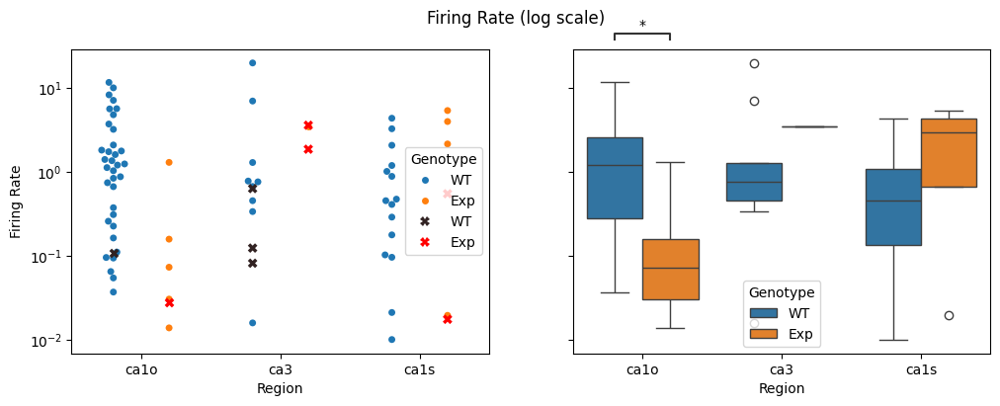

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1o_WT vs. ca1o_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:4.345e-02 U_stat=1.355e+02


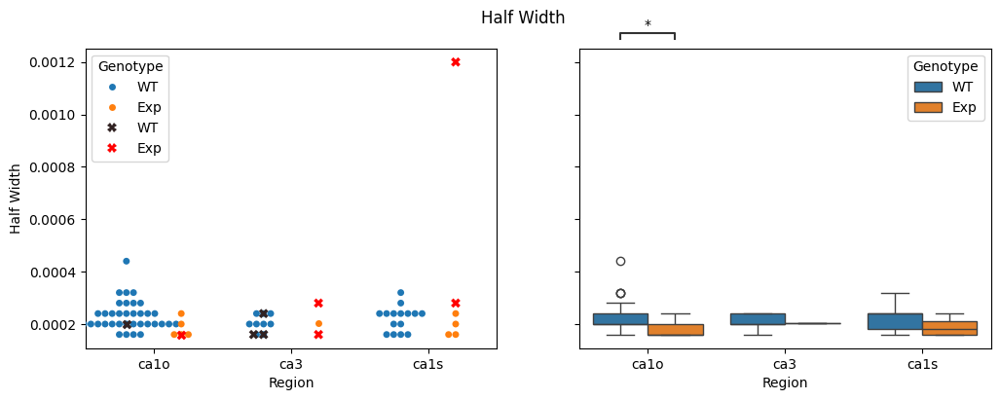

In [56]:
display(df_units.head())
metrics = include_cols
for met in metrics:
    fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    plt.subplots_adjust(wspace=0.2)
    
    if ("Slope" in met or "ISI" in met or "Rate" in met) and "Skew" not in met:
        # ax[0].set_yscale("log")
        ax[0].set_yscale("symlog", linthresh=1e-3)
        fig.suptitle(f"{met} (log scale)")
    else:
        fig.suptitle(f"{met}")
    
    sns.swarmplot(data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0])
    # sns.stripplot(data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0])
    sns.swarmplot(data=df_units[df_units['Valid'] == False], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0], marker='X', size=7, palette='dark:red', alpha=1)
    sns.boxplot(data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[1], showfliers=True)

    pairs=[
        (("ca1o", "WT"), ("ca1o", "Exp")), # WT vs Experimental
        (("ca3", "WT"), ("ca3", "Exp")),
        (("ca1s", "WT"), ("ca1s", "Exp")),
        (("ca1o", "WT"), ("ca1s", "WT")), # WT Regions vs.
        (("ca1s", "WT"), ("ca3", "WT")),
        (("ca3", "WT"), ("ca1o", "WT")),
        (("ca1o", "Exp"), ("ca1s", "Exp")), # Exp Regions vs.
        (("ca1s", "Exp"), ("ca3", "Exp")),
        (("ca3", "Exp"), ("ca1o", "Exp")),
    ]
    annotator = Annotator(ax[1], pairs, data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', hide_non_significant=True)
    annotator.apply_and_annotate()
    # starbars.draw_annotation(pairs, ax=ax[1])
    
    plt.savefig(base_folder_path / output_folder / f"{met}")
    plt.show()

In [ ]:
display(df_units_avgs.head())
metrics = include_cols
for met in metrics:
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    plt.subplots_adjust(wspace=0.2)
    sns.swarmplot(data=df_units_avgs, x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0])
    sns.boxplot(data=df_units_avgs, x='Region', y=met, hue='Genotype', dodge=True, ax=ax[1], showfliers=True)
    fig.suptitle(f"{met} (Aggregated)")
    plt.savefig(base_folder_path / output_folder / f"{met} (Aggregated)")
    plt.plot()
    